In [ ]:
# Importing packages, functions and datasets

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.collections import LineCollection
from scipy.signal import coherence
from scipy.optimize import curve_fit
from mpl_toolkits.mplot3d import Axes3D
from scipy import signal

import sys
sys.path.insert(0, r'C:\Users\jeanv\OneDrive - Delft University of Technology\Uitwisseling - TUDelft\Courses\MEP\Programming\extra')


from gradientAnalysis.functions import find_plateaus, analyze_drift, savgolCompilator, rangeSelector, coherenceData, powerlaw, powerlawFitter, singleWelch

from gradientAnalysis.dataPreparation import timerun2_1, CH0run2_1, CH1run2_1, CH2run2_1, CH3run2_1, timerun2_2, CH0run2_2, CH1run2_2, CH2run2_2, CH3run2_2, timerun3_1, CH0run3_1, CH1run3_1, CH2run3_1, CH3run3_1, timerun3_2, CH0run3_2, CH1run3_2, CH2run3_2, CH3run3_2
from gradientAnalysis.dataPreparation import timerun1, CH0run1, CH1run1, CH2run1, CH3run1
from gradientAnalysis.dataPreparation import temperatureTime_run2_1, temperatureTime_run3_1, temperatureTime_run3_2
from gradientAnalysis.dataPreparation import immersionTime_run2_1, immersionTime_run3_1, immersionTime_run3_2
from gradientAnalysis.dataPreparation import events_run2


from gradientAnalysis.plots import channelPlotter, coherencePlotter, coherenceFitPlotter, experimentPlotter, plot_thermal_results, savgolCalcPlotter, plotOverviewDashboard


# ---------- GLOBAL STYLE ----------
# Set Times New Roman as the default font
plt.rcParams['font.family'] = 'Arial'
plt.rcParams['mathtext.fontset'] = 'cm'  # Computer Modern for math symbols
#plt.rcParams['font.size'] = 12  # Base font size
plt.rcParams['axes.labelsize'] = 20  # Font size for axis labels
plt.rcParams['axes.titlesize'] = 22  # Font size for titles
plt.rcParams['xtick.labelsize'] = 15  # Font size for tick labels
plt.rcParams['ytick.labelsize'] = 15  # Font size for tick labels
#plt.rcParams['legend.fontsize'] = 12  # Font size for legends
# Set default line width for all plots (change this value to adjust thickness)
#plt.rcParams['lines.linewidth'] = 0.75


Time length: 8932


C:\Users\jeanv\OneDrive - Delft University of Technology\Uitwisseling - TUDelft\Courses\MEP\Programming\extra\gradientAnalysis\plots.py:167: SyntaxWarning: invalid escape sequence '\p'
  label='Measured Exponent $b \pm \sigma$', markersize=0.5)
C:\Users\jeanv\OneDrive - Delft University of Technology\Uitwisseling - TUDelft\Courses\MEP\Programming\extra\gradientAnalysis\plots.py:203: SyntaxWarning: invalid escape sequence '\p'
  label='Coherence $b \pm \sigma$')
C:\Users\jeanv\OneDrive - Delft University of Technology\Uitwisseling - TUDelft\Courses\MEP\Programming\extra\gradientAnalysis\plots.py:263: SyntaxWarning: invalid escape sequence '\p'
  label='Coherence $b \pm \sigma$')


## Immersion Depth and Furnace Temperature profiles

Plot 1: Run 2 \
Plot 2: Run 3.1 & Run 3.2 combined

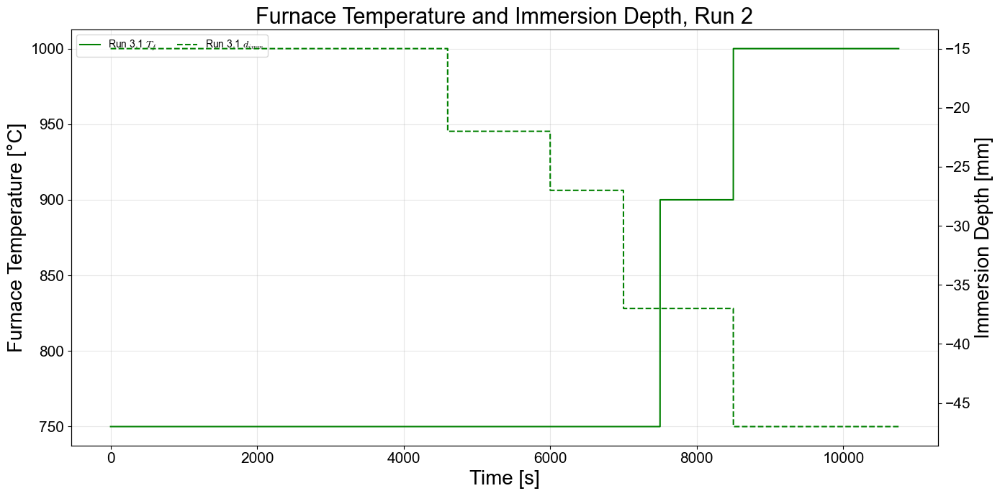

In [ ]:
# Furnace Temperature and Immersion Depth: Run 2

fig, ax1 = plt.subplots(figsize=(14, 7))
ax2 = ax1.twinx()

ax1.plot(temperatureTime_run2_1[:, 0], temperatureTime_run2_1[:, 1], 
         color='green', label='Run 3.1 $T_f$', lw=1.5)
ax2.plot(immersionTime_run2_1[:, 0], immersionTime_run2_1[:, 1], 
         color='green', label='Run 3.1 $d_{imm}$', ls='--', lw=1.5)

ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Furnace Temperature [°C]')
ax2.set_ylabel('Immersion Depth [mm]')
ax1.set_title('Furnace Temperature and Immersion Depth, Run 2')
ax1.grid(True, alpha=0.3)
# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='best', ncol=2)

plt.tight_layout()
plt.show()

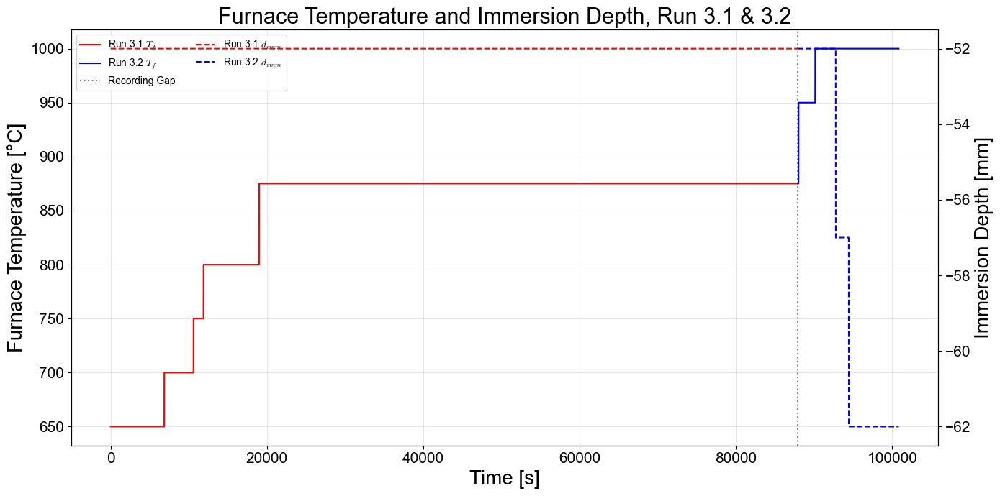

<Figure size 640x480 with 0 Axes>

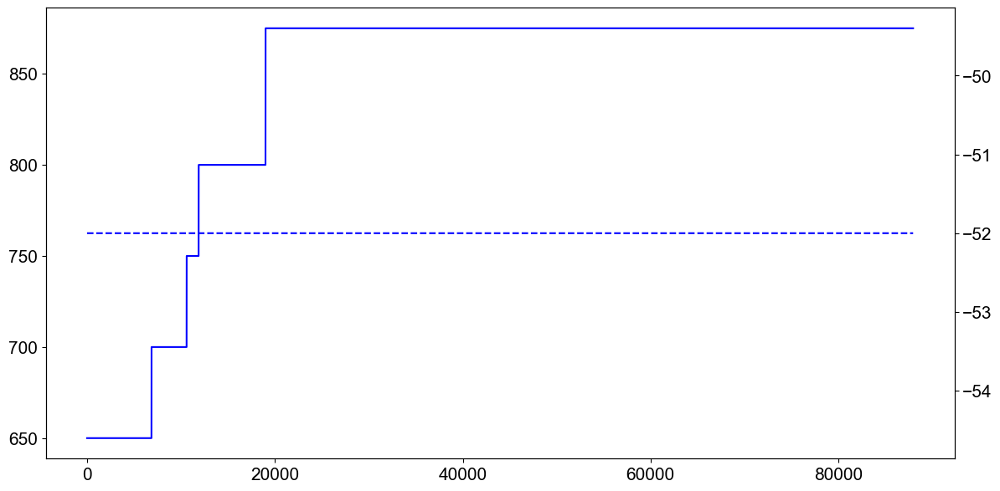

In [ ]:
# Furnace Temperature and Immersion Depth: Run 3.1 and Run 3.2
offset = temperatureTime_run3_1[-1, 0] 

# Shift time of Run 3_2
timerun3_2_shifted = temperatureTime_run3_2[:, 0] + offset
# Do the same for immersion time
immersion_time_run3_2_shifted = immersionTime_run3_2[:, 0] + offset

fig, ax1 = plt.subplots(figsize=(14, 7))
ax2 = ax1.twinx()

ax1.plot(temperatureTime_run3_1[:, 0], temperatureTime_run3_1[:, 1], 
         color='red', label='Run 3.1 $T_f$', lw=1.5)
ax2.plot(immersionTime_run3_1[:, 0], immersionTime_run3_1[:, 1], 
         color='red', label='Run 3.1 $d_{imm}$', ls='--', lw=1.5)

# Plot Run 2 (Shifted Time)
ax1.plot(timerun3_2_shifted, temperatureTime_run3_2[:, 1], 
         color='blue', label='Run 3.2 $T_f$', lw=1.5)
ax2.plot(immersion_time_run3_2_shifted, immersionTime_run3_2[:, 1], 
         color='blue', label='Run 3.2 $d_{imm}$', ls='--', lw=1.5)

# 
ax1.set_xlabel('Time [s]')
ax1.set_ylabel('Furnace Temperature [°C]')
ax2.set_ylabel('Immersion Depth [mm]')
ax1.set_title('Furnace Temperature and Immersion Depth, Run 3.1 & 3.2')
ax1.grid(True, alpha=0.3)

# Add a vertical line where the "Stitch" happened
ax1.axvline(offset, color='black', ls=':', alpha=0.5, label='Recording Gap')

# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='best', ncol=2)

plt.tight_layout()
plt.show()


plt.figure()
timerun3_2_shifted = temperatureTime_run3_2[:, 0]
# Do the same for immersion time
immersion_time_run3_2_shifted = immersionTime_run3_2[:, 0]



fig, ax = plt.subplots(figsize=(14, 7))
ax.plot(temperatureTime_run3_1[:, 0], temperatureTime_run3_1[:, 1], 
         color='blue', label='Run 3.2 $T_f$', lw=1.5)
ax2=ax.twinx()
ax2.plot(immersionTime_run3_1[:, 0], immersionTime_run3_1[:, 1], 
         color='blue', label='Run 3.2 $d_{imm}$', ls='--', lw=1.5)


# 4-Channel Plotting

Plotting channels 0-3 for Run 2, Run 3.1 and Run 3.2

In [ ]:
# Colors and Label Names

colors = ['#2E5C36', '#00DB27', "#8A424F", '#DB0028']
labels = ["Cold salt (CS)", "Hot salt (HS)", "Cold crucible (CC)", "Hot crucible (HC)"]


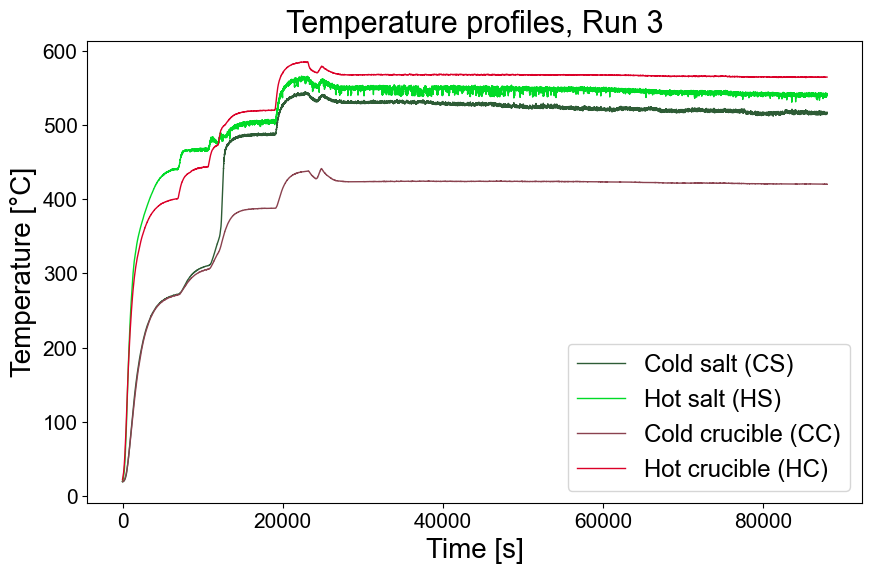

In [ ]:
# Channel 0-3 Plots for Run 2, Run 3.1 and Run 3.2
plot1 = channelPlotter([CH0run3_1, CH1run3_1, CH2run3_1, CH3run3_1], [timerun3_1], 
                      "Temperature profiles, Run 3", 
                      colors, None, None, labels=labels, linestyles=["-"])






87952.472


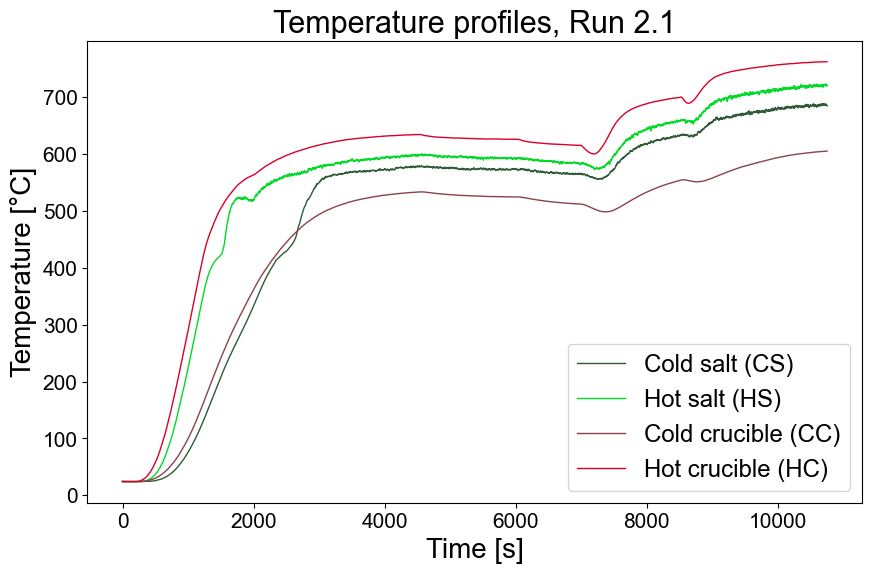

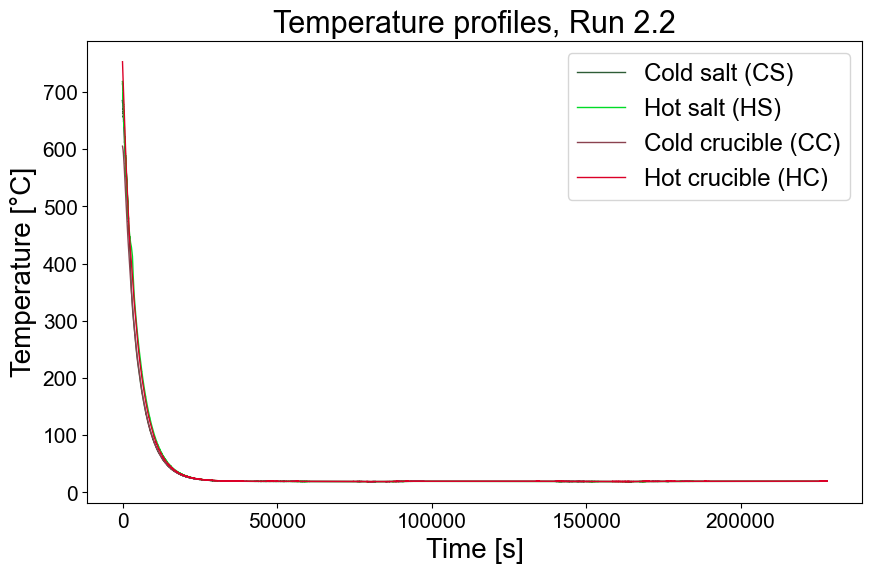

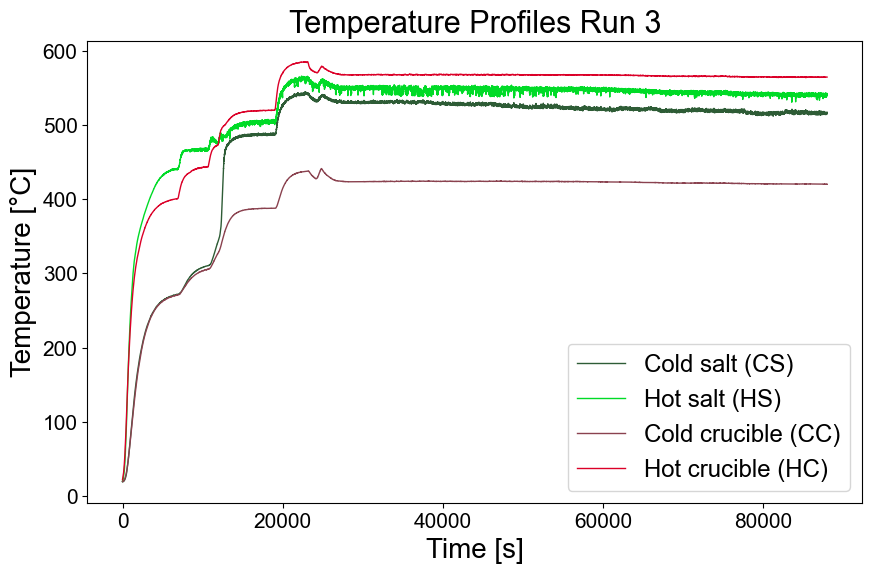

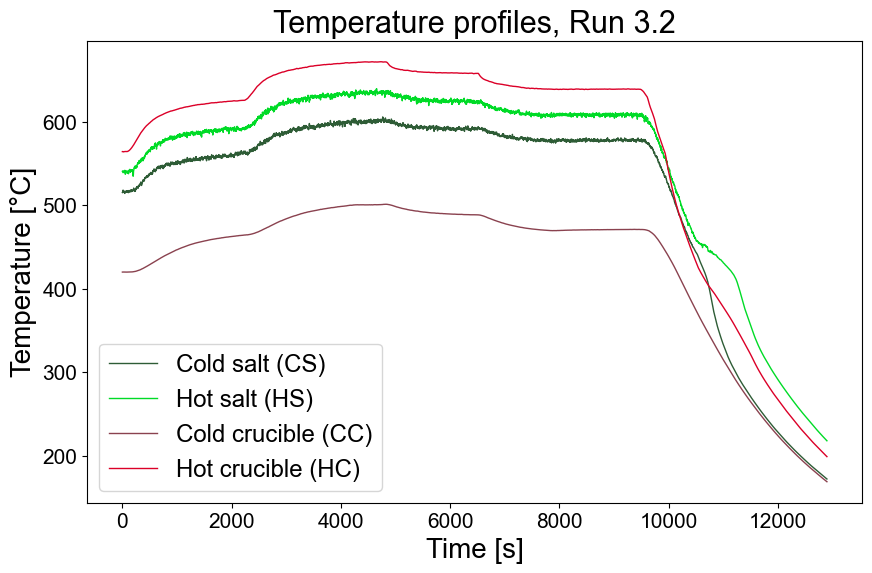

In [ ]:
# Channel 0-3 Plots for Run 2, Run 3.1 and Run 3.2
plot1 = channelPlotter([CH0run2_1, CH1run2_1, CH2run2_1, CH3run2_1], [timerun2_1], 
                      "Temperature profiles, Run 2.1", 
                      colors, None, None, labels=labels, linestyles=["-"])
# Channel 0-3 Plots for Run 2, Run 3.1 and Run 3.2
plot1 = channelPlotter([CH0run2_2, CH1run2_2, CH2run2_2, CH3run2_2], [timerun2_2], 
                      "Temperature profiles, Run 2.2", 
                      colors, None, None, labels=labels, linestyles=["-"])


plot2 = channelPlotter([CH0run3_1, CH1run3_1, CH2run3_1, CH3run3_1], [timerun3_1], 
                      "Temperature Profiles Run 3",
                      colors, None, None, labels=labels, linestyles=["-"])

plot3 = channelPlotter([CH0run3_2, CH1run3_2, CH2run3_2, CH3run3_2], [timerun3_2], 
                      "Temperature profiles, Run 3.2", 
                      colors, None, None, labels=labels, linestyles=["-"])


print(timerun3_1[-1])


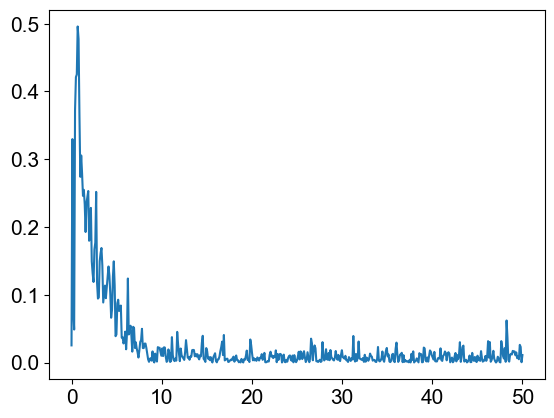

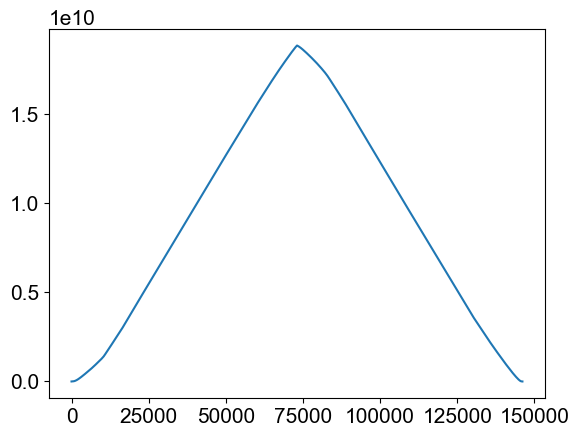

In [ ]:
f, r1 = signal.coherence(CH0run3_1, CH1run3_1, fs=100, nperseg=1024)
r2 = signal.correlate(CH0run3_1, CH1run3_1, mode="full")


plt.figure()
plt.plot(f, r1)

plt.figure()
plt.plot(np.arange(len(r2)), r2)

# Zoom on Channels in Run

With this zoom, we can identify the steady state region and later perform linear regression in a region of choice

In [ ]:
#Single Channel Tester (Run 3.1, CH1)
# singlechannel = channelPlotter([CH1run3_1], [timerun3_1], 
#                       "Temperature profiles, Run 3.1", 
#                       np.array([colors[1]]), [26000, 87000], None, labels=labels, linestyles=["-"])




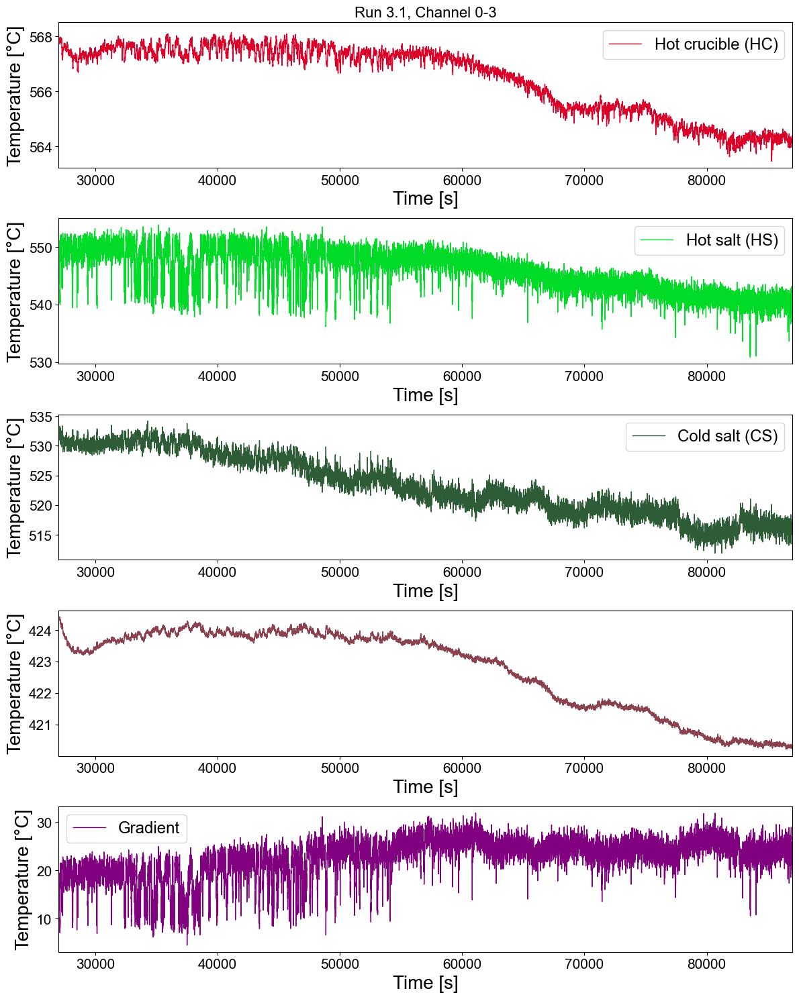

In [ ]:
#Zoom on Run 3.1: Ch0-3 and Gradient.
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(12, 15))

# Plot different things in each row using the SAME function
channelPlotter([CH3run3_1], [timerun3_1], None, 
               [colors[3]], [27000, 87000], None, labels=[labels[3]], linestyles=["-"], ax=ax1)

channelPlotter([CH1run3_1], [timerun3_1], None, 
               [colors[1]], [27000, 87000], None, labels=[labels[1]], linestyles=["-"], ax=ax2)

channelPlotter([CH0run3_1], [timerun3_1], None, 
               [colors[0]], [27000, 87000], None, labels=[labels[0]], linestyles=["-"], ax=ax3)


channelPlotter([CH2run3_1], [timerun3_1], None, 
               [colors[2]], [27000, 87000], None, labels=None, linestyles=["-"], ax=ax4)

channelPlotter([CH1run3_1-CH0run3_1], [timerun3_1], None, 
               ["purple"], [27000, 87000], None, labels=["Gradient"], linestyles=["-"], ax=ax5)

ax1.set_title("Run 3.1, Channel 0-3", fontsize=16)

plt.tight_layout()
plt.show()

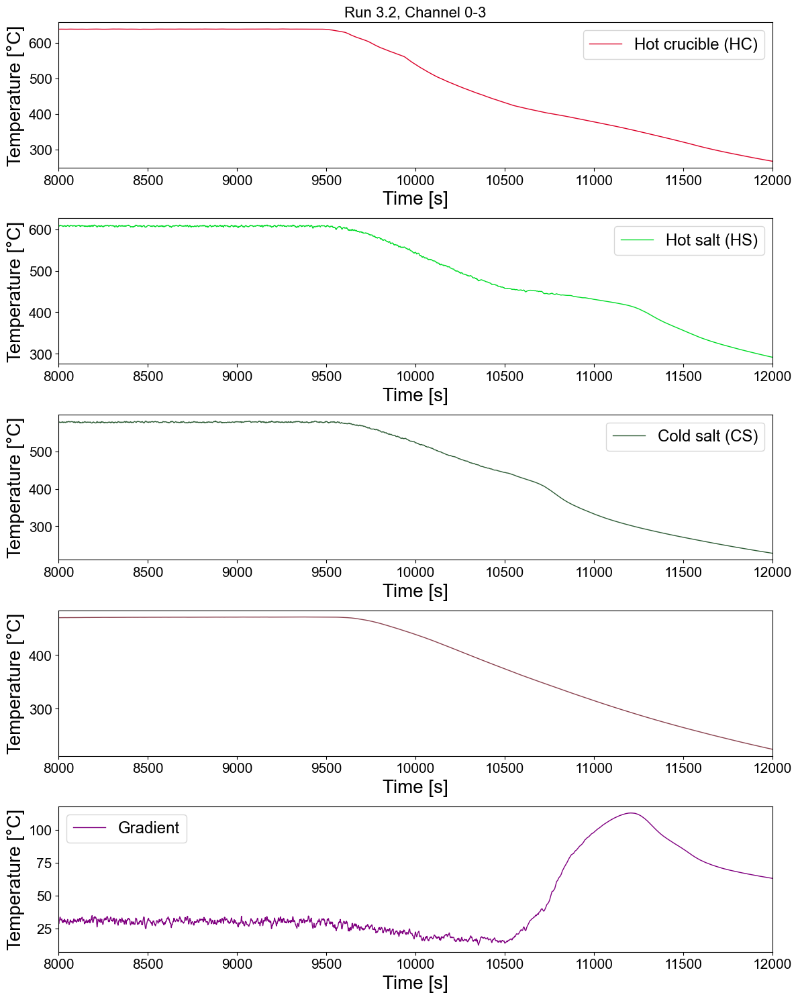

In [ ]:
#Zoom on Run 3.1: Ch0-3 and Gradient.
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(12, 15))

# Plot different things in each row using the SAME function
channelPlotter([CH3run3_2], [timerun3_2], None, 
               [colors[3]], [8000, 12000], None, labels=[labels[3]], linestyles=["-"], ax=ax1)

channelPlotter([CH1run3_2], [timerun3_2], None, 
               [colors[1]], [8000, 12000], None, labels=[labels[1]], linestyles=["-"], ax=ax2)

channelPlotter([CH0run3_2], [timerun3_2], None, 
               [colors[0]], [8000, 12000], None, labels=[labels[0]], linestyles=["-"], ax=ax3)


channelPlotter([CH2run3_2], [timerun3_2], None, 
               [colors[2]], [8000, 12000], None, labels=None, linestyles=["-"], ax=ax4)

channelPlotter([CH1run3_2-CH0run3_2], [timerun3_2], None, 
               ["purple"], [8000, 12000], None, labels=["Gradient"], linestyles=["-"], ax=ax5)

ax1.set_title("Run 3.2, Channel 0-3", fontsize=16)

plt.tight_layout()
plt.show()

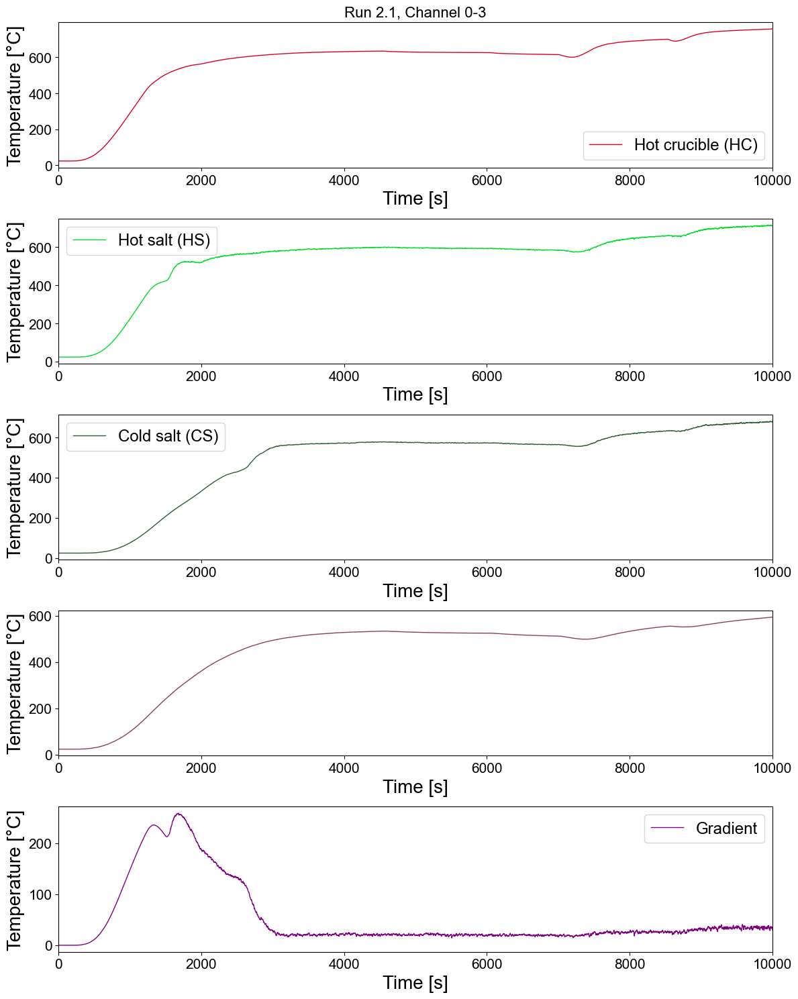

In [ ]:
#Zoom on Run 3.1: Ch0-3 and Gradient.
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(12, 15))

# Plot different things in each row using the SAME function
channelPlotter([CH3run2_1], [timerun2_1], None, 
               [colors[3]], [0, 10000], None, labels=[labels[3]], linestyles=["-"], ax=ax1)

channelPlotter([CH1run2_1], [timerun2_1], None, 
               [colors[1]], [0, 10000], None, labels=[labels[1]], linestyles=["-"], ax=ax2)

channelPlotter([CH0run2_1], [timerun2_1], None, 
               [colors[0]], [0, 10000], None, labels=[labels[0]], linestyles=["-"], ax=ax3)


channelPlotter([CH2run2_1], [timerun2_1], None, 
               [colors[2]], [0, 10000], None, labels=None, linestyles=["-"], ax=ax4)

channelPlotter([CH1run2_1-CH0run2_1], [timerun2_1], None, 
               ["purple"], [0, 10000], None, labels=["Gradient"], linestyles=["-"], ax=ax5)

ax1.set_title("Run 2.1, Channel 0-3", fontsize=16)

plt.tight_layout()
plt.show()

In [ ]:
# Analys Run 3.1 Preparation

# Parameters and data shortening to range
window_ch0 = 200
window_ch1 = 200
window_ch2 = 200
window_ch3 = 200
window_grad = window_ch0
poly_ch0 = 3
poly_ch1 = 3
poly_ch2 = 3
poly_ch3 = 3
poly_grad = poly_ch0

window_ch0_2 = 100
window_ch1_2 = 100
window_ch2_2 = 100
window_ch3_2 = 100
window_grad_2 = window_ch0_2
poly_ch0_2 = 3
poly_ch1_2 = 3
poly_ch2_2 = 3
poly_ch3_2 = 3
poly_grad_2 = poly_ch0_2



xmin = 0
xmax = timerun2_1[-1]

xmin_2 = 0
xmax_2 = 8000

# Run 3.1
## Channel 0
CH0_timeR, CH0_yR = rangeSelector(CH0run2_1, timerun2_1, [xmin, xmax])
## Channel 1 
CH1_timeR, CH1_yR = rangeSelector(CH1run2_1, timerun2_1, [xmin, xmax])
## Channel 2
CH2_timeR, CH2_yR = rangeSelector(CH2run2_1, timerun2_1, [xmin, xmax])
## Channel 3
CH3_timeR, CH3_yR = rangeSelector(CH3run2_1, timerun2_1, [xmin, xmax])
## Gradient
gradrun2_timeR, gradrun2_yR = rangeSelector(CH1run2_1-CH0run2_1, timerun2_1, [xmin, xmax])

## Channel 0
CH0_timeR_2, CH0_yR_2 = rangeSelector(CH0run2_2, timerun2_2, [xmin_2, xmax_2])
## Channel 1 
CH1_timeR_2, CH1_yR_2 = rangeSelector(CH1run2_2, timerun2_2, [xmin_2, xmax_2])
## Channel 2
CH2_timeR_2, CH2_yR_2 = rangeSelector(CH2run2_2, timerun2_2, [xmin_2, xmax_2])
## Channel 3
CH3_timeR_2, CH3_yR_2 = rangeSelector(CH3run2_2, timerun2_2, [xmin_2, xmax_2])
## Gradient
gradrun2_timeR_2, gradrun2_yR_2 = rangeSelector(CH1run2_2-CH0run2_2, timerun2_2, [xmin_2, xmax_2])

# Savgol calculation
CH0run2_1_f, CH0run2_1_d, CH0run2_1_fd = savgolCompilator(CH0_yR, window_ch0, poly_ch0, deriv=2, deriv_filtered=True)
CH1run2_1_f, CH1run2_1_d, CH1run2_1_fd = savgolCompilator(CH1_yR, window_ch1, poly_ch1, deriv=2, deriv_filtered=True)
CH2run2_1_f, CH2run2_1_d, CH2run2_1_fd = savgolCompilator(CH2_yR, window_ch2, poly_ch2, deriv=2, deriv_filtered=True)
CH3run2_1_f, CH3run2_1_d, CH3run2_1_fd = savgolCompilator(CH3_yR, window_ch3, poly_ch3, deriv=2, deriv_filtered=True)
gradrun2_1_f, gradrun2_1_d, gradrun2_1_fd = savgolCompilator(gradrun2_yR, window_grad, poly_grad, deriv=1, deriv_filtered=True)

# Savgol calculation # Run 3.2
CH0run2_2_f, CH0run2_2_d, CH0run2_2_fd = savgolCompilator(CH0_yR_2, window_ch0_2, poly_ch0_2, deriv=2, deriv_filtered=True)
CH1run2_2_f, CH1run2_2_d, CH1run2_2_fd = savgolCompilator(CH1_yR_2, window_ch1_2, poly_ch1_2, deriv=2, deriv_filtered=True)
CH2run2_2_f, CH2run2_2_d, CH2run2_2_fd = savgolCompilator(CH2_yR_2, window_ch2_2, poly_ch2_2, deriv=2, deriv_filtered=True)
CH3run2_2_f, CH3run2_2_d, CH3run2_2_fd = savgolCompilator(CH3_yR_2, window_ch3_2, poly_ch3_2, deriv=2, deriv_filtered=True)
gradrun2_2_f, gradrun2_2_d, gradrun2_2_fd = savgolCompilator(gradrun2_yR_2, window_grad_2, poly_grad_2, deriv=2, deriv_filtered=True)





print(np.mean(CH0run2_1_fd))
print(np.mean(CH1run2_1_fd))
print(np.mean(CH2run2_1_fd))
print(np.mean(CH3run2_1_fd))
print(np.mean(gradrun2_1_fd))
print(np.mean(gradrun2_1_f))

-5.49775492760692e-06
7.463431905373606e-06
1.1170687606245185e-06
-5.887050473757113e-07
0.004134357844103744
52.05585328285661


# Savintsky-Golay Smoothening and Derivative of individual channels
We here select a window to smooth and take the derivative of.


In [ ]:
# Analys Run 3.1 Preparation

# Parameters and data shortening to range
window_ch0 = 1024
window_ch1 = 1024
window_ch2 = 1024
window_ch3 = 1024
window_grad = window_ch0
poly_ch0 = 2
poly_ch1 = 2
poly_ch2 = 2
poly_ch3 = 2
poly_grad = poly_ch0

window_ch0_2 = 200
window_ch1_2 = 200
window_ch2_2 = 200
window_ch3_2 = 200
window_grad_2 = window_ch0_2
poly_ch0_2 = 2
poly_ch1_2 = 2
poly_ch2_2 = 2
poly_ch3_2 = 2
poly_grad_2 = poly_ch0_2



xmin = 28000
xmax = timerun3_1[-1]

xmin_2 = 0
xmax_2 = 11500

# Run 3.1
## Channel 0
CH0_timeR, CH0_yR = rangeSelector(CH0run3_1, timerun3_1, [xmin, xmax])
## Channel 1 
CH1_timeR, CH1_yR = rangeSelector(CH1run3_1, timerun3_1, [xmin, xmax])
## Channel 2
CH2_timeR, CH2_yR = rangeSelector(CH2run3_1, timerun3_1, [xmin, xmax])
## Channel 3
CH3_timeR, CH3_yR = rangeSelector(CH3run3_1, timerun3_1, [xmin, xmax])
## Gradient
gradrun3_timeR, gradrun3_yR = rangeSelector(CH1run3_1-CH0run3_1, timerun3_1, [xmin, xmax])

## Channel 0
CH0_timeR_2, CH0_yR_2 = rangeSelector(CH0run3_2, timerun3_2, [xmin_2, xmax_2])
## Channel 1 
CH1_timeR_2, CH1_yR_2 = rangeSelector(CH1run3_2, timerun3_2, [xmin_2, xmax_2])
## Channel 2
CH2_timeR_2, CH2_yR_2 = rangeSelector(CH2run3_2, timerun3_2, [xmin_2, xmax_2])
## Channel 3
CH3_timeR_2, CH3_yR_2 = rangeSelector(CH3run3_2, timerun3_2, [xmin_2, xmax_2])
## Gradient
gradrun3_timeR_2, gradrun3_yR_2 = rangeSelector(CH1run3_2-CH0run3_2, timerun3_2, [xmin_2, xmax_2])

# Savgol calculation
CH0run3_1_f, CH0run3_1_d, CH0run3_1_fd = savgolCompilator(CH0_yR, window_ch0, poly_ch0, deriv=1, deriv_filtered=True)
CH1run3_1_f, CH1run3_1_d, CH1run3_1_fd = savgolCompilator(CH1_yR, window_ch1, poly_ch1, deriv=1, deriv_filtered=True)
CH2run3_1_f, CH2run3_1_d, CH2run3_1_fd = savgolCompilator(CH2_yR, window_ch2, poly_ch2, deriv=1, deriv_filtered=True)
CH3run3_1_f, CH3run3_1_d, CH3run3_1_fd = savgolCompilator(CH3_yR, window_ch3, poly_ch3, deriv=1, deriv_filtered=True)
gradrun3_1_f, gradrun3_1_d, gradrun3_1_fd = savgolCompilator(gradrun3_yR, window_grad, poly_grad, deriv=1, deriv_filtered=True)

# Savgol calculation # Run 3.2
CH0run3_2_f, CH0run3_2_d, CH0run3_2_fd = savgolCompilator(CH0_yR_2, window_ch0_2, poly_ch0_2, deriv=1, deriv_filtered=True)
CH1run3_2_f, CH1run3_2_d, CH1run3_2_fd = savgolCompilator(CH1_yR_2, window_ch1_2, poly_ch1_2, deriv=1, deriv_filtered=True)
CH2run3_2_f, CH2run3_2_d, CH2run3_2_fd = savgolCompilator(CH2_yR_2, window_ch2_2, poly_ch2_2, deriv=1, deriv_filtered=True)
CH3run3_2_f, CH3run3_2_d, CH3run3_2_fd = savgolCompilator(CH3_yR_2, window_ch3_2, poly_ch3_2, deriv=1, deriv_filtered=True)
gradrun3_2_f, gradrun3_2_d, gradrun3_2_fd = savgolCompilator(gradrun3_yR_2, window_grad_2, poly_grad_2, deriv=1, deriv_filtered=True)



# Melting point

Change window size

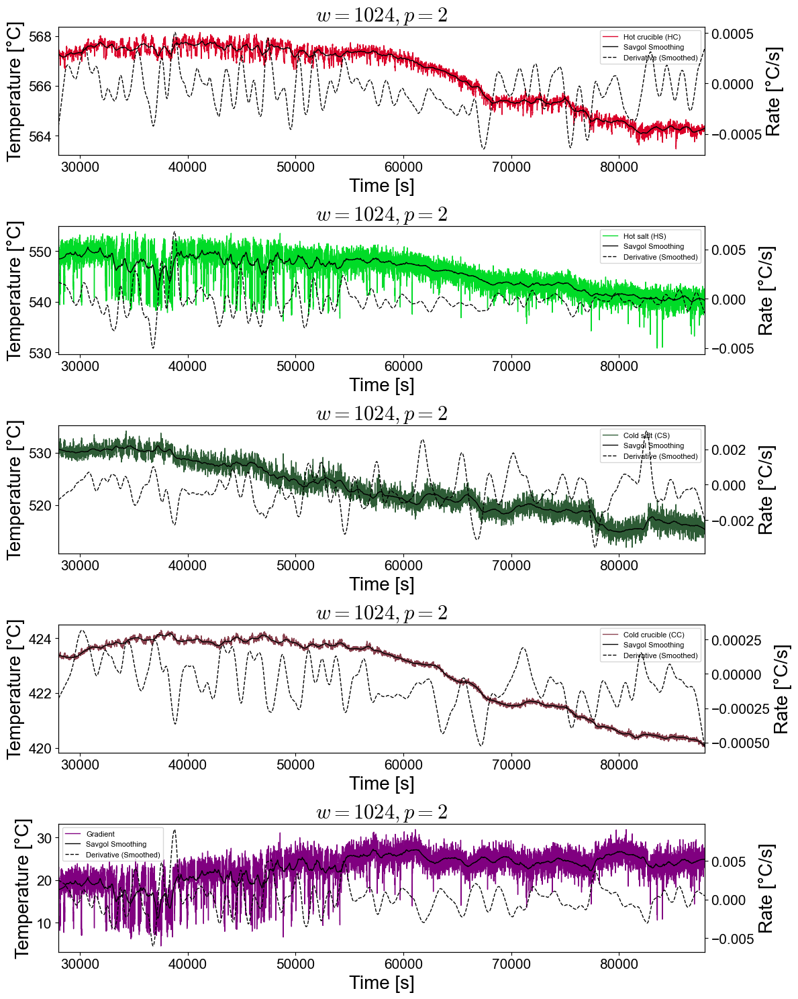

In [ ]:
#Zoom on Run 3.1: Ch0-3 and Gradient.
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(12, 15))

# Plot different things in each row using the SAME function
channelPlotter([CH3run3_1, CH3run3_1_f, CH3run3_1_fd], [timerun3_1, CH3_timeR, CH3_timeR], f"$w = {window_ch3}, p = {poly_ch3}$", 
               [colors[3],"black", "darkgrey", "black",], [xmin, xmax], None, labels=[labels[3], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"],
               linestyles=["-", "-", "-.", "--"], ax=ax1, twin=True, extratwin=False, epsilon=0.05 * (max(CH3run3_1_fd)-min(CH3run3_1_fd))/2)

channelPlotter([CH1run3_1, CH1run3_1_f, CH1run3_1_fd], [timerun3_1, CH1_timeR, CH1_timeR], f"$w = {window_ch1}, p = {poly_ch1}$", 
               [colors[1],"black", "darkgrey", "black",], [xmin, xmax], None, labels=[labels[1], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax2, twin=True, extratwin=False, epsilon=0.05 * (max(CH1run3_1_fd)-min(CH1run3_1_fd))/2)

channelPlotter([CH0run3_1, CH0run3_1_f, CH0run3_1_fd], [timerun3_1, CH0_timeR, CH0_timeR], f"$w = {window_ch0}, p = {poly_ch0}$", 
               [colors[0],"black", "darkgrey", "black",], [xmin, xmax], None, labels=[labels[0], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax3, twin=True, extratwin=False, epsilon=0.05 * (max(CH0run3_1_fd)-min(CH0run3_1_fd))/2)


channelPlotter([CH2run3_1, CH2run3_1_f, CH2run3_1_fd], [timerun3_1, CH2_timeR, CH2_timeR], f"$w = {window_ch2}, p = {poly_ch2}$", 
               [colors[2],"black", "darkgrey", "black",], [xmin, xmax], None, labels=[labels[2], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax4, twin=True, extratwin=False, epsilon=0.05 * (max(CH2run3_1_fd)-min(CH2run3_1_fd))/2)

channelPlotter([CH1run3_1-CH0run3_1, gradrun3_1_f, gradrun3_1_fd], [timerun3_1, gradrun3_timeR, gradrun3_timeR], f"$w = {window_grad}, p = {poly_grad}$", 
               ["purple", "black", "darkgrey", "black",], [xmin, xmax], None, labels=["Gradient", "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax5, twin=True, extratwin=False, epsilon=0.05 * (max(gradrun3_1_fd)-min(gradrun3_1_fd))/2)
#ax1.set_title("Run 3.1, Channel 0-3", fontsize=16)


plt.tight_layout()
plt.show()


C:\Users\jeanv\OneDrive - Delft University of Technology\Uitwisseling - TUDelft\Courses\MEP\Programming\extra\gradientAnalysis\plots.py:167: SyntaxWarning: invalid escape sequence '\p'
  label='Measured Exponent $b \pm \sigma$', markersize=0.5)
C:\Users\jeanv\OneDrive - Delft University of Technology\Uitwisseling - TUDelft\Courses\MEP\Programming\extra\gradientAnalysis\plots.py:203: SyntaxWarning: invalid escape sequence '\p'
  label='Coherence $b \pm \sigma$')
C:\Users\jeanv\OneDrive - Delft University of Technology\Uitwisseling - TUDelft\Courses\MEP\Programming\extra\gradientAnalysis\plots.py:263: SyntaxWarning: invalid escape sequence '\p'
  label='Coherence $b \pm \sigma$')


ValueError: x and y must have same first dimension, but have shapes (9553,) and (6631,)

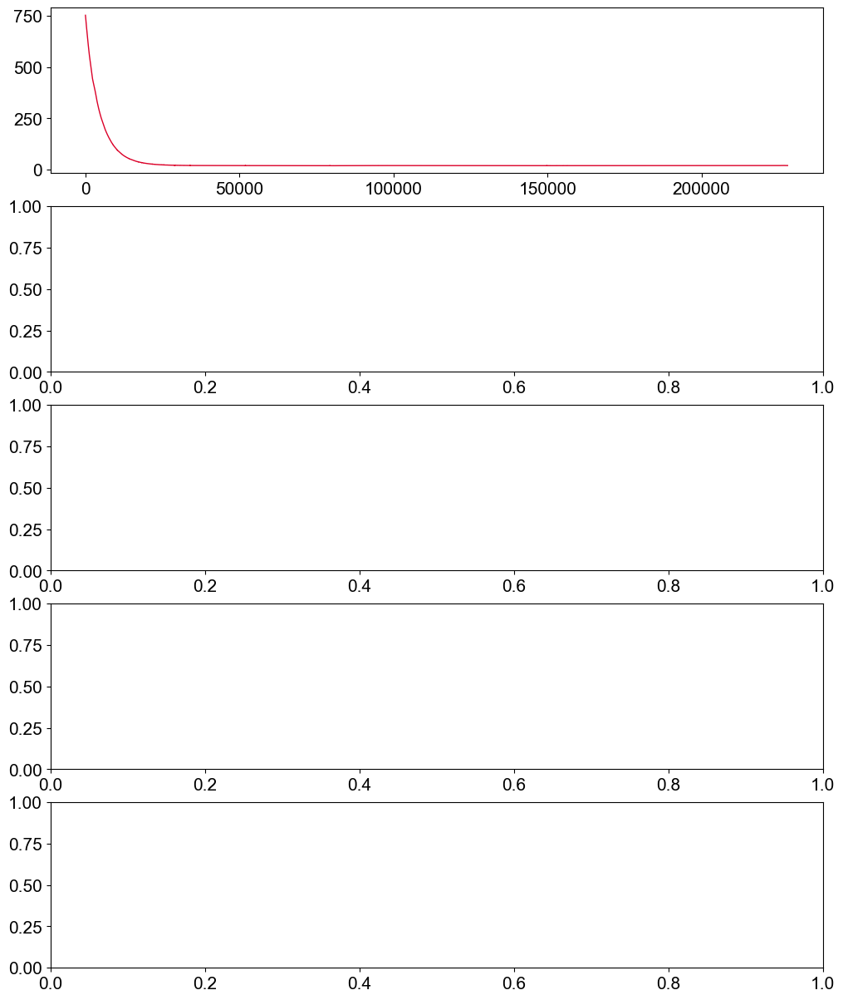

In [ ]:
#Zoom on Run 3.1: Ch0-3 and Gradient.
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(12, 15))

# Plot different things in each row using the SAME function
channelPlotter([CH3run2_2, CH3run2_2_f, np.zeros_like(CH3_timeR_2), CH3run2_2_fd], [timerun2_2, CH3_timeR_2, CH3_timeR_2, CH3_timeR_2], f"$w = {window_ch3}, p = {poly_ch3}$", 
               [colors[3],"black", "darkgrey", "black",], [xmin_2, xmax_2], None, labels=[labels[3], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"],
               linestyles=["-", "-", "-.", "--"], ax=ax1, twin=True, extratwin=True, epsilon=0.05 * (max(CH3run2_2_fd)-min(CH3run2_2_fd))/2)

channelPlotter([CH1run2_2, CH1run2_2_f, np.zeros_like(CH1_timeR_2), CH1run2_2_fd], [timerun2_2, CH1_timeR_2, CH1_timeR_2, CH1_timeR_2], f"$w = {window_ch1}, p = {poly_ch1}$", 
               [colors[1],"black", "darkgrey", "black",], [xmin_2, xmax_2], None, labels=[labels[1], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax2, twin=True, extratwin=True, epsilon=0.05 * (max(CH1run2_2_fd)-min(CH1run2_2_fd))/2)

channelPlotter([CH0run2_2, CH0run2_2_f, np.zeros_like(CH0_timeR_2), CH0run2_2_fd], [timerun2_2, CH0_timeR_2, CH0_timeR_2, CH0_timeR_2], f"$w = {window_ch0}, p = {poly_ch0}$", 
               [colors[0],"black", "darkgrey", "black",], [xmin_2, xmax_2], None, labels=[labels[0], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax3, twin=True, extratwin=True, epsilon=0.05 * (max(CH0run2_2_fd)-min(CH0run2_2_fd))/2)


channelPlotter([CH2run2_2, CH2run2_2_f, np.zeros_like(CH2_timeR_2), CH2run2_2_fd], [timerun2_2, CH2_timeR_2, CH2_timeR_2, CH2_timeR_2], f"$w = {window_ch2}, p = {poly_ch2}$", 
               [colors[2],"black", "darkgrey", "black",], [xmin_2, xmax_2], None, labels=[labels[2], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax4, twin=True, extratwin=True, epsilon=0.05 * (max(CH2run2_2_fd)-min(CH2run2_2_fd))/2)

channelPlotter([CH1run2_2-CH0run2_2, gradrun2_2_f, np.zeros_like(CH3_timeR_2), gradrun2_2_fd], [timerun2_2, gradrun2_timeR_2, gradrun2_timeR_2, gradrun2_timeR_2], f"$w = {window_grad}, p = {poly_grad}$", 
               ["purple", "black", "darkgrey", "black",], [xmin_2, xmax_2], None, labels=["Gradient", "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax5, twin=True, extratwin=True, epsilon=0.05 * (max(gradrun2_2_fd)-min(gradrun2_2_fd))/2)
#ax1.set_title("Run 3.1, Channel 0-3", fontsize=16)


plt.tight_layout()
plt.show()


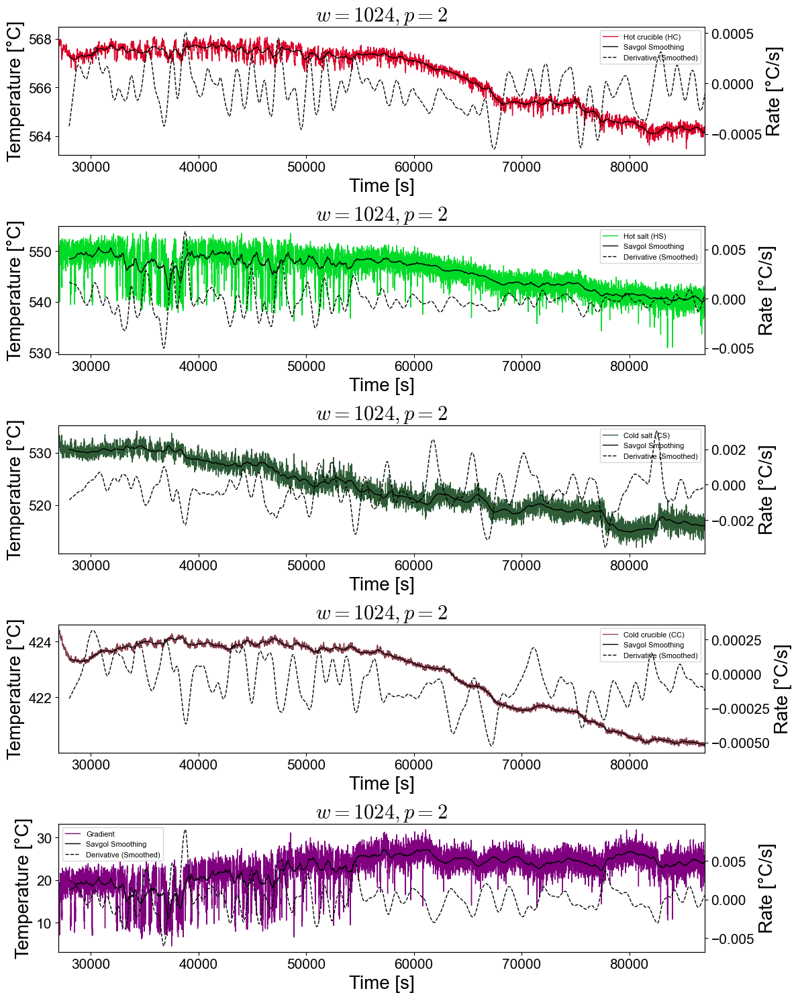

In [ ]:
#Zoom on Run 3.1: Ch0-3 and Gradient.
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(5, 1, figsize=(12, 15))

# Plot different things in each row using the SAME function
channelPlotter([CH3run3_1, CH3run3_1_f, CH3run3_1_fd], [timerun3_1, CH3_timeR, CH3_timeR], f"$w = {window_ch3}, p = {poly_ch3}$", 
               [colors[3],"black", "darkgrey", "black",], [27000, 87000], None, labels=[labels[3], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"],
               linestyles=["-", "-", "-.", "--"], ax=ax1, twin=True, extratwin=False, epsilon=0.05 * (max(CH3run3_1_fd)-min(CH3run3_1_fd))/2)

channelPlotter([CH1run3_1, CH1run3_1_f, CH1run3_1_fd], [timerun3_1, CH1_timeR, CH1_timeR], f"$w = {window_ch1}, p = {poly_ch1}$", 
               [colors[1],"black", "darkgrey", "black",], [27000, 87000], None, labels=[labels[1], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax2, twin=True, extratwin=False, epsilon=0.05 * (max(CH1run3_1_fd)-min(CH1run3_1_fd))/2)

channelPlotter([CH0run3_1, CH0run3_1_f, CH0run3_1_fd], [timerun3_1, CH0_timeR, CH0_timeR], f"$w = {window_ch0}, p = {poly_ch0}$", 
               [colors[0],"black", "darkgrey", "black",], [27000, 87000], None, labels=[labels[0], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax3, twin=True, extratwin=False, epsilon=0.05 * (max(CH0run3_1_fd)-min(CH0run3_1_fd))/2)


channelPlotter([CH2run3_1, CH2run3_1_f, CH2run3_1_fd], [timerun3_1, CH2_timeR, CH2_timeR], f"$w = {window_ch2}, p = {poly_ch2}$", 
               [colors[2],"black", "darkgrey", "black",], [27000, 87000], None, labels=[labels[2], "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax4, twin=True, extratwin=False, epsilon=0.05 * (max(CH2run3_1_fd)-min(CH2run3_1_fd))/2)

channelPlotter([CH1run3_1-CH0run3_1, gradrun3_1_f, gradrun3_1_fd], [timerun3_1, gradrun3_timeR, gradrun3_timeR], f"$w = {window_grad}, p = {poly_grad}$", 
               ["purple", "black", "darkgrey", "black",], [27000, 87000], None, labels=["Gradient", "Savgol Smoothing", "Stable", "Derivative (Smoothed)"], 
               linestyles=["-", "-","-.", "--"], ax=ax5, twin=True, extratwin=False, epsilon=0.05 * (max(gradrun3_1_fd)-min(gradrun3_1_fd))/2)
#ax1.set_title("Run 3.1, Channel 0-3", fontsize=16)


plt.tight_layout()
plt.show()


In [ ]:
print(np.mean(CH0run3_1_fd))
print(np.mean(CH1run3_1_fd))
print(np.mean(CH2run3_1_fd))
print(np.mean(CH3run3_1_fd))
print(np.mean(gradrun3_1_fd))

-0.00030933273698880624
-0.00016080557223152887
-6.70947367991558e-05
-5.962352064058436e-05
0.00014852716475726406


# Coherence of Selected Channels (Run 3)

The window code, that splits the data is governed by the following relationships between the window size (w), step size (s) and nperseg.
The amount of windows is given by the ratio of data points minus the window size and divided by the step size. 


$$N_w = \frac{N_{data} - w}{s}$$

Sampling Rate: 0.83 Hz


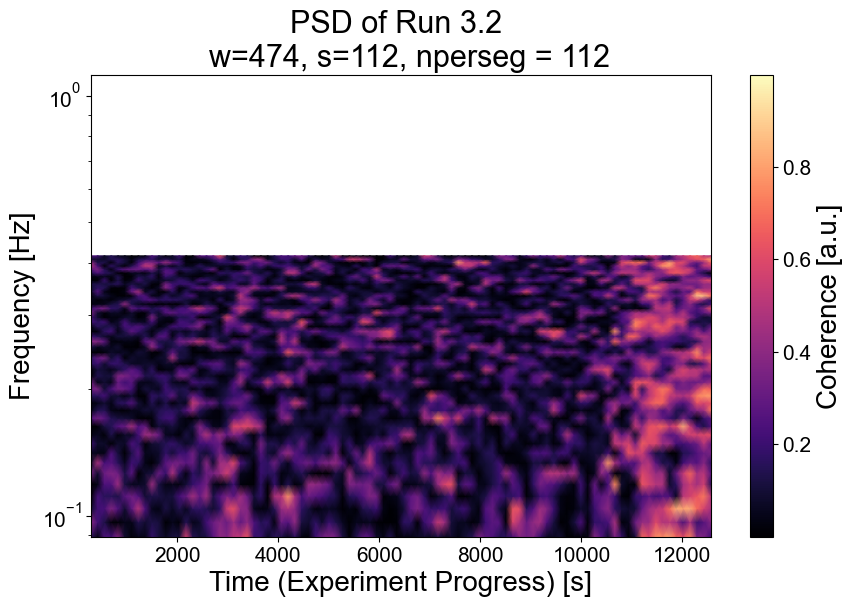

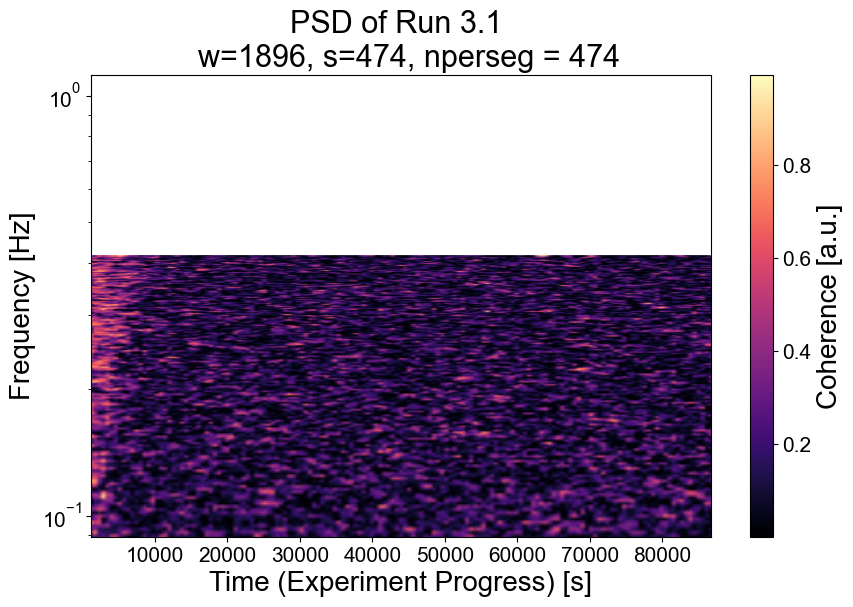

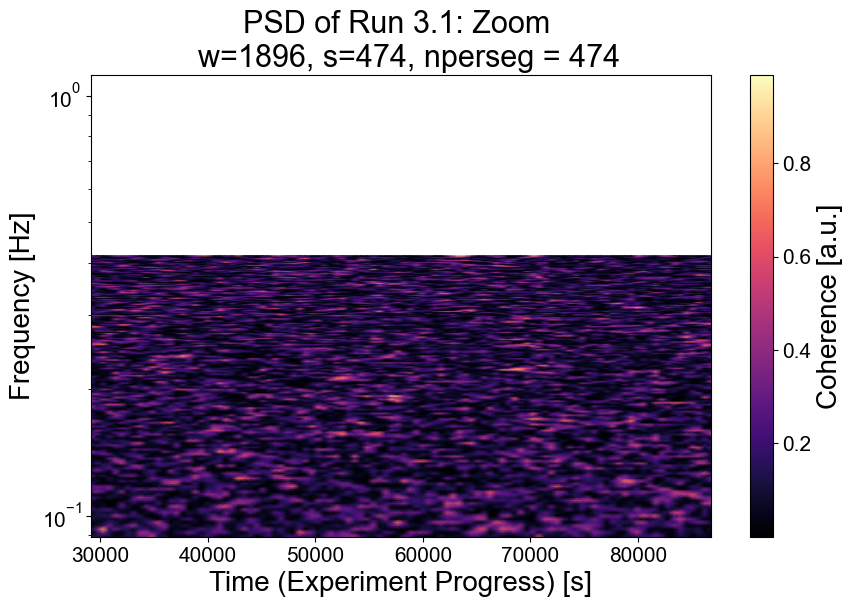

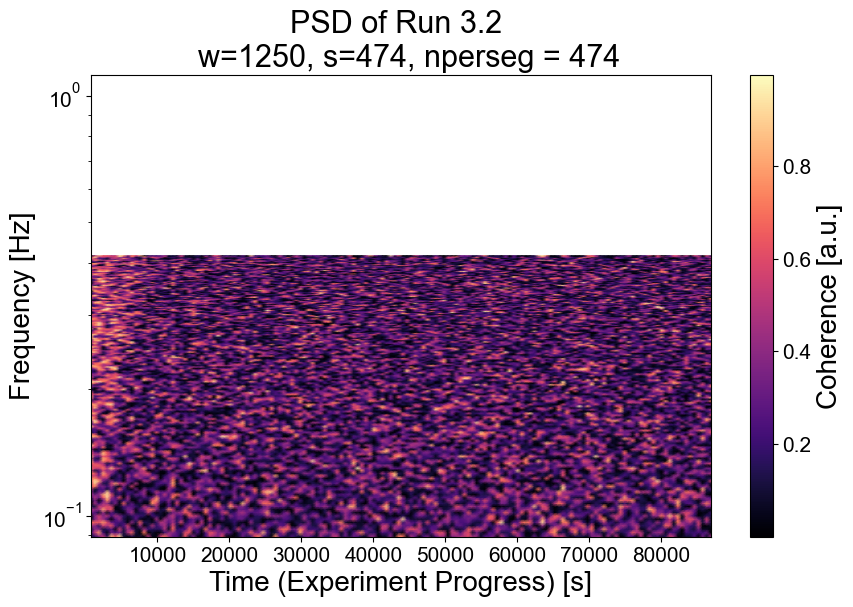

C:\Users\jeanv\OneDrive - Delft University of Technology\Uitwisseling - TUDelft\Courses\MEP\Programming\extra\gradientAnalysis\functions.py:181: RuntimeWarning: divide by zero encountered in power
  return a * np.power(f, b)


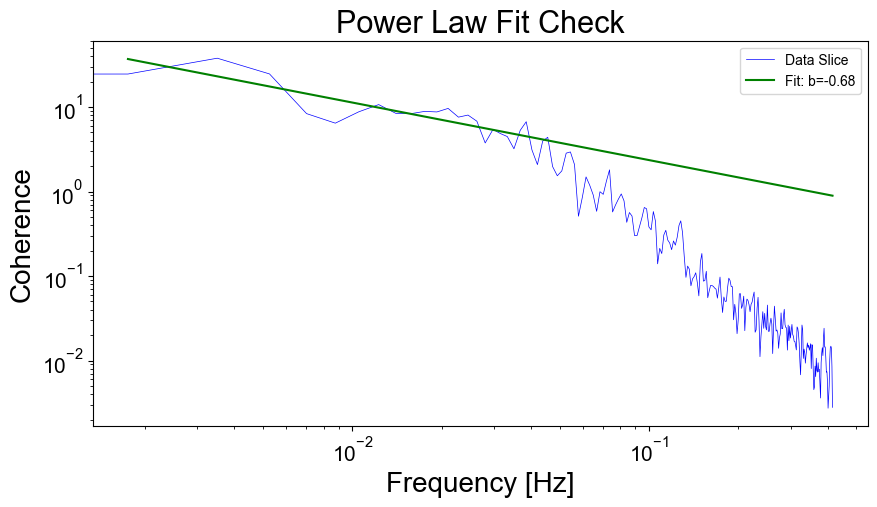

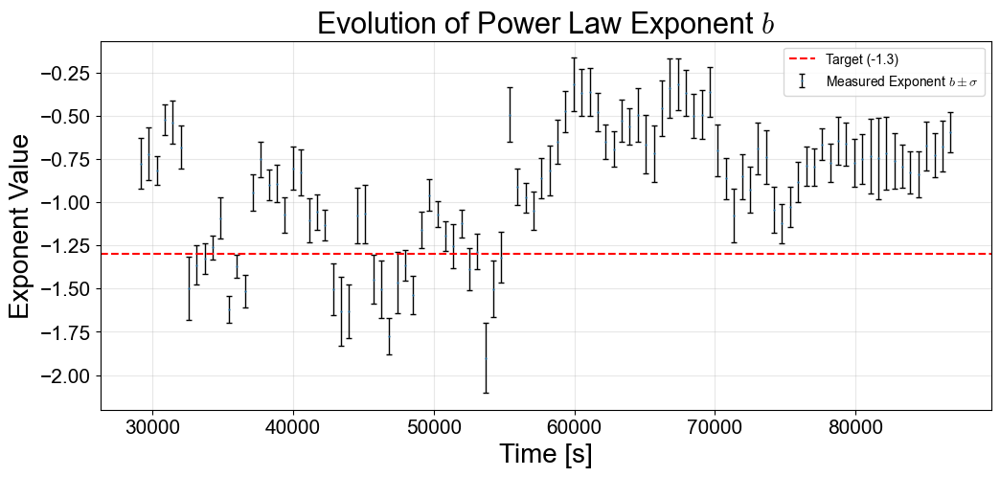

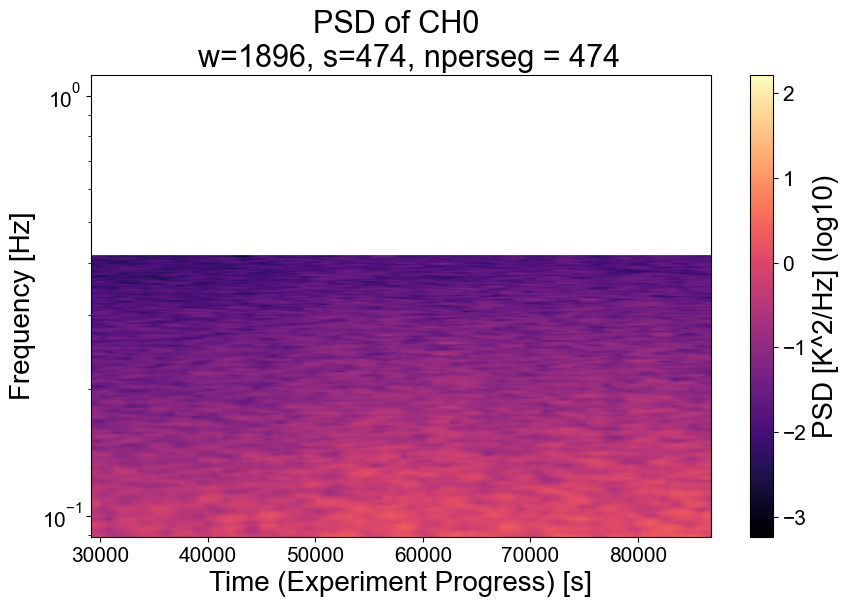

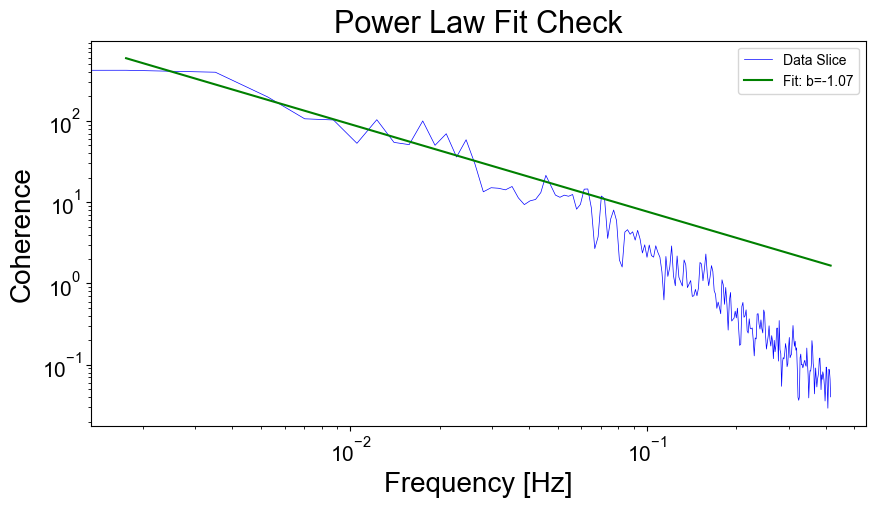

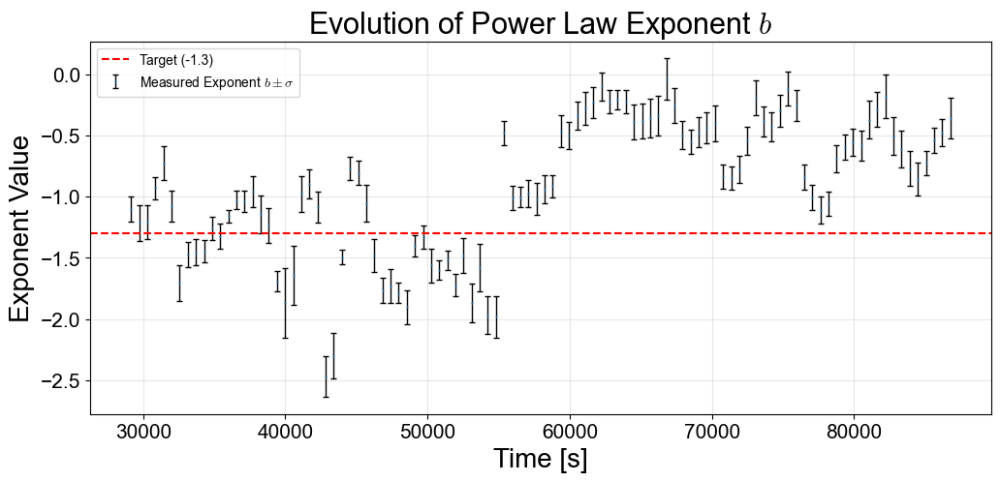

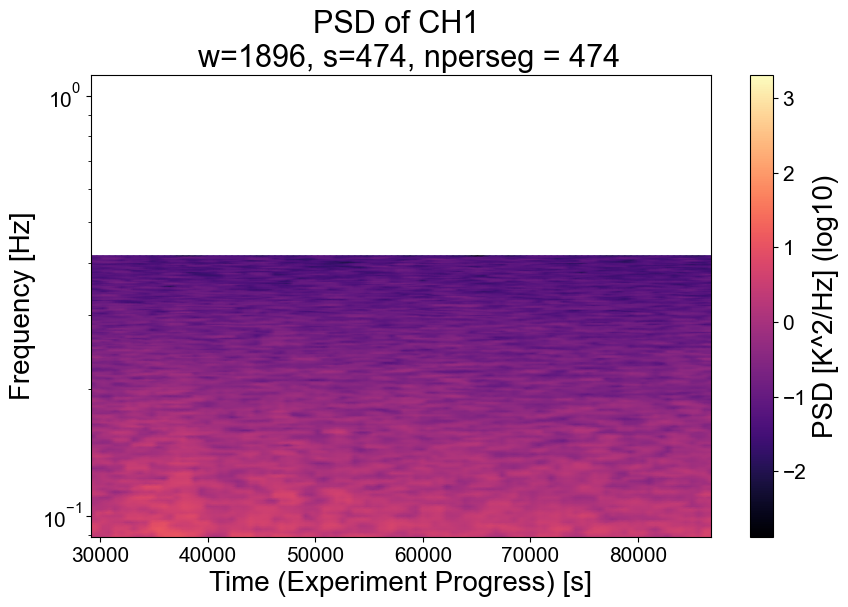

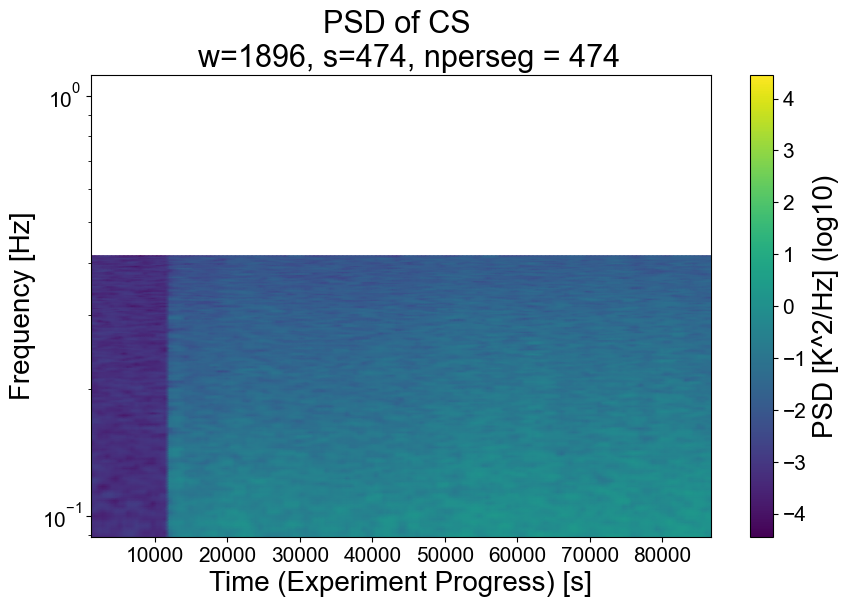

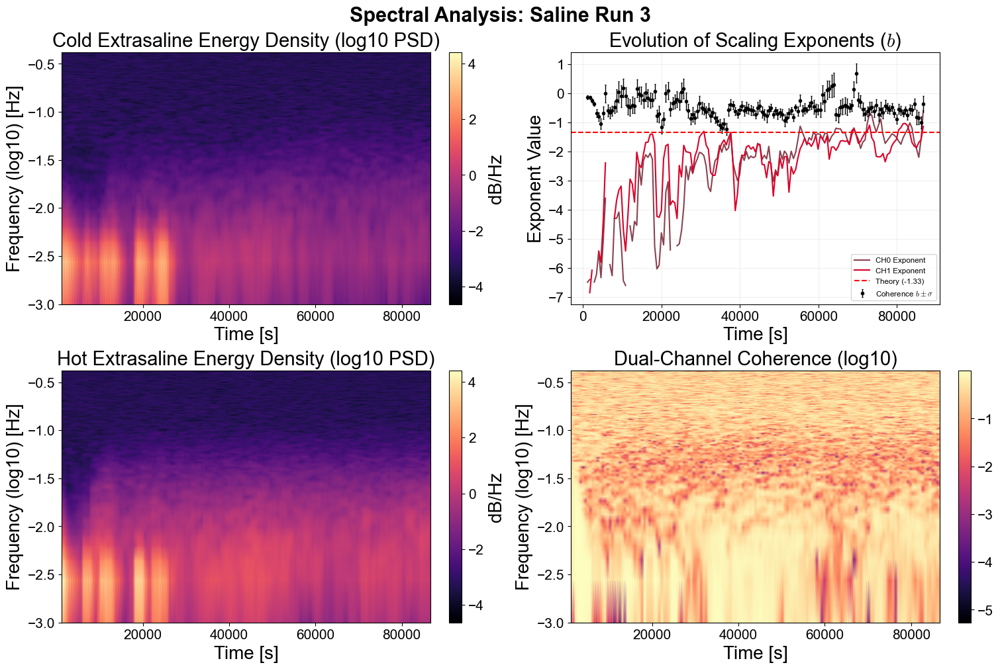

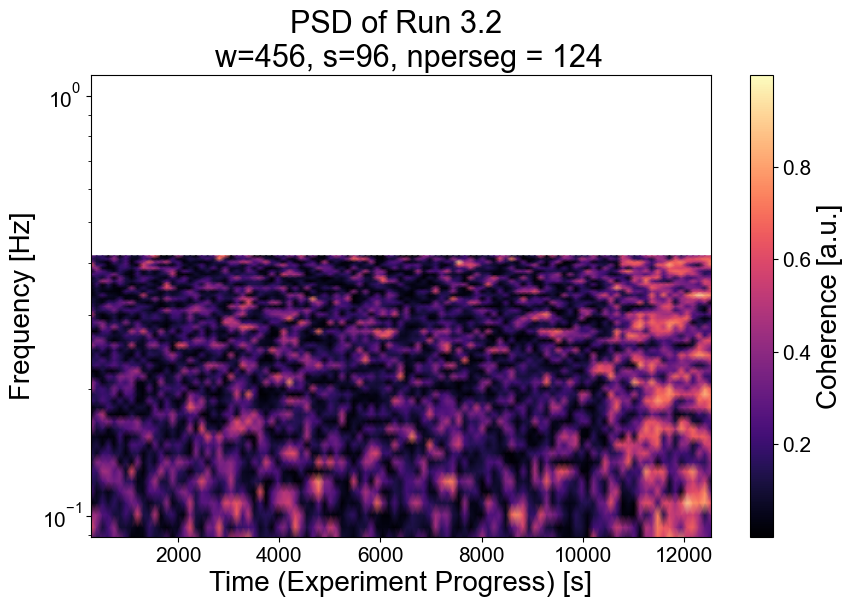

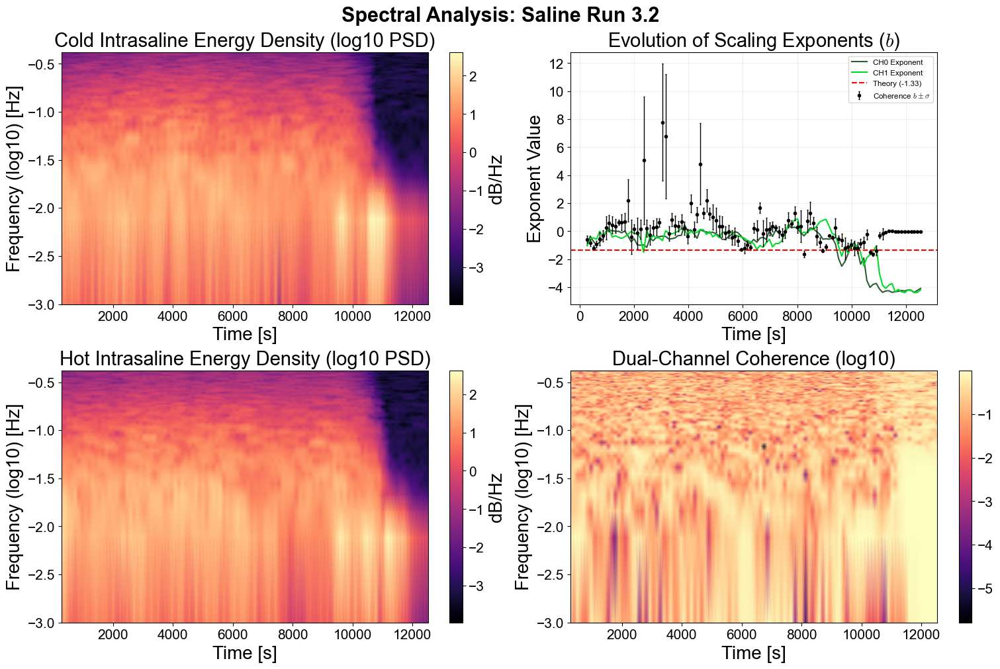

In [ ]:
time_diff = np.mean(np.diff(timerun3_1)) 
fs = 1.0 / time_diff

print(f"Sampling Rate: {fs:.2f} Hz")
# Heatmap of Saline Coherence plots


# PSD Channel 1 Run 2 (Local energy at other sensor)
window_size, step_size, nperseg = 474, 112, 112
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors = coherenceData(CH0run3_2, CH1run3_2, timerun3_2, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.1,0.4])
plotCoherence1 = coherencePlotter(win_t, f, Z, Z_ax, window_size, step_size, nperseg, runID="Run 3.2", cmap="magma")



## Run 3.1: Full range
window_size, step_size, nperseg = 1896, 474, 474
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors = coherenceData(CH0run3_1, CH1run3_1, timerun3_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.1,0.4])
plotCoherence1 = coherencePlotter(win_t, f, Z, Z_ax, window_size, step_size, nperseg, runID="Run 3.1", cmap="magma")


## Run 3.1: Zoom. Xmin based on value given earlier. 
window_size, step_size, nperseg = 1896, 474, 474
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors = coherenceData(CH0_yR, CH1_yR, CH0_timeR, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])
plotCoherence1 = coherencePlotter(win_t, f, Z, Z_ax, window_size, step_size, nperseg, runID="Run 3.1: Zoom", cmap="magma")

# ## Run 3.1
window_size, step_size, nperseg =  1250, 474, 474
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors = coherenceData(CH1run3_1, CH0run3_1, timerun3_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])
plotCoherence1 = coherencePlotter(win_t, f, Z, Z_ax, window_size, step_size, nperseg, runID="Run 3.2", cmap="magma")

# Fitting plots of each window with power law

window_size, step_size, nperseg =  1896, 474, 474
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors  = singleWelch(CH0_yR, CH0_timeR, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=True, freq_range=[0.005,0.04], dtrend=True)
coherenceFitPlotter(f, Z[:, 5], a_arr[5], b_arr[5], windows_time=win_t, b_fits_array=b_arr, b_errors=b_errors)
coherencePlotter(win_t, f, Z_log, Z_ax, window_size, step_size, nperseg, runID="CH0", cmap="magma")

window_size, step_size, nperseg =  1896, 474, 474
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors  = singleWelch(CH1_yR, CH1_timeR, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=True, freq_range=[0.005,0.04], dtrend=True)
coherenceFitPlotter(f, Z[:, 5], a_arr[5], b_arr[5], windows_time=win_t, b_fits_array=b_arr, b_errors=b_errors)
coherencePlotter(win_t, f, Z_log, Z_ax, window_size, step_size, nperseg, runID="CH1", cmap="magma")


# --- 1. Gather all the pieces ---
# Coherence (Relationship between 0 and 1)
window_size, step_size, nperseg =  1896, 474, 474
win_t, f, Z_coh, _, _, a_coh, b_coh, b_err_coh = coherenceData(CH2run3_1, CH3run3_1, timerun3_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])

# PSD Channel 0 (Local energy at bottom/top)
window_size, step_size, nperseg =   1896, 474, 474
win_t_ch0run3_1, f_ch0run3_1, Z_psd0, Z_logch0run3_1, Z_axch0run3_1, a_psd0, b_psd0, b_err_psd0 = singleWelch(CH0run3_1, timerun3_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=True, dtrend=True)
coherencePlotter(win_t_ch0run3_1, f_ch0run3_1, Z_logch0run3_1, Z_axch0run3_1, window_size, step_size, nperseg, runID="CS", cmap="viridis")
win_t_ch0run3_1, f_ch0run3_1, Z_psd0, Z_logch0run3_1, Z_axch0run3_1, a_psd0, b_psd0, b_err_psd0 = singleWelch(CH2run3_1, timerun3_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


# # PSD Channel 1 (Local energy at other sensor)
window_size, step_size, nperseg =   1896, 474, 474
_, _, Z_psd1, _, _, a_psd1, b_psd1, b_err_psd1 = singleWelch(CH3run3_1, timerun3_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# --- Call the function ---
plotOverviewDashboard("Saline Run 3", f, win_t, Z_coh, Z_psd0, Z_psd1, b_coh, b_psd0, b_psd1, a_coh, b_errors=b_err_coh,color_singlechannels=[colors[2],colors[3]], cmap="magma", location="extra")



## Run 3.2

window_size, step_size, nperseg =  456, 96, 124
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors = coherenceData(CH1run3_2, CH0run3_2, timerun3_2, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])
plotCoherence1 = coherencePlotter(win_t, f, Z, Z_ax, window_size, step_size, nperseg, runID="Run 3.2", cmap="magma")

# --- 1. Gather all the pieces ---
# Coherence (Relationship between 0 and 1)
window_size, step_size, nperseg =  456, 96, 124
win_t, f, Z_coh, _, _, a_coh, b_coh, b_err_coh = coherenceData(CH0run3_2, CH1run3_2, timerun3_2, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])

# PSD Channel 0 (Local energy at bottom/top)
window_size, step_size, nperseg =   456, 96, 124
_, _, Z_psd0, _, _, a_psd0, b_psd0, b_err_psd0 = singleWelch(CH0run3_2, timerun3_2, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# # PSD Channel 1 (Local energy at other sensor)
window_size, step_size, nperseg =   456, 96, 124
_, _, Z_psd1, _, _, a_psd1, b_psd1, b_err_psd1 = singleWelch(CH1run3_2, timerun3_2, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# --- Call the function ---
plotOverviewDashboard("Saline Run 3.2", f, win_t, Z_coh, Z_psd0, Z_psd1, b_coh, b_psd0, b_psd1, a_coh, b_errors=b_err_coh,color_singlechannels=[colors[0],colors[1]], cmap="magma", location="intra")



# Run 2

AttributeError: 'Text' object has no property 'scale'

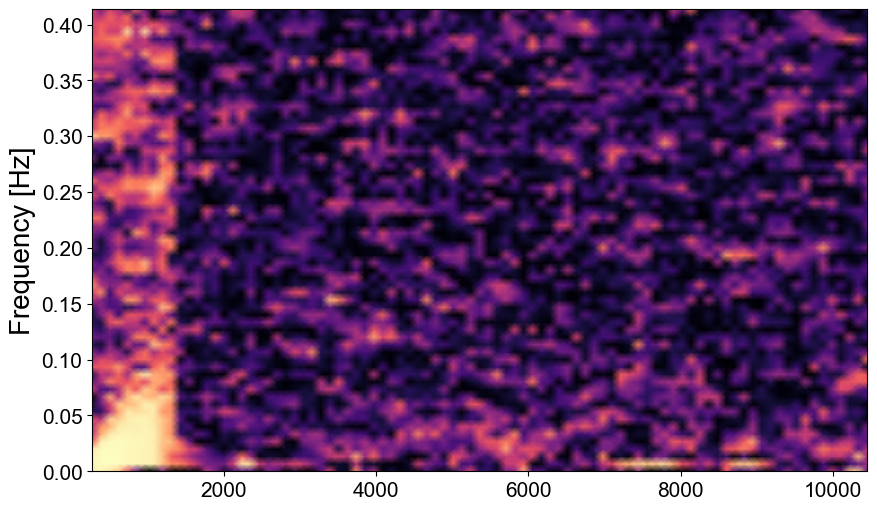

In [ ]:

## Run 3.2

window_size, step_size, nperseg =   456, 96, 124
win_t, f, Z, Z_log, Z_ax, a_arr, b_arr, b_errors = coherenceData(CH1run2_1, CH0run2_1, timerun2_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])
plotCoherence1 = coherencePlotter(win_t, f, Z, Z_ax, window_size, step_size, nperseg, runID="Run 3.2", cmap="magma")

# --- 1. Gather all the pieces ---
# Coherence (Relationship between 0 and 1)
window_size, step_size, nperseg =   256, 96, 124
win_t, f, Z_coh, _, _, a_coh, b_coh, b_err_coh = coherenceData(CH0run2_1, CH1run2_1, timerun2_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04])

# PSD Channel 0 (Local energy at bottom/top)
window_size, step_size, nperseg =    256, 96, 124
_, _, Z_psd0, _, _, a_psd0, b_psd0, b_err_psd0 = singleWelch(CH0run2_1, timerun2_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# # PSD Channel 1 (Local energy at other sensor)
window_size, step_size, nperseg =    256, 96, 124
_, _, Z_psd1, _, _, a_psd1, b_psd1, b_err_psd1 = singleWelch(CH1run2_1, timerun2_1, window_size=window_size, step_size=step_size, nperseg=nperseg, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# --- Call the function ---
plotOverviewDashboard("Saline Run 2.2", f, win_t, Z_coh, Z_psd0, Z_psd1, b_coh, b_psd0, b_psd1, a_coh, b_errors=b_err_coh, cmap="magma")




In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

def calculate_lsc_reynolds(t, T_bottom, T_top, L, nu):
    """
    Calculates the Reynolds number of the Large-Scale Circulation (LSC) 
    using cross-correlation of two vertically separated temperature sensors.
    
    Parameters:
    t        : 1D array, Time vector in seconds.
    T_bottom : 1D array, Temperature from the lower sensor.
    T_top    : 1D array, Temperature from the upper sensor.
    L        : float, Characteristic length (usually container height) in meters.
    nu       : float, Kinematic viscosity of the fluid in m^2/s.
    
    Returns:
    time_delay    : Time taken for plumes to travel between sensors (seconds).
    turnover_time : Estimated LSC turnover time (seconds).
    Re            : Reynolds number.
    lags          : Array of time lags for plotting.
    corr          : Array of cross-correlation values.
    """
    
    # 1. Calculate the sampling interval (dt)
    dt = t[1] - t[0]
    
    # 2. Subtract the mean to get temperature fluctuations
    #    (This matches the physics defined in Eq V.1.1 of Brown's thesis)
    T_b_fluc = T_bottom - np.mean(T_bottom)
    T_t_fluc = T_top - np.mean(T_top)
    
    # 3. Compute the cross-correlation
    #    'full' computes the correlation at all possible overlaps
    corr = signal.correlate(T_t_fluc, T_b_fluc, mode='full')
    
    # 4. Generate the corresponding time lags axis
    #    signal.correlation_lags generates the integer shifts, which we multiply by dt
    lags = signal.correlation_lags(len(T_top), len(T_bottom)) * dt
    
    # 5. Find the peak of the correlation
    #    Because plumes travel from bottom to top, we expect the top signal to lag  
    #    behind the bottom signal. Thus, we look for the peak at a positive lag time.
    
    # Filter for positive lags only (assuming T_top happens AFTER T_bottom)
    positive_lags_mask = lags > 0
    positive_lags = lags[positive_lags_mask]
    positive_corr = corr[positive_lags_mask]
    
    # Find the index of the maximum correlation value
    peak_idx = np.argmax(positive_corr)
    time_delay = positive_lags[peak_idx] # This is t_1^cc
    
    # 6. Calculate Turnover Time and Reynolds Number
    #    Using Eric Brown's formulation where Turnover Time T = 2 * delay
    turnover_time = 2 * time_delay[cite: 2]
    
    #    Re = (2L / T) * (L / nu) = L^2 / (nu * time_delay)
    Re = (L**2) / (nu * time_delay)[cite: 2]
    
    return time_delay, turnover_time, Re, lags, corr

# ==========================================
# Example Usage with Mock Data
# ==========================================
if __name__ == "__main__":
    # Create a mock time array (0 to 1000 seconds, sampled every 1s)
    t = np.linspace(0, 1000, 1000)
    
    # Create mock temperature signals (Sine waves + noise)
    # The top signal is delayed by 45 seconds
    true_delay = 45 
    T_bottom = np.sin(2 * np.pi * t / 150) + np.random.normal(0, 0.5, len(t)) + 40
    T_top = np.sin(2 * np.pi * (t - true_delay) / 150) + np.random.normal(0, 0.5, len(t)) + 38
    

    CH0_timeR, CH0_yR = rangeSelector(CH0run3_1, timerun3_1, [xmin, xmax])
    CH1_timeR, CH1_yR = rangeSelector(CH1run3_1, timerun3_1, [xmin, xmax])
    CH2_timeR, CH2_yR = rangeSelector(CH2run3_1, timerun3_1, [xmin, xmax])
    CH3_timeR, CH3_yR = rangeSelector(CH3run3_1, timerun3_1, [xmin, xmax])

    # System parameters
    container_height = 0.5 # meters
    kinematic_viscosity = 6.69e-7 # m^2/s (water at 40C)
    
    # Run the calculation
    delay, T_turnover, Re, lags, corr = calculate_lsc_reynolds(
        t, T_bottom, T_top, container_height, kinematic_viscosity
    )
    
    print(f"Calculated Time Delay: {delay:.2f} seconds")
    print(f"Calculated LSC Turnover Time: {T_turnover:.2f} seconds")
    print(f"Calculated Reynolds Number: {Re:,.0f}")
    
    # Optional: Plot the Cross-Correlation to verify the peak visually
    plt.figure(figsize=(10, 4))
    plt.plot(lags, corr)
    plt.axvline(delay, color='red', linestyle='--', label=f'Peak Delay: {delay:.1f}s')
    plt.title("Cross-Correlation between Top and Bottom Thermocouples")
    plt.xlabel("Time Lag [s]")
    plt.ylabel("Correlation Magnitude")
    plt.xlim(-200, 200) # Zoom in around zero
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

NameError: name 'cite' is not defined

<>:329: SyntaxWarning: invalid escape sequence '\d'
<>:339: SyntaxWarning: invalid escape sequence '\d'
<>:329: SyntaxWarning: invalid escape sequence '\d'
<>:339: SyntaxWarning: invalid escape sequence '\d'
C:\Users\jeanv\AppData\Local\Temp\ipykernel_29320\3907898556.py:329: SyntaxWarning: invalid escape sequence '\d'
  axs[0].set_ylabel("Phase Angle [$\degree$]", fontsize=20)
C:\Users\jeanv\AppData\Local\Temp\ipykernel_29320\3907898556.py:339: SyntaxWarning: invalid escape sequence '\d'
  axs[1].set_ylabel("Phase Angle [$\degree$]", fontsize=20)


--- Starting Molten Salt Convection Analysis ---
Running Time-Delay Velocimetry on Regime 1...
Running Spectral Analysis (PSD & Coherence) on both regimes...
Regime 1 (HC) Slope: -3.210 ± 0.026
Regime 1 (CC) Slope: -1.853 ± 0.050
Regime 2 (HC) Slope: -3.271 ± 0.028
Regime 2 (CC) Slope: -1.895 ± 0.024

--- Sensitivity Analysis: Slope vs Fitting Window ---

  R1 bottom
                Window   slope
  -----------------------------------
  [0.008, 0.080]   -3.205
  [0.010, 0.100]   -3.210  <-- current
  [0.012, 0.120]   -3.087
  [0.015, 0.100]   -3.241
  [0.010, 0.080]   -3.285
  --> slope range:  -3.285 to -3.087
  --> systematic uncertainty (half-range): ±0.099

  R1 top
                Window   slope
  -----------------------------------
  [0.008, 0.080]   -2.118
  [0.010, 0.100]   -1.853  <-- current
  [0.012, 0.120]   -1.620
  [0.015, 0.100]   -1.708
  [0.010, 0.080]   -2.091
  --> slope range:  -2.118 to -1.620
  --> systematic uncertainty (half-range): ±0.249

  R2 bottom
         

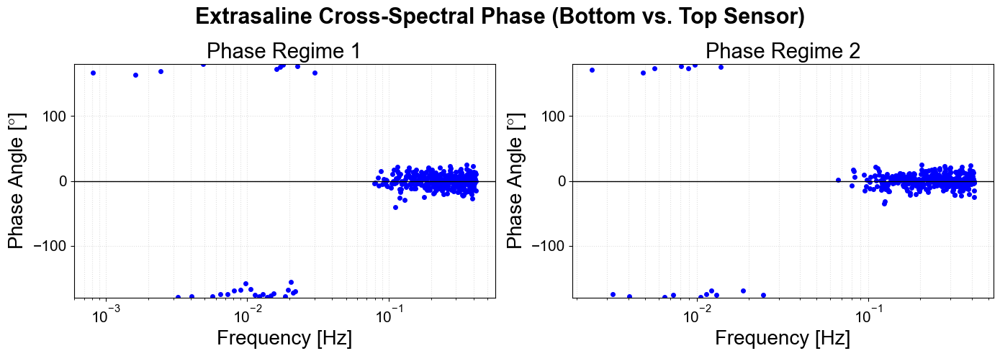

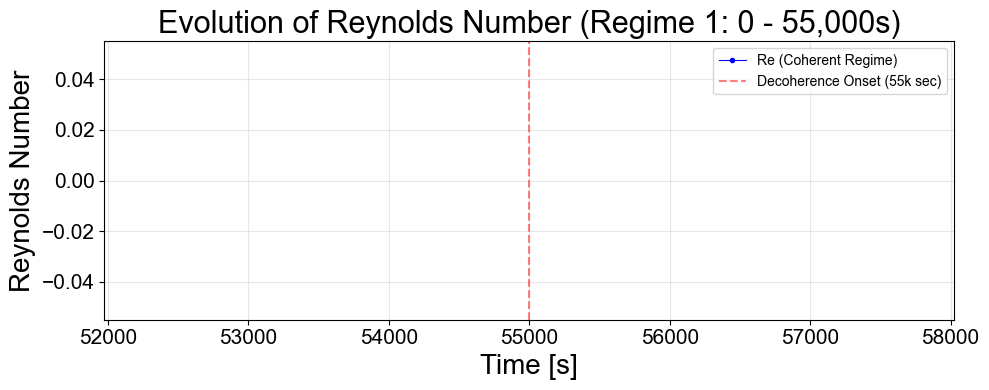

C:\Users\jeanv\AppData\Local\Temp\ipykernel_29320\3907898556.py:391: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[0, 1].legend(fontsize="large")
C:\Users\jeanv\AppData\Local\Temp\ipykernel_29320\3907898556.py:418: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[1, 1].legend()


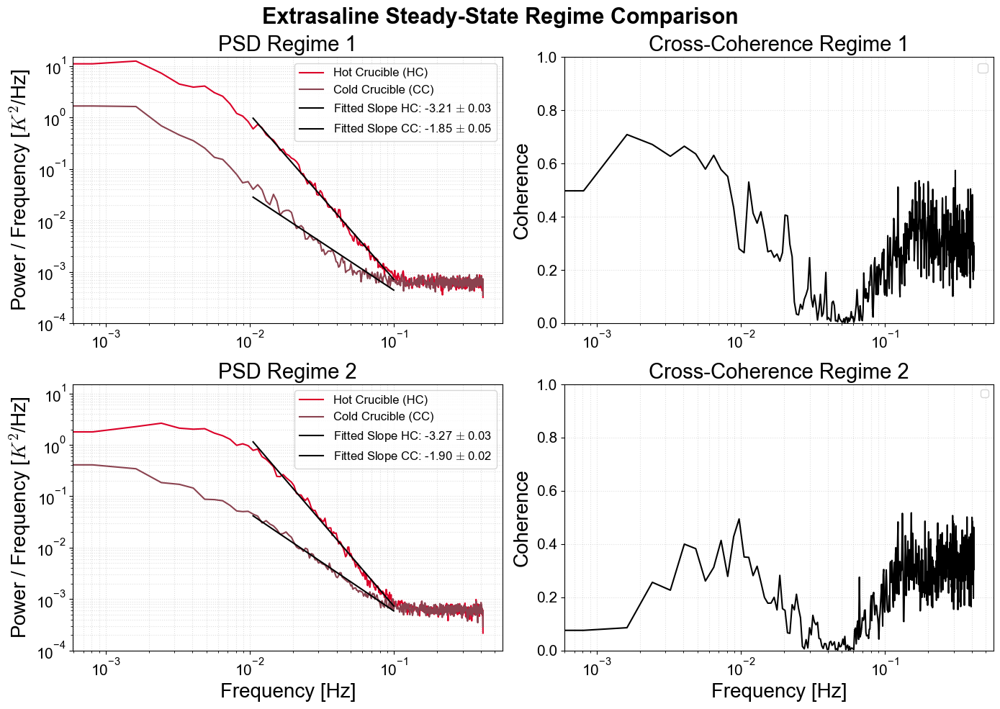

--- Analysis Complete ---


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

# ==========================================
# CORE ANALYSIS FUNCTIONS
# ==========================================

def calculate_window_reynolds(t_window, T_b_window, T_t_window, L, nu, min_delay, max_delay, corr_threshold):
    """
    Calculates the Reynolds number for a SINGLE slice of time.
    Includes detrending, search window restrictions, and confidence filtering.
    """
    dt = t_window[1] - t_window[0]
    
    # 1. Detrend to remove slow heating/cooling drifts
    T_b_fluc = signal.detrend(T_b_window)
    T_t_fluc = signal.detrend(T_t_window)
    
    # 2. Cross-correlation
    corr = signal.correlate(T_t_fluc, T_b_fluc, mode='full')
    lags = signal.correlation_lags(len(T_t_window), len(T_b_window)) * dt
    
    # 3. Filter for positive lags only
    pos_mask = lags > 0
    pos_lags = lags[pos_mask]
    pos_corr = corr[pos_mask]
    
    # 4. Restrict Search to PHYSICAL bounds
    min_idx = np.searchsorted(pos_lags, min_delay)
    max_idx = np.searchsorted(pos_lags, max_delay)
    
    if min_idx >= len(pos_lags) or min_idx >= max_idx:
        return np.nan
        
    search_corr = pos_corr[min_idx:max_idx]
    
    # 5. Find the peak inside the physical window
    local_peak_idx = np.argmax(search_corr)
    max_corr_value = search_corr[local_peak_idx]
    
    # 6. CONFIDENCE FILTER (Handles decoherence)
    if max_corr_value < corr_threshold:
        return np.nan  
    
    # 7. Calculate Reynolds
    true_peak_idx = local_peak_idx + min_idx
    time_delay = pos_lags[true_peak_idx]
    
    Re = (L**2) / (nu * time_delay)
    return Re


def run_sliding_window_velocimetry(t, T_bottom, T_top, L, nu, window_sec, step_sec, min_delay, max_delay, corr_threshold):
    """
    Slides a window across the dataset to calculate Re over time.
    """
    dt = t[1] - t[0]
    window_pts = int(window_sec / dt)
    step_pts = int(step_sec / dt)
    
    time_centers, Re_evolution = [], []
    
    for start in range(0, len(t) - window_pts, step_pts):
        end = start + window_pts
        Re = calculate_window_reynolds(
            t[start:end], T_bottom[start:end], T_top[start:end], 
            L, nu, min_delay, max_delay, corr_threshold
        )
        time_centers.append(t[start + window_pts // 2])
        Re_evolution.append(Re)
        
    return np.array(time_centers), np.array(Re_evolution)


# ==========================================
# MAIN EXECUTION PIPELINE
# ==========================================
if __name__ == "__main__":
    print("--- Starting Molten Salt Convection Analysis ---")

    # ---------------------------------------------------------
    # 1. GENERATE MOCK DATA (Replace with your actual CSV/Data load)
    # ---------------------------------------------------------
    t_total = CH2_timeR
    T_bottom = CH3_yR
    T_top = CH2_yR
    
    # Simulate Regime 1 (Coherent flow, stable 45s delay)
    coherent_mask = t_total < 54000

    # ---------------------------------------------------------
    # 2. SYSTEM PARAMETERS & ANALYSIS KNOBS
    # ---------------------------------------------------------
    # Physical Params
    L = 0.0435                     # Container height [m]
    nu = 2e-6                # Kinematic viscosity [m^2/s]
    
    # Velocimetry Params
    window_sec = 960            # Sliding window size [s]
    step_sec = 480              # Sliding window step [s]
    min_physical_delay = 15     # Bounds for peak search [s]
    max_physical_delay = 150    
    correlation_threshold = 50  # Confidence filter (TUNE THIS for real data)
    
    # Spectral Params
    fs = 0.83                    # Sampling frequency [Hz]
    nperseg_val = 1024          # Welch window size (Resolution vs Smoothness)


    # ---------------------------------------------------------
    # 3. EXPLICITLY SPLIT THE ARRAYS
    # ---------------------------------------------------------
    split_idx = np.searchsorted(t_total, 55000)

    # Regime 1: Coherent 
    t_R1, T_b_R1, T_t_R1 = t_total[:split_idx], T_bottom[:split_idx], T_top[:split_idx]
    
    # Regime 2: Decohered 
    t_R2, T_b_R2, T_t_R2 = t_total[split_idx:], T_bottom[split_idx:], T_top[split_idx:]


    # ---------------------------------------------------------
    # 4. PART A: VELOCIMETRY (On Regime 1 Only)
    # ---------------------------------------------------------
    print("Running Time-Delay Velocimetry on Regime 1...")
    time_centers, Re_array = run_sliding_window_velocimetry(
        t_R1, T_b_R1, T_t_R1, L, nu, window_sec, step_sec, 
        min_physical_delay, max_physical_delay, correlation_threshold
    )

    # ---------------------------------------------------------
    # 5. PART B: SPECTRAL ANALYSIS (Comparing Both Regimes)
    # ---------------------------------------------------------
    print("Running Spectral Analysis (PSD & Coherence) on both regimes...")
    
    # Regime 1 Spectra
    f1_b, Pxx1_b = signal.welch(T_b_R1, fs=fs, nperseg=nperseg_val, detrend='linear')
    f1_t, Pxx1_t = signal.welch(T_t_R1, fs=fs, nperseg=nperseg_val, detrend='linear')
    f1_coh, Cxy1 = signal.coherence(T_b_R1, T_t_R1, fs=fs, nperseg=nperseg_val)

    # Regime 2 Spectra
    f2_b, Pxx2_b = signal.welch(T_b_R2, fs=fs, nperseg=nperseg_val, detrend='linear')
    f2_t, Pxx2_t = signal.welch(T_t_R2, fs=fs, nperseg=nperseg_val, detrend='linear')
    f2_coh, Cxy2 = signal.coherence(T_b_R2, T_t_R2, fs=fs, nperseg=nperseg_val)


    # # Mathematical Slope Fitting (On Regime 2 Bottom Sensor)
    # fit_mask_1b = (f1_b >= 0.01) & (f1_b <= 0.1) # Define Inertial Subrange
    # log_f_1b = np.log10(f1_b[fit_mask_1b])
    # log_P_1b = np.log10(Pxx1_b[fit_mask_1b])
    # slope_1b, intercept_1b = np.polyfit(log_f_1b, log_P_1b, 1)
    # print(f"Calculated Turbulent Exponent (b) for Regime 2: {slope_1b:.3f}")


    # # Mathematical Slope Fitting (On Regime 2 Top Sensor)
    # fit_mask_1t = (f2_t >= 0.01) & (f2_t <= 0.1) # Define Inertial Subrange
    # log_f_1t = np.log10(f2_t[fit_mask_1t])
    # log_P_1t = np.log10(Pxx1_t[fit_mask_1t])
    # slope_1t, intercept_1t = np.polyfit(log_f_1t, log_P_1t, 1)
    # print(f"Calculated Turbulent Exponent (t) for Regime 2: {slope_1t:.3f}")


    # # Mathematical Slope Fitting (On Regime 2 Bottom Sensor)
    # fit_mask_2b = (f2_b >= 0.01) & (f2_b <= 0.1) # Define Inertial Subrange
    # log_f_2b = np.log10(f2_b[fit_mask_2b])
    # log_P_2b = np.log10(Pxx2_b[fit_mask_2b])
    # slope_2b, intercept_2b = np.polyfit(log_f_2b, log_P_2b, 1)
    # print(f"Calculated Turbulent Exponent (b) for Regime 2: {slope_2b:.3f}")


    # # Mathematical Slope Fitting (On Regime 2 Top Sensor)
    # fit_mask_2t = (f2_t >= 0.01) & (f2_t <= 0.1) # Define Inertial Subrange
    # log_f_2t = np.log10(f2_t[fit_mask_2t])
    # log_P_2t = np.log10(Pxx2_t[fit_mask_2t])
    # slope_2t, intercept_2t = np.polyfit(log_f_2t, log_P_2t, 1)
    # print(f"Calculated Turbulent Exponent (t) for Regime 2: {slope_2t:.3f}")

    # ---------------------------------------------------------
    # MATHEMATICAL SLOPE FITTING (WITH STATISTICAL ERRORS)
    # ---------------------------------------------------------
    
    # --- Regime 1: Bottom Sensor (HC) ---
    fit_mask_1b = (f1_b >= 0.01) & (f1_b <= 0.1) 
    log_f_1b = np.log10(f1_b[fit_mask_1b])
    log_P_1b = np.log10(Pxx1_b[fit_mask_1b])
    (slope_1b, intercept_1b), cov_1b = np.polyfit(log_f_1b, log_P_1b, 1, cov=True)
    err_1b = np.sqrt(cov_1b[0, 0])
    print(f"Regime 1 (HC) Slope: {slope_1b:.3f} ± {err_1b:.3f}")

    # --- Regime 1: Top Sensor (CC) ---
    fit_mask_1t = (f1_t >= 0.01) & (f1_t <= 0.1) # Fixed typo: changed f2_t to f1_t
    log_f_1t = np.log10(f1_t[fit_mask_1t])
    log_P_1t = np.log10(Pxx1_t[fit_mask_1t])
    (slope_1t, intercept_1t), cov_1t = np.polyfit(log_f_1t, log_P_1t, 1, cov=True)
    err_1t = np.sqrt(cov_1t[0, 0])
    print(f"Regime 1 (CC) Slope: {slope_1t:.3f} ± {err_1t:.3f}")

    # --- Regime 2: Bottom Sensor (HC) ---
    fit_mask_2b = (f2_b >= 0.01) & (f2_b <= 0.1) 
    log_f_2b = np.log10(f2_b[fit_mask_2b])
    log_P_2b = np.log10(Pxx2_b[fit_mask_2b])
    (slope_2b, intercept_2b), cov_2b = np.polyfit(log_f_2b, log_P_2b, 1, cov=True)
    err_2b = np.sqrt(cov_2b[0, 0])
    print(f"Regime 2 (HC) Slope: {slope_2b:.3f} ± {err_2b:.3f}")

    # --- Regime 2: Top Sensor (CC) ---
    fit_mask_2t = (f2_t >= 0.01) & (f2_t <= 0.1) 
    log_f_2t = np.log10(f2_t[fit_mask_2t])
    log_P_2t = np.log10(Pxx2_t[fit_mask_2t])
    (slope_2t, intercept_2t), cov_2t = np.polyfit(log_f_2t, log_P_2t, 1, cov=True)
    err_2t = np.sqrt(cov_2t[0, 0])
    print(f"Regime 2 (CC) Slope: {slope_2t:.3f} ± {err_2t:.3f}")


    # ---------------------------------------------------------
    # SENSITIVITY ANALYSIS — Fitting window uncertainty
    # ---------------------------------------------------------
    print("\n--- Sensitivity Analysis: Slope vs Fitting Window ---")

    windows = [
        (0.008, 0.08),
        (0.010, 0.10),   # current choice
        (0.012, 0.12),
        (0.015, 0.10),
        (0.010, 0.08),
    ]

    sensors = {
        "R1 bottom": (f1_b, Pxx1_b),
        "R1 top":    (f1_t, Pxx1_t),
        "R2 bottom": (f2_b, Pxx2_b),
        "R2 top":    (f2_t, Pxx2_t),
    }

    stat_errors = {
        "R1 bottom": err_1b,
        "R1 top":    err_1t,
        "R2 bottom": err_2b,
        "R2 top":    err_2t,
    }

    slopes_central = {
        "R1 bottom": slope_1b,
        "R1 top":    slope_1t,
        "R2 bottom": slope_2b,
        "R2 top":    slope_2t,
    }

    sensitivity_results = {}

    for sensor_label, (f_arr, P_arr) in sensors.items():
        slopes_this_sensor = []
        print(f"\n  {sensor_label}")
        print(f"  {'Window':>20}   slope")
        print(f"  {'-'*35}")

        for (f_low, f_high) in windows:
            mask = (f_arr >= f_low) & (f_arr <= f_high)
            if mask.sum() < 3:
                print(f"  [{f_low:.3f}, {f_high:.3f}]   -- too few points --")
                continue
            slope_w, _ = np.polyfit(
                np.log10(f_arr[mask]),
                np.log10(P_arr[mask]),
                1
            )
            slopes_this_sensor.append(slope_w)
            marker = "  <-- current" if (f_low == 0.010 and f_high == 0.10) else ""
            print(f"  [{f_low:.3f}, {f_high:.3f}]   {slope_w:+.3f}{marker}")

        # Always store result — even if empty
        s_arr = np.array(slopes_this_sensor)
        sensitivity_results[sensor_label] = s_arr

        # Guard against empty array before calling max/min
        if len(s_arr) == 0:
            print(f"  --> WARNING: no valid windows for this sensor, skipping summary")
            continue

        systematic = (s_arr.max() - s_arr.min()) / 2
        print(f"  --> slope range:  {s_arr.min():.3f} to {s_arr.max():.3f}")
        print(f"  --> systematic uncertainty (half-range): ±{systematic:.3f}")

    # ---------------------------------------------------------
    # SUMMARY TABLE
    # ---------------------------------------------------------
    print("\n--- Full Uncertainty Summary ---")
    print(f"{'Sensor':<12} {'central':>8} {'stat':>10} {'sys':>10}  dominant")
    print("-" * 55)

    for label in sensors:
        s_arr = sensitivity_results[label]
        if len(s_arr) == 0:
            print(f"{label:<12}  -- insufficient data for sensitivity --")
            continue
        sys_err  = (s_arr.max() - s_arr.min()) / 2
        stat_err = stat_errors[label]
        slope_c  = slopes_central[label]
        dominant = "systematic" if sys_err > stat_err else "statistical"
        print(f"{label:<12}  {slope_c:+.3f}   ±{stat_err:.3f} (stat)  "
            f"±{sys_err:.3f} (sys)   {dominant} dominates")
    # ---------------------------------------------------------
    # 5.5 PHASE ANALYSIS (Cross Spectral Density)
    # ---------------------------------------------------------
    print("Calculating Phase relationships...")
    
    # Calculate Cross-Spectral Density (CSD)
    f1_csd, Pxy1 = signal.csd(T_b_R1, T_t_R1, fs=fs, nperseg=nperseg_val, detrend='linear')
    f2_csd, Pxy2 = signal.csd(T_b_R2, T_t_R2, fs=fs, nperseg=nperseg_val, detrend='linear')
    
    # Extract phase angle in degrees
    phase1_deg = np.angle(Pxy1, deg=True)
    phase2_deg = np.angle(Pxy2, deg=True)

    # --- FIGURE 3: Phase Plots ---
    # We will only plot phase where coherence is relatively strong (> 0.2)
    # to avoid plotting pure random noise.
    coh_threshold = 0.2 
    
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle("Extrasaline Cross-Spectral Phase (Bottom vs. Top Sensor)", fontsize=22, fontweight="bold")

    # Regime 1 Phase
    valid_phase1 = Cxy1 > coh_threshold
    axs[0].semilogx(f1_csd[valid_phase1], phase1_deg[valid_phase1], 'o', color='blue', alpha=1, markersize=4)
    axs[0].set_title("Phase Regime 1", fontsize=21)
    axs[0].set_xlabel("Frequency [Hz]", fontsize=20)
    axs[0].set_ylabel("Phase Angle [$\degree$]", fontsize=20)
    axs[0].set_ylim(-180, 180)
    axs[0].axhline(0, color='black', linewidth=1)
    axs[0].grid(True, which="both", ls=":", alpha=0.4)

    # Regime 2 Phase
    valid_phase2 = Cxy2 > coh_threshold
    axs[1].semilogx(f2_csd[valid_phase2], phase2_deg[valid_phase2], 'o', color='blue', alpha=1, markersize=4)
    axs[1].set_title("Phase Regime 2", fontsize=21)
    axs[1].set_xlabel("Frequency [Hz]", fontsize=20)
    axs[1].set_ylabel("Phase Angle [$\degree$]", fontsize=20)
    axs[1].set_ylim(-180, 180)
    axs[1].axhline(0, color='black', linewidth=1)
    axs[1].grid(True, which="both", ls=":", alpha=0.4)

    plt.tight_layout()
    plt.show()


    # ---------------------------------------------------------
    # 6. GENERATE FIGURES
    # ---------------------------------------------------------
    
    # --- FIGURE 1: Reynolds Number Evolution ---
    plt.figure(figsize=(10, 4))
    plt.plot(time_centers, Re_array, marker='.', linestyle='-', color='blue', linewidth=0.8, markersize=6, label='Re (Coherent Regime)')
    plt.axvline(55000, color='red', linestyle='--', alpha=0.5, label='Decoherence Onset (55k sec)')
    plt.title("Evolution of Reynolds Number (Regime 1: 0 - 55,000s)", fontsize=22)
    plt.xlabel("Time [s]", fontsize=20)
    plt.ylabel("Reynolds Number", fontsize=20)
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # --- FIGURE 2: Spectral Comparison 2x2 Dashboard ---
    fig, axs = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle("Extrasaline Steady-State Regime Comparison", fontsize=22, fontweight="bold")

    # Plot 2.1: Regime 1 PSD
    axs[0, 0].loglog(f1_b, Pxx1_b, label='Hot Crucible (HC)', color=colors[3], alpha=1, linewidth=1.5)
    axs[0, 0].loglog(f1_t, Pxx1_t, label='Cold Crucible (CC)', color=colors[2], alpha=1, linewidth=1.5)

      # Draw the mathematically fitted line
    fitted_line = (10**intercept_1b) * (f1_b[fit_mask_1b]**slope_1b)
    axs[0, 0].loglog(f1_b[fit_mask_1b], fitted_line, ls="-", linewidth=1.5, label=rf'Fitted Slope HC: {slope_1b:.2f} $\pm$ {err_1b:.2f}', color="black", alpha=1.0)
    fitted_line = (10**intercept_1t) * (f1_t[fit_mask_1t]**slope_1t)
    axs[0, 0].loglog(f1_t[fit_mask_1t], fitted_line, ls="-", linewidth=1.5, label=rf'Fitted Slope CC: {slope_1t:.2f} $\pm$ {err_1t:.2f}', color="black", alpha=1.0)

    axs[0, 0].set_title("PSD Regime 1", fontsize=21)
    axs[0, 0].set_ylabel("Power / Frequency [$K^2$/Hz]", fontsize=20)
    axs[0, 0].set_ylim(1e-4, 15)
    axs[0, 0].grid(True, which="both", ls=":", alpha=0.4)
    axs[0, 0].legend(fontsize="large")

    # Plot 2.2: Regime 1 Coherence
    axs[0, 1].semilogx(f1_coh, Cxy1, color='black')
    #axs[0, 1].axhline(0.1, color='gray', linestyle='--', label='Noise Floor')
    axs[0, 1].set_title("Cross-Coherence Regime 1", fontsize=21)
    axs[0, 1].set_ylabel("Coherence", fontsize=20)
    axs[0, 1].grid(True, which="both", ls=":", alpha=0.4)
    axs[0,1].set_ylim(0,1)
    axs[0, 1].legend(fontsize="large")

    # Plot 2.3: Regime 2 PSD with Fitted Slope
    axs[1, 0].loglog(f2_b, Pxx2_b, label='Hot Crucible (HC)', color=colors[3], alpha=1, linewidth=1.5)
    axs[1, 0].loglog(f2_t, Pxx2_t, label='Cold Crucible (CC)', color=colors[2], alpha=1, linewidth=1.5)

    # Draw the mathematically fitted line
    fitted_line = (10**intercept_2b) * (f2_b[fit_mask_2b]**slope_2b)
    axs[1, 0].loglog(f2_b[fit_mask_2b], fitted_line, ls="-", linewidth=1.5, label=rf'Fitted Slope HC: {slope_2b:.2f} $\pm$ {err_2b:.2f}', color="black", alpha=1)
    fitted_line = (10**intercept_2t) * (f2_t[fit_mask_2t]**slope_2t)
    axs[1, 0].loglog(f2_t[fit_mask_2t], fitted_line, ls="-", linewidth=1.5, label=rf'Fitted Slope CC: {slope_2t:.2f} $\pm$ {err_2t:.2f}', color="black", alpha=1)

    axs[1, 0].set_title("PSD Regime 2", fontsize=21)
    axs[1, 0].set_xlabel("Frequency [Hz]", fontsize=20)
    axs[1, 0].set_ylabel("Power / Frequency [$K^2$/Hz]", fontsize=20)
    axs[1, 0].set_ylim(1e-4, 15)
    axs[1, 0].grid(True, which="both", ls=":", alpha=0.4)
    axs[1, 0].legend(fontsize="large")

    # Plot 2.4: Regime 2 Coherence
    axs[1, 1].semilogx(f2_coh, Cxy2, color='black')
    #axs[1, 1].axhline(0.1, color='gray', linestyle='--', label='Noise Floor')
    axs[1, 1].set_title("Cross-Coherence Regime 2", fontsize=21)
    axs[1, 1].set_xlabel("Frequency [Hz]", fontsize=20)
    axs[1, 1].set_ylabel("Coherence", fontsize=20)
    axs[1, 1].grid(True, which="both", ls=":", alpha=0.4)
    axs[1,1].set_ylim(0,1)
    axs[1, 1].legend()

    plt.tight_layout()
    plt.show()
    
    print("--- Analysis Complete ---")

<>:329: SyntaxWarning: invalid escape sequence '\d'
<>:339: SyntaxWarning: invalid escape sequence '\d'
<>:372: SyntaxWarning: invalid escape sequence '\p'
<>:374: SyntaxWarning: invalid escape sequence '\p'
<>:397: SyntaxWarning: invalid escape sequence '\p'
<>:399: SyntaxWarning: invalid escape sequence '\p'
<>:329: SyntaxWarning: invalid escape sequence '\d'
<>:339: SyntaxWarning: invalid escape sequence '\d'
<>:372: SyntaxWarning: invalid escape sequence '\p'
<>:374: SyntaxWarning: invalid escape sequence '\p'
<>:397: SyntaxWarning: invalid escape sequence '\p'
<>:399: SyntaxWarning: invalid escape sequence '\p'
C:\Users\jeanv\AppData\Local\Temp\ipykernel_29320\2344913122.py:329: SyntaxWarning: invalid escape sequence '\d'
  axs[0].set_ylabel("Phase Angle [$\degree$]", fontsize=20)
C:\Users\jeanv\AppData\Local\Temp\ipykernel_29320\2344913122.py:339: SyntaxWarning: invalid escape sequence '\d'
  axs[1].set_ylabel("Phase Angle [$\degree$]", fontsize=20)
C:\Users\jeanv\AppData\Local\T

--- Starting Molten Salt Convection Analysis ---
Running Time-Delay Velocimetry on Regime 1...
Running Spectral Analysis (PSD & Coherence) on both regimes...
Regime 1 (HC) Slope: -1.786 ± 0.033
Regime 1 (CC) Slope: -1.547 ± 0.038
Regime 2 (HC) Slope: -1.379 ± 0.035
Regime 2 (CC) Slope: -1.492 ± 0.038

--- Sensitivity Analysis: Slope vs Fitting Window ---

  R1 bottom
                Window   slope
  -----------------------------------
  [0.008, 0.080]   -1.668
  [0.010, 0.100]   -1.786  <-- current
  [0.012, 0.120]   -1.910
  [0.015, 0.100]   -1.880
  [0.010, 0.080]   -1.709
  --> slope range:  -1.910 to -1.668
  --> systematic uncertainty (half-range): ±0.121

  R1 top
                Window   slope
  -----------------------------------
  [0.008, 0.080]   -1.364
  [0.010, 0.100]   -1.547  <-- current
  [0.012, 0.120]   -1.746
  [0.015, 0.100]   -1.683
  [0.010, 0.080]   -1.399
  --> slope range:  -1.746 to -1.364
  --> systematic uncertainty (half-range): ±0.191

  R2 bottom
         

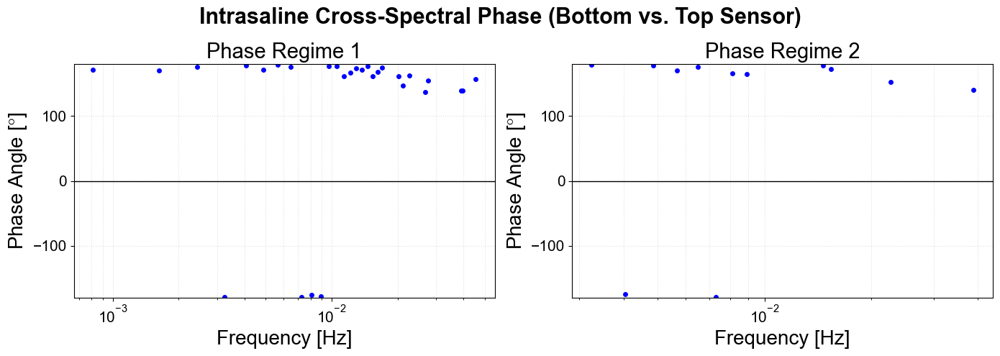

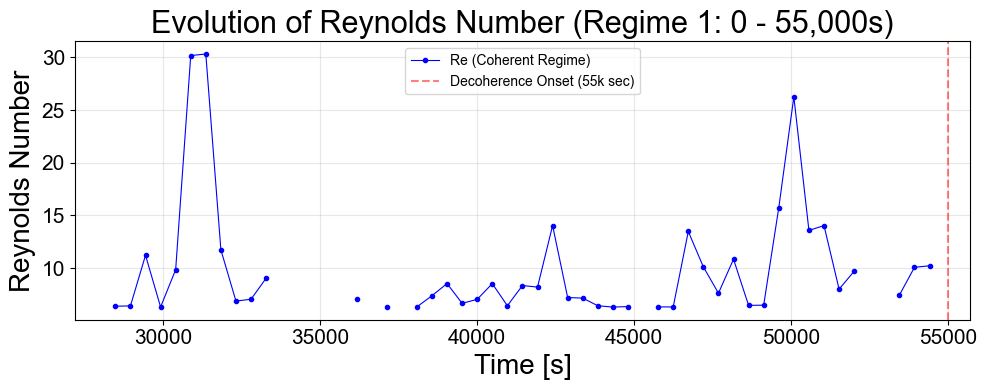

C:\Users\jeanv\AppData\Local\Temp\ipykernel_29320\2344913122.py:389: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[0, 1].legend()
C:\Users\jeanv\AppData\Local\Temp\ipykernel_29320\2344913122.py:416: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axs[1, 1].legend(fontsize="xx-large")


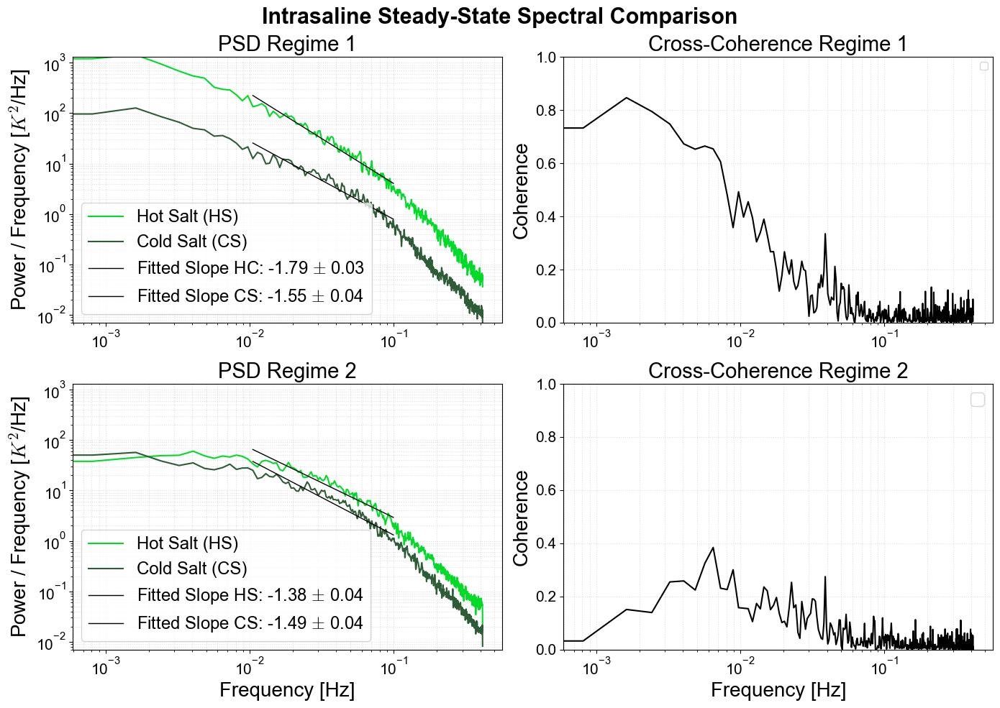

--- Analysis Complete ---


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

# ==========================================
# CORE ANALYSIS FUNCTIONS
# ==========================================

def calculate_window_reynolds(t_window, T_b_window, T_t_window, L, nu, min_delay, max_delay, corr_threshold):
    """
    Calculates the Reynolds number for a SINGLE slice of time.
    Includes detrending, search window restrictions, and confidence filtering.
    """
    dt = t_window[1] - t_window[0]
    
    # 1. Detrend to remove slow heating/cooling drifts
    T_b_fluc = signal.detrend(T_b_window)
    T_t_fluc = signal.detrend(T_t_window)
    
    # 2. Cross-correlation
    corr = signal.correlate(T_t_fluc, T_b_fluc, mode='full')
    lags = signal.correlation_lags(len(T_t_window), len(T_b_window)) * dt
    
    # 3. Filter for positive lags only
    pos_mask = lags > 0
    pos_lags = lags[pos_mask]
    pos_corr = corr[pos_mask]
    
    # 4. Restrict Search to PHYSICAL bounds
    min_idx = np.searchsorted(pos_lags, min_delay)
    max_idx = np.searchsorted(pos_lags, max_delay)
    
    if min_idx >= len(pos_lags) or min_idx >= max_idx:
        return np.nan
        
    search_corr = pos_corr[min_idx:max_idx]
    
    # 5. Find the peak inside the physical window
    local_peak_idx = np.argmax(search_corr)
    max_corr_value = search_corr[local_peak_idx]
    
    # 6. CONFIDENCE FILTER (Handles decoherence)
    if max_corr_value < corr_threshold:
        return np.nan  
    
    # 7. Calculate Reynolds
    true_peak_idx = local_peak_idx + min_idx
    time_delay = pos_lags[true_peak_idx]
    
    Re = (L**2) / (nu * time_delay)
    return Re


def run_sliding_window_velocimetry(t, T_bottom, T_top, L, nu, window_sec, step_sec, min_delay, max_delay, corr_threshold):
    """
    Slides a window across the dataset to calculate Re over time.
    """
    dt = t[1] - t[0]
    window_pts = int(window_sec / dt)
    step_pts = int(step_sec / dt)
    
    time_centers, Re_evolution = [], []
    
    for start in range(0, len(t) - window_pts, step_pts):
        end = start + window_pts
        Re = calculate_window_reynolds(
            t[start:end], T_bottom[start:end], T_top[start:end], 
            L, nu, min_delay, max_delay, corr_threshold
        )
        time_centers.append(t[start + window_pts // 2])
        Re_evolution.append(Re)
        
    return np.array(time_centers), np.array(Re_evolution)


# ==========================================
# MAIN EXECUTION PIPELINE
# ==========================================
if __name__ == "__main__":
    print("--- Starting Molten Salt Convection Analysis ---")

    # ---------------------------------------------------------
    # 1. GENERATE MOCK DATA (Replace with your actual CSV/Data load)
    # ---------------------------------------------------------
    t_total = CH0_timeR
    T_bottom = CH1_yR
    T_top = CH0_yR
    
    # Simulate Regime 1 (Coherent flow, stable 45s delay)
    coherent_mask = t_total < 54000

    # ---------------------------------------------------------
    # 2. SYSTEM PARAMETERS & ANALYSIS KNOBS
    # ---------------------------------------------------------
    # Physical Params
    L = 0.0435                     # Container height [m]
    nu = 2e-6                # Kinematic viscosity [m^2/s]
    
    # Velocimetry Params
    window_sec = 960            # Sliding window size [s]
    step_sec = 480              # Sliding window step [s]
    min_physical_delay = 15     # Bounds for peak search [s]
    max_physical_delay = 150    
    correlation_threshold = 50  # Confidence filter (TUNE THIS for real data)
    
    # Spectral Params
    fs = 0.83                    # Sampling frequency [Hz]
    nperseg_val = 1024          # Welch window size (Resolution vs Smoothness)


    # ---------------------------------------------------------
    # 3. EXPLICITLY SPLIT THE ARRAYS
    # ---------------------------------------------------------
    split_idx = np.searchsorted(t_total, 55000)

    # Regime 1: Coherent 
    t_R1, T_b_R1, T_t_R1 = t_total[:split_idx], T_bottom[:split_idx], T_top[:split_idx]
    
    # Regime 2: Decohered 
    t_R2, T_b_R2, T_t_R2 = t_total[split_idx:], T_bottom[split_idx:], T_top[split_idx:]


    # ---------------------------------------------------------
    # 4. PART A: VELOCIMETRY (On Regime 1 Only)
    # ---------------------------------------------------------
    print("Running Time-Delay Velocimetry on Regime 1...")
    time_centers, Re_array = run_sliding_window_velocimetry(
        t_R1, T_b_R1, T_t_R1, L, nu, window_sec, step_sec, 
        min_physical_delay, max_physical_delay, correlation_threshold
    )

    # ---------------------------------------------------------
    # 5. PART B: SPECTRAL ANALYSIS (Comparing Both Regimes)
    # ---------------------------------------------------------
    print("Running Spectral Analysis (PSD & Coherence) on both regimes...")
    
    # Regime 1 Spectra
    f1_b, Pxx1_b = signal.welch(T_b_R1, fs=fs, nperseg=nperseg_val, detrend='linear')
    f1_t, Pxx1_t = signal.welch(T_t_R1, fs=fs, nperseg=nperseg_val, detrend='linear')
    f1_coh, Cxy1 = signal.coherence(T_b_R1, T_t_R1, fs=fs, nperseg=nperseg_val)

    # Regime 2 Spectra
    f2_b, Pxx2_b = signal.welch(T_b_R2, fs=fs, nperseg=nperseg_val, detrend='linear')
    f2_t, Pxx2_t = signal.welch(T_t_R2, fs=fs, nperseg=nperseg_val, detrend='linear')
    f2_coh, Cxy2 = signal.coherence(T_b_R2, T_t_R2, fs=fs, nperseg=nperseg_val)


    # # Mathematical Slope Fitting (On Regime 2 Bottom Sensor)
    # fit_mask_1b = (f1_b >= 0.01) & (f1_b <= 0.1) # Define Inertial Subrange
    # log_f_1b = np.log10(f1_b[fit_mask_1b])
    # log_P_1b = np.log10(Pxx1_b[fit_mask_1b])
    # slope_1b, intercept_1b = np.polyfit(log_f_1b, log_P_1b, 1)
    # print(f"Calculated Turbulent Exponent (b) for Regime 2: {slope_1b:.3f}")


    # # Mathematical Slope Fitting (On Regime 2 Top Sensor)
    # fit_mask_1t = (f2_t >= 0.01) & (f2_t <= 0.1) # Define Inertial Subrange
    # log_f_1t = np.log10(f2_t[fit_mask_1t])
    # log_P_1t = np.log10(Pxx1_t[fit_mask_1t])
    # slope_1t, intercept_1t = np.polyfit(log_f_1t, log_P_1t, 1)
    # print(f"Calculated Turbulent Exponent (t) for Regime 2: {slope_1t:.3f}")


    # # Mathematical Slope Fitting (On Regime 2 Bottom Sensor)
    # fit_mask_2b = (f2_b >= 0.01) & (f2_b <= 0.1) # Define Inertial Subrange
    # log_f_2b = np.log10(f2_b[fit_mask_2b])
    # log_P_2b = np.log10(Pxx2_b[fit_mask_2b])
    # slope_2b, intercept_2b = np.polyfit(log_f_2b, log_P_2b, 1)
    # print(f"Calculated Turbulent Exponent (b) for Regime 2: {slope_2b:.3f}")


    # # Mathematical Slope Fitting (On Regime 2 Top Sensor)
    # fit_mask_2t = (f2_t >= 0.01) & (f2_t <= 0.1) # Define Inertial Subrange
    # log_f_2t = np.log10(f2_t[fit_mask_2t])
    # log_P_2t = np.log10(Pxx2_t[fit_mask_2t])
    # slope_2t, intercept_2t = np.polyfit(log_f_2t, log_P_2t, 1)
    # print(f"Calculated Turbulent Exponent (t) for Regime 2: {slope_2t:.3f}")

    
    # --- Regime 1: Bottom Sensor (HC) ---
    fit_mask_1b = (f1_b >= 0.01) & (f1_b <= 0.1) 
    log_f_1b = np.log10(f1_b[fit_mask_1b])
    log_P_1b = np.log10(Pxx1_b[fit_mask_1b])
    (slope_1b, intercept_1b), cov_1b = np.polyfit(log_f_1b, log_P_1b, 1, cov=True)
    err_1b = np.sqrt(cov_1b[0, 0])
    print(f"Regime 1 (HC) Slope: {slope_1b:.3f} ± {err_1b:.3f}")

    # --- Regime 1: Top Sensor (CC) ---
    fit_mask_1t = (f1_t >= 0.01) & (f1_t <= 0.1) # Fixed typo: changed f2_t to f1_t
    log_f_1t = np.log10(f1_t[fit_mask_1t])
    log_P_1t = np.log10(Pxx1_t[fit_mask_1t])
    (slope_1t, intercept_1t), cov_1t = np.polyfit(log_f_1t, log_P_1t, 1, cov=True)
    err_1t = np.sqrt(cov_1t[0, 0])
    print(f"Regime 1 (CC) Slope: {slope_1t:.3f} ± {err_1t:.3f}")

    # --- Regime 2: Bottom Sensor (HC) ---
    fit_mask_2b = (f2_b >= 0.01) & (f2_b <= 0.1) 
    log_f_2b = np.log10(f2_b[fit_mask_2b])
    log_P_2b = np.log10(Pxx2_b[fit_mask_2b])
    (slope_2b, intercept_2b), cov_2b = np.polyfit(log_f_2b, log_P_2b, 1, cov=True)
    err_2b = np.sqrt(cov_2b[0, 0])
    print(f"Regime 2 (HC) Slope: {slope_2b:.3f} ± {err_2b:.3f}")

    # --- Regime 2: Top Sensor (CC) ---
    fit_mask_2t = (f2_t >= 0.01) & (f2_t <= 0.1) 
    log_f_2t = np.log10(f2_t[fit_mask_2t])
    log_P_2t = np.log10(Pxx2_t[fit_mask_2t])
    (slope_2t, intercept_2t), cov_2t = np.polyfit(log_f_2t, log_P_2t, 1, cov=True)
    err_2t = np.sqrt(cov_2t[0, 0])
    print(f"Regime 2 (CC) Slope: {slope_2t:.3f} ± {err_2t:.3f}")

    

    # ---------------------------------------------------------
    # SENSITIVITY ANALYSIS — Fitting window uncertainty
    # ---------------------------------------------------------
    print("\n--- Sensitivity Analysis: Slope vs Fitting Window ---")

    windows = [
        (0.008, 0.08),
        (0.010, 0.10),   # current choice
        (0.012, 0.12),
        (0.015, 0.10),
        (0.010, 0.08),
    ]

    sensors = {
        "R1 bottom": (f1_b, Pxx1_b),
        "R1 top":    (f1_t, Pxx1_t),
        "R2 bottom": (f2_b, Pxx2_b),
        "R2 top":    (f2_t, Pxx2_t),
    }

    stat_errors = {
        "R1 bottom": err_1b,
        "R1 top":    err_1t,
        "R2 bottom": err_2b,
        "R2 top":    err_2t,
    }

    slopes_central = {
        "R1 bottom": slope_1b,
        "R1 top":    slope_1t,
        "R2 bottom": slope_2b,
        "R2 top":    slope_2t,
    }

    sensitivity_results = {}

    for sensor_label, (f_arr, P_arr) in sensors.items():
        slopes_this_sensor = []
        print(f"\n  {sensor_label}")
        print(f"  {'Window':>20}   slope")
        print(f"  {'-'*35}")

        for (f_low, f_high) in windows:
            mask = (f_arr >= f_low) & (f_arr <= f_high)
            if mask.sum() < 3:
                print(f"  [{f_low:.3f}, {f_high:.3f}]   -- too few points --")
                continue
            slope_w, _ = np.polyfit(
                np.log10(f_arr[mask]),
                np.log10(P_arr[mask]),
                1
            )
            slopes_this_sensor.append(slope_w)
            marker = "  <-- current" if (f_low == 0.010 and f_high == 0.10) else ""
            print(f"  [{f_low:.3f}, {f_high:.3f}]   {slope_w:+.3f}{marker}")

        # Always store result — even if empty
        s_arr = np.array(slopes_this_sensor)
        sensitivity_results[sensor_label] = s_arr

        # Guard against empty array before calling max/min
        if len(s_arr) == 0:
            print(f"  --> WARNING: no valid windows for this sensor, skipping summary")
            continue

        systematic = (s_arr.max() - s_arr.min()) / 2
        print(f"  --> slope range:  {s_arr.min():.3f} to {s_arr.max():.3f}")
        print(f"  --> systematic uncertainty (half-range): ±{systematic:.3f}")

    # ---------------------------------------------------------
    # SUMMARY TABLE
    # ---------------------------------------------------------
    print("\n--- Full Uncertainty Summary ---")
    print(f"{'Sensor':<12} {'central':>8} {'stat':>10} {'sys':>10}  dominant")
    print("-" * 55)

    for label in sensors:
        s_arr = sensitivity_results[label]
        if len(s_arr) == 0:
            print(f"{label:<12}  -- insufficient data for sensitivity --")
            continue
        sys_err  = (s_arr.max() - s_arr.min()) / 2
        stat_err = stat_errors[label]
        slope_c  = slopes_central[label]
        dominant = "systematic" if sys_err > stat_err else "statistical"
        print(f"{label:<12}  {slope_c:+.3f}   ±{stat_err:.3f} (stat)  "
            f"±{sys_err:.3f} (sys)   {dominant} dominates")
        
    
    # ---------------------------------------------------------
    # 5.5 PHASE ANALYSIS (Cross Spectral Density)
    # ---------------------------------------------------------
    print("Calculating Phase relationships...")
    
    # Calculate Cross-Spectral Density (CSD)
    f1_csd, Pxy1 = signal.csd(T_b_R1, T_t_R1, fs=fs, nperseg=nperseg_val, detrend='linear')
    f2_csd, Pxy2 = signal.csd(T_b_R2, T_t_R2, fs=fs, nperseg=nperseg_val, detrend='linear')
    
    # Extract phase angle in degrees
    phase1_deg = np.angle(Pxy1, deg=True)
    phase2_deg = np.angle(Pxy2, deg=True)

    # --- FIGURE 3: Phase Plots ---
    # We will only plot phase where coherence is relatively strong (> 0.2)
    # to avoid plotting pure random noise.
    coh_threshold = 0.2 
    
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle("Intrasaline Cross-Spectral Phase (Bottom vs. Top Sensor)", fontsize=22, fontweight="bold")

    # Regime 1 Phase
    valid_phase1 = Cxy1 > coh_threshold
    axs[0].semilogx(f1_csd[valid_phase1], phase1_deg[valid_phase1], 'o', color='blue', alpha=1, markersize=4)
    axs[0].set_title("Phase Regime 1", fontsize=21)
    axs[0].set_xlabel("Frequency [Hz]", fontsize=20)
    axs[0].set_ylabel("Phase Angle [$\degree$]", fontsize=20)
    axs[0].set_ylim(-180, 180)
    axs[0].axhline(0, color='black', linewidth=1)
    axs[0].grid(True, which="both", ls=":", alpha=0.4)

    # Regime 2 Phase
    valid_phase2 = Cxy2 > coh_threshold
    axs[1].semilogx(f2_csd[valid_phase2], phase2_deg[valid_phase2], 'o', color='blue', alpha=1, markersize=4)
    axs[1].set_title("Phase Regime 2", fontsize=21)
    axs[1].set_xlabel("Frequency [Hz]", fontsize=20)
    axs[1].set_ylabel("Phase Angle [$\degree$]", fontsize=20)
    axs[1].set_ylim(-180, 180)
    axs[1].axhline(0, color='black', linewidth=1)
    axs[1].grid(True, which="both", ls=":", alpha=0.4)

    plt.tight_layout()
    plt.show()
    # ---------------------------------------------------------
    # 6. GENERATE FIGURES
    # ---------------------------------------------------------
    
    # --- FIGURE 1: Reynolds Number Evolution ---
    plt.figure(figsize=(10, 4))
    plt.plot(time_centers, Re_array, marker='.', linestyle='-', color='blue', linewidth=0.8, markersize=6, label='Re (Coherent Regime)')
    plt.axvline(55000, color='red', linestyle='--', alpha=0.5, label='Decoherence Onset (55k sec)')
    plt.title("Evolution of Reynolds Number (Regime 1: 0 - 55,000s)")
    plt.xlabel("Time [s]")
    plt.ylabel("Reynolds Number")
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # --- FIGURE 2: Spectral Comparison 2x2 Dashboard ---
    fig, axs = plt.subplots(2, 2, figsize=(14, 10))
    fig.suptitle("Intrasaline Steady-State Spectral Comparison", fontsize=22, fontweight="bold")

    # Plot 2.1: Regime 1 PSD
    axs[0, 0].loglog(f1_b, Pxx1_b, label='Hot Salt (HS)', color=colors[1], alpha=1, linewidth=1.5)
    axs[0, 0].loglog(f1_t, Pxx1_t, label='Cold Salt (CS)', color=colors[0], alpha=1, linewidth=1.5)

      # Draw the mathematically fitted line
    fitted_line = (10**intercept_1b) * (f1_b[fit_mask_1b]**slope_1b)
    axs[0, 0].loglog(f1_b[fit_mask_1b], fitted_line, ls="-", linewidth=1.0, label=f'Fitted Slope HC: {slope_1b:.2f} $\pm$ {err_1b:.2f}', color="black", alpha=1)
    fitted_line = (10**intercept_1t) * (f1_t[fit_mask_1t]**slope_1t)
    axs[0, 0].loglog(f1_t[fit_mask_1t], fitted_line, ls="-", linewidth=1.0, label=f'Fitted Slope CS: {slope_1t:.2f} $\pm$ {err_1t:.2f}', color="black", alpha=1)

    axs[0, 0].set_title("PSD Regime 1", fontsize=21)
    axs[0, 0].set_ylabel("Power / Frequency [$K^2$/Hz]", fontsize=20)
    axs[0, 0].grid(True, which="both", ls=":", alpha=0.4)
    axs[0,0].set_ylim(0.7e-2, 1300)
    axs[0, 0].legend(fontsize="xx-large")

    # Plot 2.2: Regime 1 Coherence
    axs[0, 1].semilogx(f1_coh, Cxy1, color='black')
    #axs[0, 1].axhline(0.1, color='gray', linestyle='--', label='Noise Floor')
    axs[0, 1].set_title("Cross-Coherence Regime 1", fontsize=21)
    axs[0, 1].set_ylabel("Coherence", fontsize=20)
    axs[0, 1].grid(True, which="both", ls=":", alpha=0.4)
    axs[0, 1].set_ylim(0,1)
    axs[0, 1].legend()

    # Plot 2.3: Regime 2 PSD with Fitted Slope
    axs[1, 0].loglog(f2_b, Pxx2_b, label='Hot Salt (HS)', color=colors[1], alpha=1, linewidth=1.5)
    axs[1, 0].loglog(f2_t, Pxx2_t, label='Cold Salt (CS)', color=colors[0], alpha=1, linewidth=1.5)

    # Draw the mathematically fitted line
    fitted_line = (10**intercept_2b) * (f2_b[fit_mask_2b]**slope_2b)
    axs[1, 0].loglog(f2_b[fit_mask_2b], fitted_line, ls="-", linewidth=1.0, label=f'Fitted Slope HS: {slope_2b:.2f} $\pm$ {err_2b:.2f}', color="black", alpha=1)
    fitted_line = (10**intercept_2t) * (f2_t[fit_mask_2t]**slope_2t)
    axs[1, 0].loglog(f2_t[fit_mask_2t], fitted_line, ls="-", linewidth=1.0, label=f'Fitted Slope CS: {slope_2t:.2f} $\pm$ {err_2t:.2f}', color="black", alpha=1)

    axs[1, 0].set_title("PSD Regime 2", fontsize=21)
    axs[1, 0].set_xlabel("Frequency [Hz]", fontsize=20)
    axs[1, 0].set_ylabel("Power / Frequency [$K^2$/Hz]", fontsize=20)
    axs[1, 0].grid(True, which="both", ls=":", alpha=0.4)
    axs[1,0].set_ylim(0.7e-2, 1300)
    axs[1, 0].legend(fontsize="xx-large")

    # Plot 2.4: Regime 2 Coherence
    axs[1, 1].semilogx(f2_coh, Cxy2, color='black')
    #axs[1, 1].axhline(0.1, color='gray', linestyle='--', label='Noise Floor')
    axs[1, 1].set_title("Cross-Coherence Regime 2", fontsize=21)
    axs[1, 1].set_xlabel("Frequency [Hz]", fontsize=20)
    axs[1, 1].set_ylabel("Coherence", fontsize=20)
    axs[1, 1].grid(True, which="both", ls=":", alpha=0.4)
    axs[1, 1].set_ylim(0,1)
    axs[1, 1].legend(fontsize="xx-large")

    plt.tight_layout()
    plt.show()
    
    print("--- Analysis Complete ---")

# Coherence Plots: Run 1.0

In [ ]:
## Run 3.1


# Coherence 
window_sizecoh1, step_sizecoh1, npersegcoh1 =   230, 124, 124
win_tcoh1, fcoh1, Z_cohcoh1, _, _, a_cohcoh1, b_cohcoh1, b_err_cohcoh1 = coherenceData(CH0run1, CH1run1, timerun1, window_size=window_sizecoh1, step_size=step_sizecoh1, nperseg=npersegcoh1, logaxis=False, freq_range=[0.005,0.04])


# CH0
window_size031, step_size031, nperseg031 =  230, 124, 124
_, _, Z_psd031, _, _, a_psd031, b_psd031, b_err_psd031 = singleWelch(CH0run1, timerun1, window_size=window_size031, step_size=step_size031, nperseg=nperseg031, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

## CH1
window_size131, step_size131, nperseg131 =  230, 124, 124
_, _, Z_psd131, _, _, a_psd131, b_psd131, b_err_psd131 = singleWelch(CH1run1, timerun1, window_size=window_size131, step_size=step_size131, nperseg=nperseg131, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


import numpy as np

# 3. Combined Saline Channles Run 3
plt.figure(figsize=(14, 6))

# Plot the combined data
plt.errorbar(win_tcoh1, b_cohcoh1, yerr=b_err_cohcoh1, fmt='o', 
             ecolor='gray', elinewidth=1, capsize=2, ms=4, 
             label='Measured Exponent $b \pm \sigma$')

# Add a vertical line to show where Run 2 starts
plt.axvline(x=win_tcoh1[-1], color='red', linestyle='--', alpha=0.5, label='Start of Run 2')

# Add theoretical reference lines
plt.axhline(-1.33, color='green', ls='-.', label='Theory (-1.33)')
plt.axhline(-1.67, color='blue', ls='-.', label='Theory (-1.67)')

plt.xlabel("Time [s]")
plt.ylabel("Exponent Value ($b$)")
plt.title("Continuous Evolution of Power Law Exponent: Run 1 & 2 Combined")
plt.legend()
plt.grid(True, alpha=0.2)
plt.show()

plotOverviewDashboard("Run 1, Intrasaline (CH0, CH1)", fcoh1, win_tcoh1, Z_cohcoh1, Z_psd031, Z_psd131, b_cohcoh1, b_psd031, b_psd131, a_cohcoh1, b_errors=b_err_cohcoh1, cmap="viridis", color_singlechannels=[colors[0], colors[1]], location="intra")



In [ ]:
## Run 1.0: Extrasaline


# Coherence 
window_sizecoh1, step_sizecoh1, npersegcoh1 =   230, 124, 124
win_tcoh1, fcoh1, Z_cohcoh1, _, _, a_cohcoh1, b_cohcoh1, b_err_cohcoh1 = coherenceData(CH2run1, CH3run1, timerun1, window_size=window_sizecoh1, step_size=step_sizecoh1, nperseg=npersegcoh1, logaxis=False, freq_range=[0.005,0.04])


# CH2
window_size031, step_size031, nperseg031 =  230, 124, 124
_, _, Z_psd031, _, _, a_psd031, b_psd031, b_err_psd031 = singleWelch(CH2run1, timerun1, window_size=window_size031, step_size=step_size031, nperseg=nperseg031, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

## CH3
window_size131, step_size131, nperseg131 =  230, 124, 124
_, _, Z_psd131, _, _, a_psd131, b_psd131, b_err_psd131 = singleWelch(CH3run1, timerun1, window_size=window_size131, step_size=step_size131, nperseg=nperseg131, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


import numpy as np

# 3. Combined Saline Channles Run 3
plt.figure(figsize=(14, 6))

# Plot the combined data
plt.errorbar(win_tcoh1, b_cohcoh1, yerr=b_err_cohcoh1, fmt='o', 
             ecolor='gray', elinewidth=1, capsize=2, ms=4, 
             label='Measured Exponent $b \pm \sigma$')

# Add a vertical line to show where Run 2 starts
plt.axvline(x=win_tcoh1[-1], color='red', linestyle='--', alpha=0.5, label='Start of Run 2')

# Add theoretical reference lines
plt.axhline(-1.33, color='green', ls='-.', label='Theory (-1.33)')
plt.axhline(-1.67, color='blue', ls='-.', label='Theory (-1.67)')

plt.xlabel("Time [s]")
plt.ylabel("Exponent Value ($b$)")
plt.title("Continuous Evolution of Power Law Exponent: Run 1 & 2 Combined")
plt.legend()
plt.grid(True, alpha=0.2)
plt.show()

plotOverviewDashboard("Run 1, Extrasaline (CH2, CH3)", fcoh1, win_tcoh1, Z_cohcoh1, Z_psd031, Z_psd131, b_cohcoh1, b_psd031, b_psd131, a_cohcoh1, b_errors=b_err_cohcoh1, cmap="magma", color_singlechannels=[colors[2], colors[3]], location="extra")



# Coherence Plots: Assembly of Run 3.1 and 3.2

In [ ]:
## Run 3.1


# Coherence 
window_sizecoh1, step_sizecoh1, npersegcoh1 =   2280, 570, 570
win_tcoh1, fcoh1, Z_cohcoh1, _, _, a_cohcoh1, b_cohcoh1, b_err_cohcoh1 = coherenceData(CH0run3_1, CH1run3_1, timerun3_1, window_size=window_sizecoh1, step_size=step_sizecoh1, nperseg=npersegcoh1, logaxis=False, freq_range=[0.005,0.04])


# CH0
window_size031, step_size031, nperseg031 =  2048, 570, 570
_, _, Z_psd031, _, _, a_psd031, b_psd031, b_err_psd031 = singleWelch(CH0run3_1, timerun3_1, window_size=window_size031, step_size=step_size031, nperseg=nperseg031, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

## CH1
window_size131, step_size131, nperseg131 =  2280, 570, 570
_, _, Z_psd131, _, _, a_psd131, b_psd131, b_err_psd131 = singleWelch(CH1run3_1, timerun3_1, window_size=window_size131, step_size=step_size131, nperseg=nperseg131, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Run 3.2

# Coherence 
window_sizecoh2, step_sizecoh2, npersegcoh2 =  2280, 570, 570
win_tcoh2, fcoh2, Z_cohcoh2, _, _, a_cohcoh2, b_cohcoh2, b_err_cohcoh2 = coherenceData(CH0run3_2, CH1run3_2, timerun3_2, window_size=window_sizecoh2, step_size=step_sizecoh2, nperseg=npersegcoh2, logaxis=False, freq_range=[0.005,0.04])

# CH0
window_size032, step_size032, nperseg032 =   2280, 570, 570
_, _, Z_psd032, _, _, a_psd032, b_psd032, b_err_psd032 = singleWelch(CH0run3_2, timerun3_2, window_size=window_size032, step_size=step_size032, nperseg=nperseg032, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# # CH1
window_size132, step_size132, nperseg132 =   2280, 570, 570
_, _, Z_psd132, _, _, a_psd132, b_psd132, b_err_psd132 = singleWelch(CH1run3_2, timerun3_2, window_size=window_size132, step_size=step_size132, nperseg=nperseg132, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Assembled

if not np.allclose(fcoh1, fcoh2):
    print("Warning: Frequencies do not match exactly. Heatmaps may not align!")
    # Use fcoh1 as the master frequency
    f_total = fcoh1
else:
    f_total = fcoh1
# --- 2. Concatenate 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Stack 2D Matrices (Heatmaps) ---
# np.hstack adds the new columns (time windows) to the right of the first matrix
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# Z_psd0tot = np.concatenate([Z_psd031, Z_psd032])
# a_psd0tot = np.concatenate([a_psd031, a_psd032])
# b_psd0tot = np.concatenate([b_psd031, b_psd032])
# b_err_psd0tot = np.concatenate([b_err_psd031, b_err_psd032])

# # --- 3. Stack 2D Matrices (Heatmaps) ---
# # np.hstack adds the new columns (time windows) to the right of the first matrix


# Z_psd1tot = np.concatenate([Z_psd131, Z_psd132])
# a_psd1tot = np.concatenate([a_psd131, a_psd132])
# b_psd1tot = np.concatenate([b_psd131, b_psd132])
# b_err_psd1tot = np.concatenate([b_err_psd131, b_err_psd132])

import numpy as np

# --- 1. Handle Time Offset ---
# Calculate the end of the first run
t_end_run1 = win_tcoh1[-1] 
# Shift run 2 so it starts right after run 1
win_tcoh2_shifted = win_tcoh2 + t_end_run1

# --- 2. Merge 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2_shifted])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Merge 2D Matrices (The Heatmaps) ---
# We use hstack (horizontal stack) to add columns for the new time windows
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# --- 4. Merge PSD variables if you have them for the dashboard ---
# (Repeat the same logic for Z_psd0, Z_psd1, b_psd0, b_psd1)
Z_psd0_total = np.hstack([Z_psd031, Z_psd032])
Z_psd1_total = np.hstack([Z_psd131, Z_psd132])
b_psd0_total = np.concatenate([b_psd031, b_psd032])
b_psd1_total = np.concatenate([b_psd131, b_psd132])

# --- 5. Frequency ---
# We assume the frequency bins are the same for both runs
f_total = fcoh1


# 3. Combined Saline Channles Run 3
plt.figure(figsize=(14, 6))

# Plot the combined data
plt.errorbar(win_t_total, b_coh_total, yerr=b_err_total, fmt='o', 
             ecolor='gray', elinewidth=1, capsize=2, ms=4, 
             label='Measured Exponent $b \pm \sigma$')

# Add a vertical line to show where Run 2 starts
plt.axvline(x=win_tcoh1[-1], color='red', linestyle='--', alpha=0.5, label='Start of Run 2')

# Add theoretical reference lines
plt.axhline(-1.33, color='green', ls='-.', label='Theory (-1.33)')
plt.axhline(-1.67, color='blue', ls='-.', label='Theory (-1.67)')

plt.xlabel("Time [s]")
plt.ylabel("Exponent Value ($b$)")
plt.title("Continuous Evolution of Power Law Exponent: Run 1 & 2 Combined")
plt.legend()
plt.grid(True, alpha=0.2)
plt.show()

plotOverviewDashboard("Run 3, Intrasaline (CH0, CH1)", f_total, win_t_total, Z_coh_total, Z_psd0_total, Z_psd1_total, b_coh_total, b_psd0_total, b_psd1_total, a_coh_total, b_errors=b_err_total, cmap="viridis", color_singlechannels=[colors[0], colors[1]], location="intra")



In [ ]:
## Run 3:1


# Coherence 
window_sizecoh1, step_sizecoh1, npersegcoh1 =   2280, 570, 570
win_tcoh1, fcoh1, Z_cohcoh1, _, _, a_cohcoh1, b_cohcoh1, b_err_cohcoh1 = coherenceData(CH2run3_1, CH3run3_1, timerun3_1, window_size=window_sizecoh1, step_size=step_sizecoh1, nperseg=npersegcoh1, logaxis=True, freq_range=[0.005,0.04])


# CH0
window_size031, step_size031, nperseg031 =  2048, 570, 570
_, _, Z_psd031, _, _, a_psd031, b_psd031, b_err_psd031 = singleWelch(CH2run3_1, timerun3_1, window_size=window_size031, step_size=step_size031, nperseg=nperseg031, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

## CH1
window_size131, step_size131, nperseg131 =  2280, 570, 570
_, _, Z_psd131, _, _, a_psd131, b_psd131, b_err_psd131 = singleWelch(CH3run3_1, timerun3_1, window_size=window_size131, step_size=step_size131, nperseg=nperseg131, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Run 3.2

# Coherence 
window_sizecoh2, step_sizecoh2, npersegcoh2 =  2280, 570, 570
win_tcoh2, fcoh2, Z_cohcoh2, _, _, a_cohcoh2, b_cohcoh2, b_err_cohcoh2 = coherenceData(CH2run3_2, CH3run3_2, timerun3_2, window_size=window_sizecoh2, step_size=step_sizecoh2, nperseg=npersegcoh2, logaxis=True, freq_range=[0.005,0.04])

# CH0
window_size032, step_size032, nperseg032 =   2280, 570, 570
_, _, Z_psd032, _, _, a_psd032, b_psd032, b_err_psd032 = singleWelch(CH2run3_2, timerun3_2, window_size=window_size032, step_size=step_size032, nperseg=nperseg032, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# # CH1
window_size132, step_size132, nperseg132 =   2280, 570, 570
_, _, Z_psd132, _, _, a_psd132, b_psd132, b_err_psd132 = singleWelch(CH3run3_2, timerun3_2, window_size=window_size132, step_size=step_size132, nperseg=nperseg132, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Assembled

if not np.allclose(fcoh1, fcoh2):
    print("Warning: Frequencies do not match exactly. Heatmaps may not align!")
    # Use fcoh1 as the master frequency
    f_total = fcoh1
else:
    f_total = fcoh1
# --- 2. Concatenate 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Stack 2D Matrices (Heatmaps) ---
# np.hstack adds the new columns (time windows) to the right of the first matrix
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# Z_psd0tot = np.concatenate([Z_psd031, Z_psd032])
# a_psd0tot = np.concatenate([a_psd031, a_psd032])
# b_psd0tot = np.concatenate([b_psd031, b_psd032])
# b_err_psd0tot = np.concatenate([b_err_psd031, b_err_psd032])

# # --- 3. Stack 2D Matrices (Heatmaps) ---
# # np.hstack adds the new columns (time windows) to the right of the first matrix


# Z_psd1tot = np.concatenate([Z_psd131, Z_psd132])
# a_psd1tot = np.concatenate([a_psd131, a_psd132])
# b_psd1tot = np.concatenate([b_psd131, b_psd132])
# b_err_psd1tot = np.concatenate([b_err_psd131, b_err_psd132])

import numpy as np

# --- 1. Handle Time Offset ---
# Calculate the end of the first run
t_end_run1 = win_tcoh1[-1] 
# Shift run 2 so it starts right after run 1
win_tcoh2_shifted = win_tcoh2 + t_end_run1

# --- 2. Merge 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2_shifted])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Merge 2D Matrices (The Heatmaps) ---
# We use hstack (horizontal stack) to add columns for the new time windows
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# --- 4. Merge PSD variables if you have them for the dashboard ---
# (Repeat the same logic for Z_psd0, Z_psd1, b_psd0, b_psd1)
Z_psd0_total = np.hstack([Z_psd031, Z_psd032])
Z_psd1_total = np.hstack([Z_psd131, Z_psd132])
b_psd0_total = np.concatenate([b_psd031, b_psd032])
b_psd1_total = np.concatenate([b_psd131, b_psd132])

# --- 5. Frequency ---
# We assume the frequency bins are the same for both runs
f_total = fcoh1


# 3. Combined Saline Channles Run 3
plt.figure(figsize=(14, 6))

# Plot the combined data
plt.errorbar(win_t_total, b_coh_total, yerr=b_err_total, fmt='o', 
             ecolor='gray', elinewidth=1, capsize=2, ms=4, 
             label='Measured Exponent $b \pm \sigma$')

# Add a vertical line to show where Run 2 starts
plt.axvline(x=win_tcoh1[-1], color='red', linestyle='--', alpha=0.5, label='Start of Run 2')

# Add theoretical reference lines
plt.axhline(-1.33, color='green', ls='-.', label='Theory (-1.33)')
plt.axhline(-1.67, color='blue', ls='-.', label='Theory (-1.67)')

plt.xlabel("Time [s]")
plt.ylabel("Exponent Value ($b$)")
plt.title("Continuous Evolution of Power Law Exponent: Run 1 & 2 Combined")
plt.legend()
plt.grid(True, alpha=0.2)
plt.show()

plotOverviewDashboard("Run 3, Extrasaline (CH2, CH3)", f_total, win_t_total, Z_coh_total, Z_psd0_total, Z_psd1_total, b_coh_total, b_psd0_total, b_psd1_total, a_coh_total, b_errors=b_err_total, cmap="magma", color_singlechannels=[colors[2], colors[3]], location="extra")



# Coherence Plots: Assembly of Run 2.1 and 2.2

In [ ]:
## Run 2.1


# Coherence 
window_sizecoh1, step_sizecoh1, npersegcoh1 =   256, 128, 128
win_tcoh1, fcoh1, Z_cohcoh1, _, _, a_cohcoh1, b_cohcoh1, b_err_cohcoh1 = coherenceData(CH0run2_1, CH1run2_1, timerun2_1, window_size=window_sizecoh1, step_size=step_sizecoh1, nperseg=npersegcoh1, logaxis=False, freq_range=[0.005,0.04])


# CH0
window_size021, step_size021, nperseg021 =  256, 128, 128
_, _, Z_psd021, _, _, a_psd021, b_psd021, b_err_psd021 = singleWelch(CH0run2_1, timerun2_1, window_size=window_size021, step_size=step_size021, nperseg=nperseg021, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

## CH1
window_size121, step_size121, nperseg121 =  256, 128, 128
_, _, Z_psd121, _, _, a_psd121, b_psd121, b_err_psd121 = singleWelch(CH1run2_1, timerun2_1, window_size=window_size121, step_size=step_size121, nperseg=nperseg121, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Run 2.2


timerun2_R, CH0run2_yR = rangeSelector(CH0run2_2, timerun2_2, [0, 10000])
timerun2_R, CH1run2_yR = rangeSelector(CH1run2_2, timerun2_2, [0, 10000])
timerun2_R, CH2run2_yR = rangeSelector(CH2run2_2, timerun2_2, [0, 10000])
timerun2_R, CH3run2_yR = rangeSelector(CH3run2_2, timerun2_2, [0, 10000])

# Coherence 
window_sizecoh2, step_sizecoh2, npersegcoh2 =  256, 128, 128
win_tcoh2, fcoh2, Z_cohcoh2, _, _, a_cohcoh2, b_cohcoh2, b_err_cohcoh2 = coherenceData(CH0run2_yR, CH1run2_yR, timerun2_R, window_size=window_sizecoh2, step_size=step_sizecoh2, nperseg=npersegcoh2, logaxis=False, freq_range=[0.005,0.04])

# CH0
window_size022, step_size022, nperseg022 =   256, 128, 128
_, _, Z_psd022, _, _, a_psd022, b_psd022, b_err_psd022 = singleWelch(CH0run2_yR, timerun2_R, window_size=window_size022, step_size=step_size022, nperseg=nperseg022, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# # CH1
window_size122, step_size122, nperseg122 =   256, 128, 128
_, _, Z_psd122, _, _, a_psd122, b_psd122, b_err_psd122 = singleWelch(CH1run2_yR, timerun2_R, window_size=window_size122, step_size=step_size122, nperseg=nperseg122, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Assembled

if not np.allclose(fcoh1, fcoh2):
    print("Warning: Frequencies do not match exactly. Heatmaps may not align!")
    # Use fcoh1 as the master frequency
    f_total = fcoh1
else:
    f_total = fcoh1
# --- 2. Concatenate 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Stack 2D Matrices (Heatmaps) ---
# np.hstack adds the new columns (time windows) to the right of the first matrix
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# Z_psd0tot = np.concatenate([Z_psd031, Z_psd032])
# a_psd0tot = np.concatenate([a_psd031, a_psd032])
# b_psd0tot = np.concatenate([b_psd031, b_psd032])
# b_err_psd0tot = np.concatenate([b_err_psd031, b_err_psd032])

# # --- 3. Stack 2D Matrices (Heatmaps) ---
# # np.hstack adds the new columns (time windows) to the right of the first matrix


# Z_psd1tot = np.concatenate([Z_psd131, Z_psd132])
# a_psd1tot = np.concatenate([a_psd131, a_psd132])
# b_psd1tot = np.concatenate([b_psd131, b_psd132])
# b_err_psd1tot = np.concatenate([b_err_psd131, b_err_psd132])

import numpy as np

# --- 1. Handle Time Offset ---
# Calculate the end of the first run
t_end_run1 = win_tcoh1[-1] 
# Shift run 2 so it starts right after run 1
win_tcoh2_shifted = win_tcoh2 + t_end_run1

# --- 2. Merge 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2_shifted])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Merge 2D Matrices (The Heatmaps) ---
# We use hstack (horizontal stack) to add columns for the new time windows
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# --- 4. Merge PSD variables if you have them for the dashboard ---
# (Repeat the same logic for Z_psd0, Z_psd1, b_psd0, b_psd1)
Z_psd0_total = np.hstack([Z_psd021, Z_psd022])
Z_psd1_total = np.hstack([Z_psd121, Z_psd122])
b_psd0_total = np.concatenate([b_psd021, b_psd022])
b_psd1_total = np.concatenate([b_psd121, b_psd122])

# --- 5. Frequency ---
# We assume the frequency bins are the same for both runs
f_total = fcoh1


# --- 3. Plot the combined Evolution ---
plt.figure(figsize=(14, 6))

# Plot the combined data
plt.errorbar(win_t_total, b_coh_total, yerr=b_err_total, fmt='o', 
             ecolor='gray', elinewidth=1, capsize=2, ms=4, 
             label='Measured Exponent $b \pm \sigma$')

# Add a vertical line to show where Run 2 starts
plt.axvline(x=win_tcoh1[-1], color='red', linestyle='--', alpha=0.5, label='Start of Run 2')

# Add theoretical reference lines
plt.axhline(-1.33, color='green', ls='-.', label='Theory (-1.33)')
plt.axhline(-1.67, color='blue', ls='-.', label='Theory (-1.67)')

plt.xlabel("Time [s]")
plt.ylabel("Exponent Value ($b$)")
plt.title("Continuous Evolution of Power Law Exponent: Run 2 Combined")
plt.legend()
plt.grid(True, alpha=0.2)
plt.show()

plotOverviewDashboard("Run 2, Intrasaline (CH0, CH1)", f_total, win_t_total, Z_coh_total, Z_psd0_total, Z_psd1_total, b_coh_total, b_psd0_total, b_psd1_total, a_coh_total, b_errors=b_err_total, cmap="viridis", color_singlechannels=[colors[0], colors[1]], location="intra")



In [ ]:
## Run 2.1


# Coherence 
window_sizecoh1, step_sizecoh1, npersegcoh1 =   256, 128, 128
win_tcoh1, fcoh1, Z_cohcoh1, _, _, a_cohcoh1, b_cohcoh1, b_err_cohcoh1 = coherenceData(CH2run2_1, CH3run2_1, timerun2_1, window_size=window_sizecoh1, step_size=step_sizecoh1, nperseg=npersegcoh1, logaxis=False, freq_range=[0.005,0.04])


# CH0
window_size021, step_size021, nperseg021 =  256, 128, 128
_, _, Z_psd021, _, _, a_psd021, b_psd021, b_err_psd021 = singleWelch(CH2run2_1, timerun2_1, window_size=window_size021, step_size=step_size021, nperseg=nperseg021, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

## CH1
window_size121, step_size121, nperseg121 =  256, 128, 128
_, _, Z_psd121, _, _, a_psd121, b_psd121, b_err_psd121 = singleWelch(CH3run2_1, timerun2_1, window_size=window_size121, step_size=step_size121, nperseg=nperseg121, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Run 2.2


timerun2_R, CH0run2_yR = rangeSelector(CH0run2_2, timerun2_2, [0, 10000])
timerun2_R, CH1run2_yR = rangeSelector(CH1run2_2, timerun2_2, [0, 10000])
timerun2_R, CH2run2_yR = rangeSelector(CH2run2_2, timerun2_2, [0, 10000])
timerun2_R, CH3run2_yR = rangeSelector(CH3run2_2, timerun2_2, [0, 10000])

# Coherence 
window_sizecoh2, step_sizecoh2, npersegcoh2 =  256, 128, 128
win_tcoh2, fcoh2, Z_cohcoh2, _, _, a_cohcoh2, b_cohcoh2, b_err_cohcoh2 = coherenceData(CH2run2_yR, CH3run2_yR, timerun2_R, window_size=window_sizecoh2, step_size=step_sizecoh2, nperseg=npersegcoh2, logaxis=False, freq_range=[0.005,0.04])

# CH0
window_size022, step_size022, nperseg022 =   256, 128, 128
_, _, Z_psd022, _, _, a_psd022, b_psd022, b_err_psd022 = singleWelch(CH2run2_yR, timerun2_R, window_size=window_size022, step_size=step_size022, nperseg=nperseg022, logaxis=False, freq_range=[0.005,0.04], dtrend=True)

# # CH1
window_size122, step_size122, nperseg122 =   256, 128, 128
_, _, Z_psd122, _, _, a_psd122, b_psd122, b_err_psd122 = singleWelch(CH3run2_yR, timerun2_R, window_size=window_size122, step_size=step_size122, nperseg=nperseg122, logaxis=False, freq_range=[0.005,0.04], dtrend=True)


## Assembled

if not np.allclose(fcoh1, fcoh2):
    print("Warning: Frequencies do not match exactly. Heatmaps may not align!")
    # Use fcoh1 as the master frequency
    f_total = fcoh1
else:
    f_total = fcoh1
# --- 2. Concatenate 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Stack 2D Matrices (Heatmaps) ---
# np.hstack adds the new columns (time windows) to the right of the first matrix
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# Z_psd0tot = np.concatenate([Z_psd031, Z_psd032])
# a_psd0tot = np.concatenate([a_psd031, a_psd032])
# b_psd0tot = np.concatenate([b_psd031, b_psd032])
# b_err_psd0tot = np.concatenate([b_err_psd031, b_err_psd032])

# # --- 3. Stack 2D Matrices (Heatmaps) ---
# # np.hstack adds the new columns (time windows) to the right of the first matrix


# Z_psd1tot = np.concatenate([Z_psd131, Z_psd132])
# a_psd1tot = np.concatenate([a_psd131, a_psd132])
# b_psd1tot = np.concatenate([b_psd131, b_psd132])
# b_err_psd1tot = np.concatenate([b_err_psd131, b_err_psd132])

import numpy as np

# --- 1. Handle Time Offset ---
# Calculate the end of the first run
t_end_run1 = win_tcoh1[-1] 
# Shift run 2 so it starts right after run 1
win_tcoh2_shifted = win_tcoh2 + t_end_run1

# --- 2. Merge 1D Arrays (Time, Slopes, Errors) ---
win_t_total = np.concatenate([win_tcoh1, win_tcoh2_shifted])
a_coh_total = np.concatenate([a_cohcoh1, a_cohcoh2])
b_coh_total = np.concatenate([b_cohcoh1, b_cohcoh2])
b_err_total = np.concatenate([b_err_cohcoh1, b_err_cohcoh2])

# --- 3. Merge 2D Matrices (The Heatmaps) ---
# We use hstack (horizontal stack) to add columns for the new time windows
Z_coh_total = np.hstack([Z_cohcoh1, Z_cohcoh2])

# --- 4. Merge PSD variables if you have them for the dashboard ---
# (Repeat the same logic for Z_psd0, Z_psd1, b_psd0, b_psd1)
Z_psd0_total = np.hstack([Z_psd021, Z_psd022])
Z_psd1_total = np.hstack([Z_psd121, Z_psd122])
b_psd0_total = np.concatenate([b_psd021, b_psd022])
b_psd1_total = np.concatenate([b_psd121, b_psd122])

# --- 5. Frequency ---
# We assume the frequency bins are the same for both runs
f_total = fcoh1


# --- 3. Plot the combined Evolution ---
plt.figure(figsize=(14, 6))

# Plot the combined data
plt.errorbar(win_t_total, b_coh_total, yerr=b_err_total, fmt='o', 
             ecolor='gray', elinewidth=1, capsize=2, ms=4, 
             label='Measured Exponent $b \pm \sigma$')

# Add a vertical line to show where Run 2 starts
plt.axvline(x=win_tcoh1[-1], color='red', linestyle='--', alpha=0.5, label='Start of Run 2')

# Add theoretical reference lines
plt.axhline(-1.33, color='green', ls='-.', label='Theory (-1.33)')
plt.axhline(-1.67, color='blue', ls='-.', label='Theory (-1.67)')

plt.xlabel("Time [s]")
plt.ylabel("Exponent Value ($b$)")
plt.title("Continuous Evolution of Power Law Exponent: Run 2 Combined")
plt.legend()
plt.grid(True, alpha=0.2)
plt.show()

plotOverviewDashboard("Run 2, Extrasaline (CH2, CH3)", f_total, win_t_total, Z_coh_total, Z_psd0_total, Z_psd1_total, b_coh_total, b_psd0_total, b_psd1_total, a_coh_total, b_errors=b_err_total, cmap="magma", color_singlechannels=[colors[0], colors[1]], location="extra")



In [ ]:
# epsilon=0.0001
# indices = np.where((CH3run3_1_fd < epsilon) & (CH3run3_1_fd > -epsilon))[0]
# print(f"Indices where derivative is zero: {indices}")
# # Let 'idx_zero' be your array of indices where derivative == 0
# # Let 'data' be your original temperature array

# # 1. Find where the gaps are (where index[i+1] - index[i] > 1)
# # This identifies the "jump" between different plateaus
# gaps = np.where(np.diff(indices) > 300)[0] + 1

# # 2. Split the indices into separate groups (one for each plateau)
# plateau_groups = np.split(indices, gaps)

# plateau_averages = []

# print("--- Plateau Analysis ---")
# for i, region in enumerate(plateau_groups):
#     # Skip very small "glitches" (e.g., regions with fewer than 10 points)
#     if len(region) < 10:
#         continue
        
#     # Extract the actual temperature values for these indices
#     values = CH3_yR[region]
    
#     avg_temp = np.mean(values)
#     start_time = timerun3_1[region[0]]
#     end_time = timerun3_1[region[-1]]
    
#     plateau_averages.append(avg_temp)
    
#     print(f"Plateau {i+1}: Start {start_time:.1f}s, End {end_time:.1f}s, Avg Temp: {avg_temp:.2f} °C")

# print(plateau_averages)

# epsilons = [0.01, 0.001, 0.0001, 0.00001]  # Example epsilon values for different thresholds
# plt.figure(figsize=(10, 6))
# for i in range(len(epsilons)):
#     epsilon = epsilons[i]
#     indices = np.where((CH3run3_1_fd > -epsilon) & (CH3run3_1_fd < epsilon))[0]
#     plt.scatter(CH3_timeR[indices], CH3_yR[indices], label=f'|dT/dt| < {epsilon}', s=0.5)

# plt.xlabel("Time [s]")
# plt.ylabel("Temperature [°C]")
# plt.title(r"Regions $|dT/dt| < \epsilon$ for varying $\epsilon$ (Run 3)")

# plt.plot(CH3_timeR, CH3_yR, color='gray', alpha=0.5)
# for i, region in enumerate(plateau_groups):
#     if len(region) > 10:
#         plt.hlines(y=np.mean(CH3_yR[region]), xmin=CH3_timeR[region[0]], xmax=CH3_timeR[region[-1]], 
#                    color='red', linewidth=3, label=f"T = {np.mean(CH3run3_1[region]):.2f} °C")
# plt.legend()
# plt.show()


In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy import signal

# # --- Configuration ---
# dt = np.mean(np.diff(timerun2))
# fs_val = 1.0 / dt

# grad = CH1run2 - CH0run2

# # Define your 5 time windows (xmin, xmax)
# windows = [
#     (6000, 7000), (7700, 8800), (9100, 10700)
# ]
# windows_grad = [r"$\Delta T = 19 \degree C$", r"$\Delta T = 25 \degree C$",
#                 r"$\Delta T = 34 \degree C$"]


# plt.figure(figsize=(12, 7))

# # Use a colormap to make the windows look distinct (e.g., transition from blue to red)
# colors = plt.cm.viridis(np.linspace(0, 1, len(windows)))
# for i, (xmin, xmax) in enumerate(windows):
#     # 1. Mask and Extract
#     mask = (timerun2 >= xmin) & (timerun2 <= xmax)
#     segment_grad = grad[mask]
    
#     if len(segment_grad) < 128: # Skip if window is empty or too short
#         continue

#     # 2. Detrend the segment to remove slow thermal drift
#     seg_detrended = signal.detrend(segment_grad)
    
#     # 3. Calculate PSD using Welch's Method
#     # nperseg controls the "smoothness" vs "resolution". 
#     # For ~1000s windows, 512 is usually a sweet spot.
#     f, psd = signal.welch(seg_detrended, fs=fs_val, nperseg=512)
    
#     # 4. Plot each line
#     plt.semilogy(f, psd, color=colors[i], label=f'Window {i+1}: {xmin}-{xmax}s, {windows_grad[i]}', alpha=0.8)

#     # 5. Identify the peak for this specific window
#     peak_idx = np.argmax(psd)
#     print(f"Window {i+1} Peak: {f[peak_idx]:.4f} Hz (Period: {1/f[peak_idx]:.2f} s)")

# # --- Formatting the Chart ---
# plt.title("Evolution of Thermal Gradient Oscillations in Molten NaCl-MgCl2-CeCl3", fontsize=14)
# plt.xlabel("Frequency [Hz]", fontsize=12)
# plt.ylabel("Power Spectral Density [(ΔT)² / Hz]", fontsize=12)
# plt.grid(True, which="both", ls="-", alpha=0.3)
# plt.legend()
# plt.xlim(0, fs_val / 2) # Show up to the Nyquist frequency
# plt.tight_layout()
# plt.show()

In [ ]:
# from scipy.signal import coherence

# # 1. Calculate the Coherence between the two heights
# # This tells you: "At frequency X, how much do these two sensors agree?"
# f_coh, coh = coherence(CH2run2[mask], CH3run2[mask], fs=fs_val, nperseg=512)

# plt.figure(figsize=(10, 4))
# plt.plot(f_coh, coh, color='teal')
# plt.title("Coherence between 15mm and 55mm Sensors")
# plt.xlabel("Frequency [Hz]")
# plt.grid(True)
# plt.show()

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib as mpl

# # --- 1. Data Selection & Masking ---
# xmin, xmax = 4000, 10700
# mask = (timerun2 >= xmin) & (timerun2 <= xmax)

# xw = timerun2[mask]
# yw = CH2run2[mask]   # Channel 1
# y2w = CH3run2[mask]  # Channel 2

# # --- 2. Plotting ---
# fig, ax = plt.subplots(figsize=(10, 6))

# # Define your specific colors here
# color_ch2 = "#8A424F"   # Example: Deep Red
# color_ch3 = "#DB0028"      # Example: Blue-Green

# # Standard plot for solid colors
# ax.plot(xw, yw, color=color_ch2, linewidth=1.2, label="CH2 (15mm)")
# ax.plot(xw, y2w, color=color_ch3, linewidth=1.2, label="CH3 (55mm)")

# # --- 3. Events & Annotations ---
# # Only show events that fall within our xmin/xmax window
# events = [
#     (4600, r"$\downarrow$ 7 [mm]"),
#     (5600, r"$\downarrow$ Argon flow"),
#     (6000, r"$\downarrow$ 5 [mm]"),
#     (7000, r"$\downarrow$ 10 [mm]"),
#     (7200, r"$T_{f} = 900 [°C]$"),
#     (7700, r"$\uparrow$ Argon flow"),
#     (8000, r"$14V$ cooling"),
#     (8500, r"$\downarrow$ 10 [mm]"),
#     (8750, r"$T_{f} = 1000 [°C]$")
# ]

# # Calculate Y-limits for scaling
# ymin_win = min(yw.min(), y2w.min())
# ymax_win = max(yw.max(), y2w.max())
# y_range = ymax_win - ymin_win
# pad = 0.05 * y_range if y_range > 0 else 1.0

# for x, label in events:
#     if xmin <= x <= xmax:
#         ax.axvline(x=x, linestyle="-.", linewidth=1, alpha=0.5, color="black")
#         # Place label at 90% of the visible height
#         ax.annotate(
#             label,
#             xy=(x, ymin_win + 0.85* y_range),
#             xytext=(0, 5), textcoords="offset points",
#             ha="center", va="bottom",
#             rotation=90,
#             fontsize=8,
#             bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="none", alpha=0.7)
#         )

# # --- 4. Formatting ---
# ax.set_xlim(xmin, xmax)
# ax.set_ylim(ymin_win - pad, ymax_win + pad)

# ax.set_xlabel("Time [s]")
# ax.set_ylabel(r"Temperature [°C]") # Changed to Temp since it's raw CH data
# ax.set_title("Thermal Gradient Over Time (Molten Salt)")

# ax.legend(loc='lower right')
# ax.grid(True, which="both", ls="-", alpha=0.2)

# plt.tight_layout()
# plt.show()

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib as mpl
# from matplotlib.collections import LineCollection
# from mpl_toolkits.axes_grid1 import make_axes_locatable
# from scipy import signal

# # --- 1. Data Selection ---
# full_mask = (time >= 4000) & (time <= 10700)
# t_v = time[full_mask]
# c0_v, c1_v, c2_v, c3_v = CH0[full_mask], CH1[full_mask], CH2[full_mask], CH3[full_mask]
# g_v = c1_v - c0_v 
# fs_val = 1.0 / np.mean(np.diff(t_v))

# windows = [(6000, 7000), (7700, 8800), (9100, 10700)]
# cmap_name = 'viridis'
# norm_grad = plt.Normalize(g_v.min(), g_v.max())
# cmap = plt.get_cmap(cmap_name)

# # --- 2. Create Figure ---
# fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 18))

# # --- ROW 1: All 4 Channels ---

# ax1.plot(t_v, c0_v, label='CH0:Upper salt (Cold salt)', color="#2E5C36")
# ax1.plot(t_v, c1_v, label='CH1: Lower salt (Hot salt)', color="#00DB27")
# ax1.plot(t_v, c2_v, label='CH3: Upper crucible', color="#8A424F")
# ax1.plot(t_v, c3_v, label='CH2: Lower crucible', color="#DB0028")


# # Auto-scaling y-axis
# y_all = np.concatenate([c0_v, c1_v, c2_v, c3_v])
# ax1.set_ylim(y_all.min() * 0.98, y_all.max() * 1.05) # Extra top pad for text
# ax1.set_xlim(4000, 10700)
# ax1.set_ylabel("Temp [°C]")
# ax1.legend(loc='upper right', ncol=2)

# # --- ROW 2: Gradient (Heatmap) ---
# points = np.column_stack([t_v, g_v]).reshape(-1, 1, 2)
# segments = np.concatenate([points[:-1], points[1:]], axis=1)
# lc = LineCollection(segments, cmap=cmap_name, norm=norm_grad)
# lc.set_array(g_v)
# lc.set_linewidth(1.5)
# ax2.add_collection(lc)

# ax2.set_xlim(4000, 10700)
# ax2.set_ylim(g_v.min() - 2, g_v.max() + 5)
# ax2.set_ylabel(r"$\Delta T$ [°C]")

# # FIX: Aligning the X-axis by using a dedicated divider for the colorbar
# divider = make_axes_locatable(ax2)
# cax = divider.append_axes("right", size="2%", pad=0.1)
# fig.colorbar(lc, cax=cax, label=r'Grad [°C]')

# # --- ROW 3: Windowed PSD ---
# for i, (w_start, w_end) in enumerate(windows):
#     w_mask = (time >= w_start) & (time <= w_end)
#     seg_g = (CH1 - CH0)[w_mask]
#     avg_val = np.mean(seg_g)
#     win_color = cmap(norm_grad(avg_val))
    
#     f, psd = signal.welch(signal.detrend(seg_g), fs=fs_val, nperseg=512)
#     ax3.semilogy(f, psd, color=win_color, lw=1, label=f'Window {i+1}: {w_start}-{w_end}s, {windows_grad[i]}: ~{avg_val:.1f}°C')

# ax3.set_xlim(0, max(f))
# ax3.set_xlabel("Frequency [Hz]")
# ax3.set_ylabel("Power [(ΔT)² / Hz]")
# ax3.legend()

# # --- Shared Annotations (Fixing the Clipping) ---
# for ax in [ax1, ax2]:
#     for x, label in events:
#         if 4000 <= x <= 10700:
#             # 1. Draw the vertical line
#             ax.axvline(x=x, color='black', linestyle='-', alpha=0.3, zorder=1)
            
#             # 2. Place the text INSIDE the plot area
#             # 'transform=ax.get_xaxis_transform()' allows us to set 
#             # X in data coordinates (seconds) and Y in axis coordinates (0 to 1)
#             ax.annotate(
#                 label, 
#                 xy=(x, 0.95),  # 95% of the way up the plot
#                 xycoords=ax.get_xaxis_transform(),
#                 rotation=90, 
#                 va='top',      # Align the top of the text to the 95% mark
#                 ha='center', 
#                 fontsize=8, 
#                 fontweight='normal',
#                 color='black',
#                 bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="gray", alpha=0.7)
#             )

# # Add titles manually to ensure they don't hit the event labels
# ax1.set_title("CH 0-3: Temperature Profile", pad=10, fontweight='normal')
# ax2.set_title(r"Thermal Gradient $\Delta T$ (Intrasaline, CH1 - CH0)", pad=10, fontweight='normal')
# ax3.set_title(r"Spectral analysis of $\Delta T$ plateaus", pad=10, fontweight='normal')
# ax1.grid(True, color='gray', linestyle='--', alpha=0.3)
# ax2.grid(True, color='gray', linestyle='--', alpha=0.3)
# ax3.grid(True, color='gray', linestyle='--', alpha=0.3)

# plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Manual adjustment to prevent clipping at the very top
# plt.show()

# Stable Gradient Seeker

In [ ]:
# grad = CH1run3_1 - CH0run3_1

# window_length = 1000  # Must be odd and less than the length of grad
# polyorder = 2

# grad_filtered, grad_derivative = savgolCompilator(grad, window_length=window_length, polyorder=polyorder)
# grad_filtered, grad_double_derivative = savgolCompilator(grad, window_length=window_length, polyorder=polyorder, deriv=2, delta=1.0)

# savgolCalcPlotter(grad, timerun3_1, window_length=window_length, polyorder=polyorder, deriv=1, delta=1.0)

# # 3. Plotting Smoothed and Derivative 
# fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(10, 8), sharex=False)

# # Top Plot: Raw vs Smoothed
# ax1.plot(timerun3_1, grad, label='Raw', color='teal', lw=2)
# ax1.plot(timerun3_1, grad_filtered, label='Savgol Smoothed', color='crimson', lw=2)
# ax1.set_ylabel("Temperature [°C]")
# ax1.set_title("Raw vs Smoothed $T$ profile CH1 (Lower salt) - Run 1")
# ax1.set_xlabel("Time [s]")
# ax1.legend()

# # Middle Plot: The Derivative
# ax2.plot(timerun3_1, grad_derivative, color='crimson', lw=1.5)
# ax2.set_ylabel("Rate of Change [°C/s]")
# ax2.set_title("First Derivative (dT/dt) versus smoothed $T$ for Run 3")
# ax2.grid(True, alpha=0.3)

# # Bottom Plot: Double derivative
# ax3.plot(timerun3_1, grad_double_derivative, color='crimson', lw=1.5)
# #ax2.plot(tR1_750, TdR1_750, color='magenta', lw=1.5)
# ax3.set_ylabel("Rate of Change [°C/s]")  # Focus on the same time window as before
# ax3.set_xlabel("Temperature [°C]")
# #ax2.set_xlim(10,46)
# #ax2.set_ylim(-0.05, 0.05)
# ax3.set_title(r"Double Derivative (d²T/dt²) versus smoothed $T$ for Run 3")
# ax3.grid(True, alpha=0.3)


In [ ]:
# epsilon=0.001
# indices = np.where((grad_derivative < epsilon) & (grad_derivative > -epsilon))[0]
# print(f"Indices where derivative is zero: {indices}")
# # Let 'idx_zero' be your array of indices where derivative == 0
# # Let 'data' be your original temperature array

# # 1. Find where the gaps are (where index[i+1] - index[i] > 1)
# # This identifies the "jump" between different plateaus
# gaps = np.where(np.diff(indices) > 300)[0] + 1

# # 2. Split the indices into separate groups (one for each plateau)
# plateau_groups = np.split(indices, gaps)

# plateau_averages = []

# print("--- Plateau Analysis ---")
# for i, region in enumerate(plateau_groups):
#     # Skip very small "glitches" (e.g., regions with fewer than 10 points)
#     if len(region) < 10:
#         continue
        
#     # Extract the actual temperature values for these indices
#     values = grad[region]
    
#     avg_temp = np.mean(values)
#     start_time = timerun3_1[region[0]]
#     end_time = timerun3_1[region[-1]]
    
#     plateau_averages.append(avg_temp)
    
#     print(f"Plateau {i+1}: Start {start_time:.1f}s, End {end_time:.1f}s, Avg Temp: {avg_temp:.2f} °C")

# print(plateau_averages)

# epsilons = [0.01, 0.005, 0.001, 0.0001]  # Example epsilon values for different thresholds
# plt.figure(figsize=(10, 6))
# for i in range(len(epsilons)):
#     epsilon = epsilons[i]
#     indices = np.where((grad_derivative > -epsilon) & (grad_derivative < epsilon))[0]
#     plt.scatter(timerun3_1[indices], grad[indices], label=f'|dT/dt| < {epsilon}', s=0.5)

# plt.xlabel("Time [s]")
# plt.ylabel("Temperature [°C]")
# plt.title(r"Regions $|dT/dt| < \epsilon$ for varying $\epsilon$ (Run 3)")

# plt.plot(timerun3_1, grad, color='gray', alpha=0.5)
# for i, region in enumerate(plateau_groups):
#     if len(region) > 10:
#         plt.hlines(y=np.mean(grad[region]), xmin=timerun3_1[region[0]], xmax=timerun3_1[region[-1]], 
#                    color='red', linewidth=3, label=f"T = {np.mean(grad[region]):.2f} °C")
# plt.legend()
# plt.show()


In [ ]:
# from scipy.stats import linregress

# print("--- Drift Analysis ---")
# for i, region in enumerate(plateau_groups):
#     if len(region) < 100: continue
    
#     t_data = timerun3_1[region]
#     temp_data = grad[region]
    
#     # Perform linear regression on the plateau
#     slope, intercept, r_value, p_value, std_err = linregress(t_data, temp_data)
    
#     # A slope of 0.001 °C/s means it gains 1 degree every 1000 seconds
#     drift_rate_per_hour = slope * 3600 
    
#     print(f"Plateau {i+1}: Slope = {slope:.6f} °C/s ({drift_rate_per_hour:.2f} °C/hr)")
    
#     if p_value < 0.05 and abs(slope) > 1e-4:
#         print("   >> WARNING: Statistically significant upward trend detected.")

#     plt.plot(plateau_groups[i], slope * timerun3_1[plateau_groups[i]] + intercept, color='orange', linestyle='--', label=f"Drift Fit (Plateau {i+1})")

In [ ]:
# plt.figure(figsize=(12, 7))
# plt.plot(timerun3_1, grad, color='gray', alpha=0.3)

# # Sort groups by time to ensure the zigzag looks consistent left-to-right
# plateau_groups = sorted(plateau_groups, key=lambda x: timerun3_1[x[0]])

# # Define a set of heights (in points) to cycle through
# # Level 0: 10pts, Level 1: 35pts, Level 2: 60pts
# height_levels = [10, 35, 60]
# level_idx = 0


# epsilon = 0.001
# plt.scatter(timerun3_1[indices], grad[indices], label=f'|dT/dt| < {epsilon}', s=0.5)


# for i, region in enumerate(plateau_groups):
#     if len(region) < 50:
#         continue
        
#     avg_grad = np.mean(grad[region])
#     t_start = timerun3_1[region[0]]
#     t_end = timerun3_1[region[-1]]
#     t_mid = (t_start + t_end) / 2
    
#     # 1. Select the height level for this label and increment the cycle
#     current_offset = height_levels[level_idx % len(height_levels)]
#     level_idx += 1 
    
#     # 2. Draw the horizontal line
#     plt.hlines(y=avg_grad, xmin=t_start, xmax=t_end, color='red', linewidth=2.5)
    
#     # 3. Annotate with a "Stem" (the vertical line connecting text to data)
#     plt.annotate(
#         f"{avg_grad:.2f} °C", 
#         xy=(t_mid, avg_grad), 
#         xytext=(0, current_offset), 
#         textcoords="offset points",
#         ha='center', va='bottom',
#         fontsize=9, fontweight='bold',
#         color='red',
#         bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="red", alpha=0.9),
#         # This adds a thin line connecting the box to the plateau
#         arrowprops=dict(arrowstyle='-', color='red', alpha=0.4, lw=1)
#     )

# plt.title("Staggered Plateau Labels (No Overlap)")
# plt.xlabel("Time [s]")
# plt.ylabel(r"$\Delta$T [°C]")
# plt.grid(True, alpha=0.2)
# plt.show()

In [ ]:
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# # 1. IDENTIFY INDICES (Use your specific epsilon)
# epsilon = 0.001
# indices = np.where((grad_derivative < epsilon) & (grad_derivative > -epsilon))[0]

# # 2. GROUPING (Use your gap threshold of 100)
# gaps = np.where(np.diff(indices) > 100)[0] + 1
# plateau_groups = np.split(indices, gaps)

# # --- PLOTTING ---
# fig, ax1 = plt.subplots(figsize=(14, 10))

# # Plot raw data
# ax1.plot(timerun3_1, grad, color='darkgray', label='Raw Gradient', lw=1)

# # Plot the scatter points for the steady state regions
# ax1.scatter(timerun3_1[indices], grad[indices], color='black', s=5.0, 
#             label=f'Steady State (|dT/dt| < $\\epsilon$)')

# # Sort groups by time
# plateau_groups = sorted(plateau_groups, key=lambda x: timerun3_1[x[0]])

# # Define staggering levels
# height_levels = [10, 30, 40, 50] # Added a 4th level for high-density packing
# level_idx = 0

# print("--- Plateau Analysis ---")
# for i, region in enumerate(plateau_groups):
#     # MATCH YOUR REFERENCE CODE: Use > 10 so nothing is missed
#     if len(region) <= 10:
#         continue
        
#     avg_grad = np.mean(grad[region])
#     t_start = timerun3_1[region[0]]
#     t_end = timerun3_1[region[-1]]
#     t_mid = (t_start + t_end) / 2
    
#     # Select height level
#     current_offset = height_levels[level_idx % len(height_levels)]
#     level_idx += 1 
    
#     # 1. Draw the horizontal line (Red)
#     ax1.hlines(y=avg_grad, xmin=t_start, xmax=t_end, color='red', linewidth=2.5, zorder=5)
    
#     # 2. Annotate EVERY plateau
#     ax1.annotate(
#         f"{avg_grad:.2f} °C", 
#         xy=(t_mid, avg_grad), 
#         xytext=(0, current_offset), 
#         textcoords="offset points",
#         ha='center', va='bottom',
#         fontsize=8, fontweight='bold', # Smaller font helps with packing
#         color='red',
#         bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="red", alpha=0.9, lw=1),
#         arrowprops=dict(arrowstyle='-', color='red', alpha=0.3, lw=0.8),
#         zorder=6
#     )
    
#     print(f"Region {i+1}: Avg {avg_grad:.2f} °C | Points: {len(region)}")

# ax1.set_title(f"Detected plateaus using Savintsky-Golay Smoothing and Differentiation with parameters: w = {window_length}, p = {polyorder}, $\\epsilon$ = {epsilon}", fontweight='bold')
# ax1.set_xlabel("Time [s]")
# ax1.set_ylabel(r"Temperature [°C]")
# ax1.set_xlim(timerun3_1[0], timerun3_1[-1])
# ax1.grid(True, alpha=0.2)
# ax1.legend(loc='best')



# # --- 1. SET THE ZOOM WINDOW ---
# # Choose the X-range you want to "Highlight" in the top right
# x_zoom_start, x_zoom_end = 4000, 10000

# # ... [Insert your existing Plateau Labeling Loop here] ...

# # --- 3. THE INSET PLOT (The "Top Right" Detail) ---
# # [x_pos, y_pos, width, height] as fractions of the main plot (0 to 1)
# ax_ins = ax1.inset_axes([4000/timerun3_1[len(timerun3_1)-1], 4000/timerun3_1[len(timerun3_1)-1], (10000-4000)/timerun3_1[len(timerun3_1)-1], 0.5]) 

# # Plot the SAME data into the inset
# #ax_ins.scatter(timerun2[indices], grad[indices], color='black', s=3)
# #ax_ins.plot(timerun2, grad, color='darkgray', lw=1)
# ax_ins.plot(immersionTime_run3_1[:, 0], immersionTime_run3_1[:, 1], color='blue', lw=1.0, label='Immersion Depth [mm]')


# # SUBSET the view for the inset
# mask_zoom = (timerun3_1 >= x_zoom_start) & (timerun3_1 <= x_zoom_end)
# y_min, y_max = np.min(immersionTime_run3_1[mask_zoom, 1]), np.max(immersionTime_run3_1[mask_zoom, 1])

# ax_ins.set_xlim(x_zoom_start, x_zoom_end)
# ax_ins.set_ylim(y_min - 1, y_max + 1) # Auto-scale Y to the zoom window

# # Clean up the inset look
# ax_ins.set_title(f"Furnace & Immersion depth profile", fontsize=9, fontweight='bold')
# ax_ins.tick_params(labelsize=8)
# ax_ins.set_xlabel("Time [s]", fontsize=8)
# ax_ins.set_ylabel(r"Immersion Depth [mm]", fontsize=8, color='blue')
# ax_ins.grid(True, alpha=0.2)

# ax_ins2 = ax_ins.twinx()
# ax_ins2.plot(temperatureTime_run3_1[:, 0], temperatureTime_run3_1[:, 1], color='magenta', lw=1.0, label='dT/dt')
# ax_ins2.set_ylabel("Furnace Temp [°C]", color='magenta', fontsize=8)


# # Final Formatting
# ax1.set_xlabel("Time [s]")
# ax1.set_ylabel(r"$\Delta$T [°C]")
# ax1.legend(loc='lower left') 
# plt.show()


In [ ]:
# print(indices)
# # Let 'idx_zero' be your array of indices where derivative == 0
# # Let 'data' be your original temperature array

# # 1. Find where the gaps are (where index[i+1] - index[i] > 1)
# # This identifies the "jump" between different plateaus
# gaps = np.where(np.diff(indices) > 100)[0] + 1

# # 2. Split the indices into separate groups (one for each plateau)
# plateau_groups = np.split(indices, gaps)

# # 3. Calculate the average for each specific region

# # Result: plateau_averages now contains one value per plateau

# 3D Plotting: Immersion, Furnace Temperature, Gradient

# Differential Analysis of Temperature Profiles and Gradients $\Delta T$

Using Savintsky-Golay Filtering and Derivatives


In [ ]:
import numpy as np
import matplotlib.pyplot as plt


# This function applies the Savitzky-Golay filter to a given channel of data, 
# allowing for both smoothing and differentiation


In [ ]:
# 1. Data Processing
## Parameters for Savitzky-Golay filter
window = 51 # Size of the "window" moving across the data
poly = 4 # Degree of polynomial used inside the window for fitting

## Data 
# "Ts" means "temperature smoothed"
# "Td" means "temperature derivative"

### Run 2
TsR2, TdR2 = savgol_compilation(CH1run2, window_length=window, 
                                polyorder=poly, deriv=1)
tR2 = timerun2 # redefine time for simpler notation

### Run 1 @ 750 degree C
TsR1_750, TdR1_750 = savgol_compilation(CH0run1_75015mm, window_length=window, 
                                        polyorder=poly, deriv=1)
tR1_750 = timerun1_75015mm 

# 3. Plotting Smoothed and Derivative 
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=False)

# Top Plot: Raw vs Smoothed
ax1.plot(tR2, TsR2, label='Savgol Smoothed', color='crimson', lw=2)
ax1.plot(tR2, CH1run2, label='Raw', color='teal', lw=2)
ax1.set_ylabel("Temperature [°C]")
ax1.set_title("Raw vs Smoothed $T$ profile CH1 (Lower salt) - Run 2")
ax1.set_xlabel("Time [s]")
ax1.set_xlim(0,4000)
ax1.legend()

# Bottom Plot: The Derivative
ax2.plot(TsR2, TdR2, color='crimson', lw=1.5)
#ax2.plot(tR1_750, TdR1_750, color='magenta', lw=1.5)
ax2.set_ylabel("Rate of Change [°C/s]")  # Focus on the same time window as before
ax2.set_xlabel("Temperature [°C]")
ax2.set_title(r"First Derivative (dT/dt) versus smoothed $T$ for Run 2")
ax2.set_xlim(0,600)

plt.tight_layout()
plt.show()

In [ ]:
# This function calculates and plots the Smoothed Temp and derivative of the desired order. 


savgolCalcPlotter(CH1run2, timerun2, window_length=51, polyorder=4, deriv=1, delta=1.0)


In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
import matplotlib as mpl

grad = CH3run2 - CH1run2
xmin, xmax = 0, 4000

mask = (timerun2 >= xmin) & (timerun2 <= xmax)
xw = timerun2[mask]
yw = grad[mask]


# Build line segments (N-1 segments, each with 2 points)
points = np.column_stack([xw, yw]).reshape(-1, 1, 2)
segments = np.concatenate([points[:-1], points[1:]], axis=1)

# Normalize colors to window range
norm = mpl.colors.Normalize(vmin=yw.min(), vmax=yw.max())
lc = LineCollection(segments, cmap="viridis", norm=norm)
lc.set_array(yw[:-1])      # color each segment by y-value
lc.set_linewidth(1.0)

fig, ax = plt.subplots(figsize=(10, 6))
ax.add_collection(lc)

ax.set_xlim(xmin, xmax)
pad = 0.01*(yw.max()-yw.min()) if yw.max()>yw.min() else 1e-6
ax.set_ylim(yw.min()-pad, yw.max()+pad)



# (event_time, label)
events = [
    (1700, "Melting event"),
]

# y-limits (window-based) so labels place nicely
mask = (timerun2 >= xmin) & (timerun2 <= xmax)
ywin = grad[mask]
ymin, ymax = ywin.min(), ywin.max()
pad = 0.01*(ymax - ymin) if ymax > ymin else 1e-6
ax.set_ylim(ymin - pad, ymax + pad)

for x, label in events:
    ax.axvline(x=x, linestyle="-.", linewidth=1, alpha=0.8, color="black")
    ax.annotate(
        label,
        xy=(x,0.85*ymax),          # anchor at top of plot in data coords
        xytext=(0, 6), textcoords="offset points",
        ha="center", va="bottom",
        rotation=90,
        fontsize=7,
        bbox=dict(boxstyle="round,pad=0.1", fc="white", ec="none", alpha=0.8)
    )

ax.set_xlabel("Time [s]")
ax.set_ylabel(r"$\Delta$T [°C]")
ax.set_title("Thermal Gradient (Extrasaline)")

cbar = fig.colorbar(lc, ax=ax)
cbar.set_label("[°C]")

plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

# --- 1. CONFIGURATION ---
# Replace these with your chosen channels and melting time window
t_array = time       # Your time array
s_channel = CH1      # The channel inside the salt (Sample)
r_channel = CH3      # The channel outside the salt (Reference)

# Define the start and end of the melting event (in seconds)
melt_start, melt_end = 1200, 1600 

# --- 2. SMOOTHING ---
# Window length must be odd (e.g., 51, 101). Larger = smoother.
window = 101 
s_smooth = signal.savgol_filter(s_channel, window, 3)
r_smooth = signal.savgol_filter(r_channel, window, 3)

# Calculate the Differential Signal (DTA)
delta_t = s_smooth - r_smooth

# --- 3. MASKING & INTEGRATION ---
mask = (t_array >= melt_start) & (t_array <= melt_end)
t_melt = t_array[mask]
dt_melt = delta_t[mask]

# Calculate Area (Enthalpy Proxy)
# We use a try/except to handle different versions of NumPy/SciPy
try:
    area = np.trapz(dt_melt, t_melt)
except AttributeError:
    # Newest versions of NumPy/SciPy use 'trapezoid'
    from scipy.integrate import trapezoid
    area = trapezoid(dt_melt, t_melt)

# --- 4. VISUAL VERIFICATION ---
plt.figure(figsize=(10, 5))
plt.plot(t_array, delta_t, label='Smoothed $\Delta T$ (S - R)', color='black')
plt.fill_between(t_melt, dt_melt, color='orange', alpha=0.3, label=f'Melt Area: {area:.2f} °C·s')
plt.axvspan(melt_start, melt_end, color='gray', alpha=0.1, label='Integration Window')

plt.title("Differential Thermal Analysis (DTA) - Melting Peak")
plt.xlabel("Time [s]")
plt.ylabel("$\Delta T$ [°C]")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

print(f"Calculated Enthalpy Proxy (Area): {area:.2f} °C·s")